In [30]:
from multi_imbalance.datasets import load_datasets
import experiment_v3 as ex
from sklearn.model_selection import StratifiedKFold
from collections import Counter, defaultdict
from multi_imbalance.utils.metrics import gmean_score
from sklearn.metrics import f1_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
import numpy as np
import pandas as pd
from sklearn.tree import DecisionTreeClassifier
from utils import plot_embeddings
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis, QuadraticDiscriminantAnalysis

In [31]:
datasets = load_datasets()

In [32]:
ds_name = 'new_vehicle'
test_on_all_folds = True
test_all_ds = True

In [33]:
datasets = ex.one_hot_encode_all(datasets)

In [34]:
config = ex.config_calculation_strategy2(datasets)

In [35]:
config['cmc'] = {'nn_config': {'units_1st_layer': 17,
                               'units_2nd_layer': 256,
                               'units_3rd_layer': 128,
                               'units_latent_layer': 8},
                 'weighted_triplet_loss': True,
                 'lr': 0.0002,
                 'batch_size': 16,
                 'gamma': 0.99,
                 'epochs': 55}


config['dermatology'] = {'nn_config': {'units_1st_layer': 97,
                                       'units_2nd_layer': 512,
                                       'units_3rd_layer': 256,
                                       'units_latent_layer': 16},
                         'weighted_triplet_loss': True,
                         'lr': 0.0010,
                         'batch_size': 16,
                         'gamma': 0.99,
                         'epochs': 45}

config['hayes-roth'] = {'nn_config': {'units_1st_layer': 11,
                                      'units_2nd_layer': 128,
                                      'units_3rd_layer': 64,
                                      'units_latent_layer': 16},
                        'weighted_triplet_loss': True,
                        'lr': 0.0015,
                        'batch_size': 16,
                        'gamma': 0.99,
                        'epochs': 300}

config['new_vehicle'] = {'nn_config': {'units_1st_layer': 18,
                                       'units_2nd_layer': 256,
                                       'units_3rd_layer': 128,
                                       'units_latent_layer': 16},
                         'weighted_triplet_loss': True,
                         'lr': 0.001,
                         'batch_size': 16,
                         'gamma': 0.99,
                         'epochs': 150}

config['new_yeast'] = {'nn_config': {'units_1st_layer': 9,
                                     'units_2nd_layer': 300,
                                     'units_3rd_layer': 200,
                                     'units_latent_layer': 12},
                       'weighted_triplet_loss': True,
                       'lr': 0.0004,
                       'batch_size': 32,
                       'gamma': 0.99,
                       'epochs': 60}

config['balance-scale'] = {'nn_config': {'units_1st_layer': 16,
                                         'units_2nd_layer': 256,
                                         'units_3rd_layer': 128,
                                         'units_latent_layer': 10},
                           'weighted_triplet_loss': True,
                           'lr': 0.007,
                           'batch_size': 16,
                           'gamma': 0.99,
                           'epochs': 100}

config['cleveland'] = {'nn_config': {'units_1st_layer': 24,
                                     'units_2nd_layer': 72,
                                     'units_3rd_layer': 48,
                                     'units_latent_layer': 16},
                       'weighted_triplet_loss': True,
                       'lr': 0.00002,
                       'batch_size': 16,
                       'gamma': 0.99,
                       'epochs': 120}

config['cleveland_v2'] = {'nn_config': {'units_1st_layer': 23,
                                        'units_2nd_layer': 256,
                                        'units_3rd_layer': 128,
                                        'units_latent_layer': 16},
                          'weighted_triplet_loss': True,
                          'lr': 0.00002,
                          'batch_size': 16,
                          'gamma': 0.99,
                          'epochs': 100}

config['glass'] = {'nn_config': {'units_1st_layer': 9,
                                 'units_2nd_layer': 256,
                                 'units_3rd_layer': 128,
                                 'units_latent_layer': 12},
                   'weighted_triplet_loss': True,
                   'lr': 0.001,
                   'batch_size': 16,
                   'gamma': 0.99,
                   'epochs': 120}

config['thyroid-newthyroid'] = {'nn_config': {'units_1st_layer': 5,
                                              'units_2nd_layer': 64,
                                              'units_3rd_layer': 32,
                                              'units_latent_layer': 8},
                                'weighted_triplet_loss': True,
                                'lr': 0.001,
                                'batch_size': 16,
                                'gamma': 0.99,
                                'epochs': 120}

config['new_ecoli'] = {'nn_config': {'units_1st_layer': 7,
                                     'units_2nd_layer': 128,
                                     'units_3rd_layer': 64,
                                     'units_latent_layer': 12},
                       'weighted_triplet_loss': True,
                       'lr': 0.0001,
                       'batch_size': 16,
                       'gamma': 0.99,
                       'epochs': 100}

config['new_led7digit'] = {'nn_config': {'units_1st_layer': 7,
                                         'units_2nd_layer': 64,
                                         'units_3rd_layer': 32,
                                         'units_latent_layer': 8},
                           'weighted_triplet_loss': True,
                           'lr': 0.001,
                           'batch_size': 16,
                           'gamma': 0.99,
                           'epochs': 100}

config['new_winequality-red'] = {'nn_config': {'units_1st_layer': 11,
                                               'units_2nd_layer': 128,
                                               'units_3rd_layer': 64,
                                               'units_latent_layer': 12},
                                 'weighted_triplet_loss': True,
                                 'lr': 0.003,
                                 'batch_size': 16,
                                 'gamma': 0.99,
                                 'epochs': 100}

config['4delikatne-bezover-cut'] = {'nn_config': {'units_1st_layer': 2,
                                                  'units_2nd_layer': 128,
                                                  'units_3rd_layer': 64,
                                                  'units_latent_layer': 8},
                                    'weighted_triplet_loss': True,
                                    'lr': 0.004,
                                    'batch_size': 16,
                                    'gamma': 0.99,
                                    'epochs': 120}

config['3mocniej-cut'] = {'nn_config': {'units_1st_layer': 2,
                                        'units_2nd_layer': 128,
                                        'units_3rd_layer': 64,
                                        'units_latent_layer': 10},
                          'weighted_triplet_loss': True,
                          'lr': 0.04,
                          'batch_size': 16,
                          'gamma': 0.99,
                          'epochs': 90}


config['1czysty-cut'] = {'nn_config': {'units_1st_layer': 2,
                                       'units_2nd_layer': 64,
                                       'units_3rd_layer': 32,
                                       'units_latent_layer': 8},
                         'weighted_triplet_loss': True,
                         'lr': 0.004,
                         'batch_size': 16,
                         'gamma': 0.99,
                         'epochs': 130}

config['2delikatne-cut'] = {'nn_config': {'units_1st_layer': 2,
                                          'units_2nd_layer': 128,
                                          'units_3rd_layer': 64,
                                          'units_latent_layer': 12},
                            'weighted_triplet_loss': True,
                            'lr': 0.04,
                            'batch_size': 16,
                            'gamma': 0.99,
                            'epochs': 90}

In [36]:
config

{'1czysty-cut': {'nn_config': {'units_1st_layer': 2,
   'units_2nd_layer': 64,
   'units_3rd_layer': 32,
   'units_latent_layer': 8},
  'weighted_triplet_loss': True,
  'lr': 0.004,
  'batch_size': 16,
  'gamma': 0.99,
  'epochs': 130},
 '2delikatne-cut': {'nn_config': {'units_1st_layer': 2,
   'units_2nd_layer': 128,
   'units_3rd_layer': 64,
   'units_latent_layer': 12},
  'weighted_triplet_loss': True,
  'lr': 0.04,
  'batch_size': 16,
  'gamma': 0.99,
  'epochs': 90},
 '3mocniej-cut': {'nn_config': {'units_1st_layer': 2,
   'units_2nd_layer': 128,
   'units_3rd_layer': 64,
   'units_latent_layer': 10},
  'weighted_triplet_loss': True,
  'lr': 0.04,
  'batch_size': 16,
  'gamma': 0.99,
  'epochs': 90},
 '4delikatne-bezover-cut': {'nn_config': {'units_1st_layer': 2,
   'units_2nd_layer': 128,
   'units_3rd_layer': 64,
   'units_latent_layer': 8},
  'weighted_triplet_loss': True,
  'lr': 0.004,
  'batch_size': 16,
  'gamma': 0.99,
  'epochs': 120},
 'balance-scale': {'nn_config': {'un

In [37]:
def instantiate_classifiers():
    classifiers = {
            "RF24": RandomForestClassifier(random_state=0, min_samples_leaf=2, min_samples_split=4, class_weight='balanced'),
            "DT": DecisionTreeClassifier(random_state=0, min_samples_split=4, min_samples_leaf=2, class_weight='balanced'),
            "KNN": KNeighborsClassifier(n_neighbors=1),
            "QDA": QuadraticDiscriminantAnalysis(),
            "LDA": LinearDiscriminantAnalysis()
        } 
    return classifiers

In [38]:
from experiment import dt_name_to_cols_to_encode


In [39]:
from sklearn.neighbors import KNeighborsClassifier

def calc_safety5(X,y):
    result = {
        "safe":0,
        "borderline":0,
        "rare":0,
        "outlier":0
    }
    neigh = KNeighborsClassifier(n_neighbors=5)
    neigh.fit(X, y)
    neighbors = neigh.kneighbors(X, 5+1, False)
    for i, (x, nbors) in enumerate(list(zip(X, neighbors))):
#         print(x)
#         print(y[i])
#         print(nbors[1:])
#         print(y[nbors[1:]])
        same_class_nbrs = (y[nbors[1:]] == y[i]).sum()
        if same_class_nbrs >= 4:
            result['safe'] += 1
        elif same_class_nbrs >= 2:
            result['borderline'] += 1
        elif same_class_nbrs == 1:
            result['rare'] += 1
        else:
            result['outlier'] += 1
    return result

In [40]:
def standardize(X_train, X_test):
    means = X_train.mean(axis=0)
    stds = X_train.std(axis=0)
    return (X_train - means) / (stds+1e-6), (X_test - means) / (stds + 1e-6)

cmc


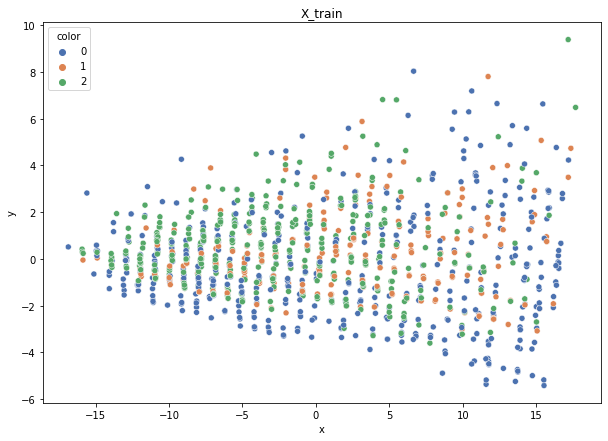

Class cardinalities: Counter({0: 503, 2: 409, 1: 266})
Weights: {0: 0.2426709552796112, 1: 0.45888530265279864, 2: 0.29844374206759033}


100%|██████████| 295/295 [00:00<00:00, 3254.86it/s]


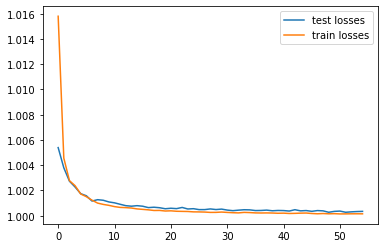

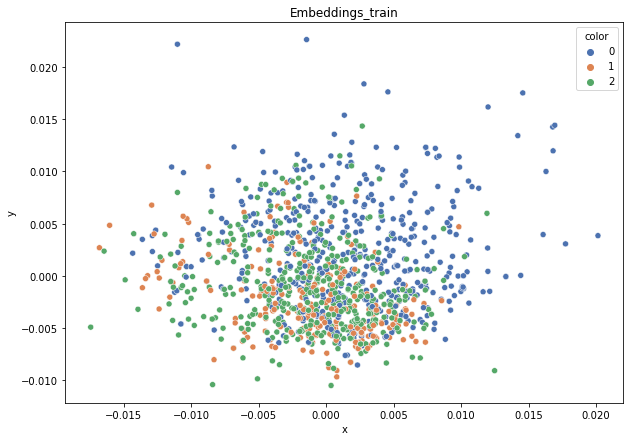

DT-f1-new-features: 0.342
DT-f1-old+new-features: 0.397
DT-f1-old-features: 0.469
DT-gmean-new-features: 0.349
DT-gmean-old+new-features: 0.395
DT-gmean-old-features: 0.467
KNN-f1-new-features: 0.38
KNN-f1-old+new-features: 0.433
KNN-f1-old-features: 0.431
KNN-gmean-new-features: 0.378
KNN-gmean-old+new-features: 0.428
KNN-gmean-old-features: 0.425
LDA-f1-new-features: 0.355
LDA-f1-old+new-features: 0.442
LDA-f1-old-features: 0.482
LDA-gmean-new-features: 0.34
LDA-gmean-old+new-features: 0.441
LDA-gmean-old-features: 0.47
QDA-f1-new-features: 0.442
QDA-f1-old+new-features: 0.454
QDA-f1-old-features: 0.483
QDA-gmean-new-features: 0.44
QDA-gmean-old+new-features: 0.454
QDA-gmean-old-features: 0.496
RF24-f1-new-features: 0.416
RF24-f1-old+new-features: 0.417
RF24-f1-old-features: 0.519
RF24-gmean-new-features: 0.406
RF24-gmean-old+new-features: 0.41
RF24-gmean-old-features: 0.523


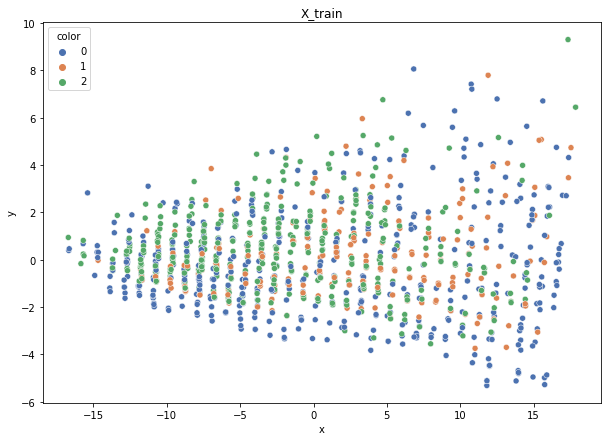

Class cardinalities: Counter({0: 503, 2: 409, 1: 266})
Weights: {0: 0.2426709552796112, 1: 0.45888530265279864, 2: 0.29844374206759033}


100%|██████████| 295/295 [00:00<00:00, 3266.90it/s]


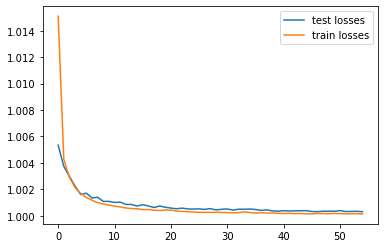

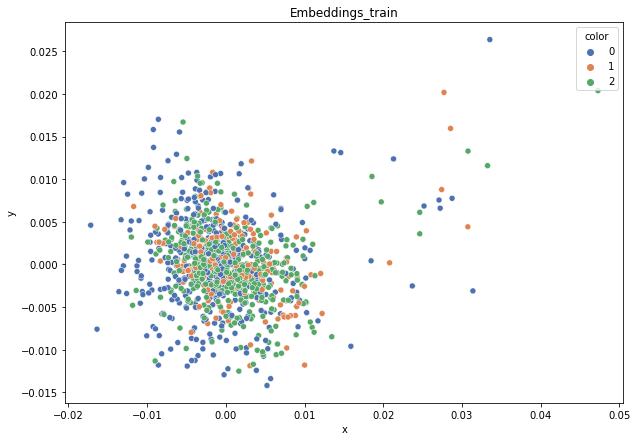

DT-f1-new-features: 0.406
DT-f1-old+new-features: 0.485
DT-f1-old-features: 0.491
DT-gmean-new-features: 0.399
DT-gmean-old+new-features: 0.489
DT-gmean-old-features: 0.503
KNN-f1-new-features: 0.385
KNN-f1-old+new-features: 0.446
KNN-f1-old-features: 0.443
KNN-gmean-new-features: 0.376
KNN-gmean-old+new-features: 0.438
KNN-gmean-old-features: 0.433
LDA-f1-new-features: 0.345
LDA-f1-old+new-features: 0.453
LDA-f1-old-features: 0.501
LDA-gmean-new-features: 0.3
LDA-gmean-old+new-features: 0.451
LDA-gmean-old-features: 0.49
QDA-f1-new-features: 0.369
QDA-f1-old+new-features: 0.479
QDA-f1-old-features: 0.513
QDA-gmean-new-features: 0.336
QDA-gmean-old+new-features: 0.476
QDA-gmean-old-features: 0.528
RF24-f1-new-features: 0.379
RF24-f1-old+new-features: 0.491
RF24-f1-old-features: 0.508
RF24-gmean-new-features: 0.345
RF24-gmean-old+new-features: 0.471
RF24-gmean-old-features: 0.512


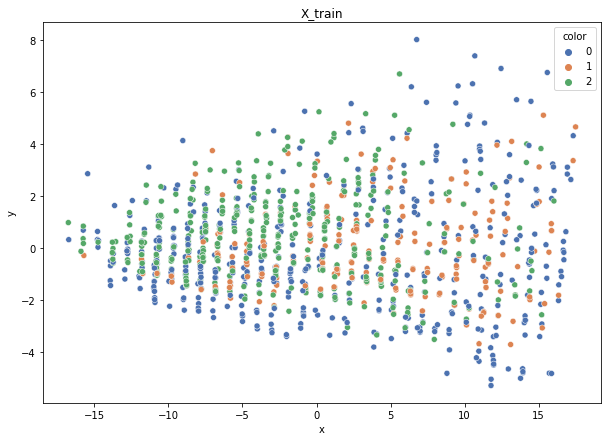

Class cardinalities: Counter({0: 503, 2: 408, 1: 267})
Weights: {0: 0.2429107547813522, 1: 0.45761838822104933, 2: 0.29947085699759846}


100%|██████████| 295/295 [00:00<00:00, 2646.59it/s]


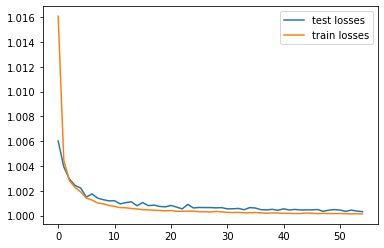

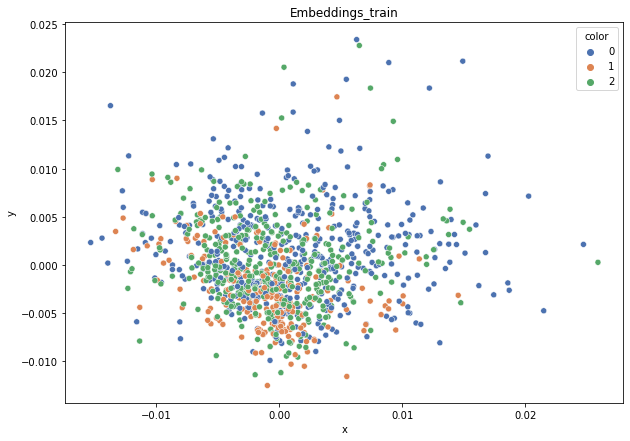

DT-f1-new-features: 0.397
DT-f1-old+new-features: 0.41
DT-f1-old-features: 0.462
DT-gmean-new-features: 0.392
DT-gmean-old+new-features: 0.404
DT-gmean-old-features: 0.46
KNN-f1-new-features: 0.421
KNN-f1-old+new-features: 0.404
KNN-f1-old-features: 0.413
KNN-gmean-new-features: 0.408
KNN-gmean-old+new-features: 0.392
KNN-gmean-old-features: 0.399
LDA-f1-new-features: 0.323
LDA-f1-old+new-features: 0.373
LDA-f1-old-features: 0.447
LDA-gmean-new-features: 0.309
LDA-gmean-old+new-features: 0.36
LDA-gmean-old-features: 0.425
QDA-f1-new-features: 0.456
QDA-f1-old+new-features: 0.515
QDA-f1-old-features: 0.486
QDA-gmean-new-features: 0.439
QDA-gmean-old+new-features: 0.51
QDA-gmean-old-features: 0.493
RF24-f1-new-features: 0.408
RF24-f1-old+new-features: 0.449
RF24-f1-old-features: 0.519
RF24-gmean-new-features: 0.384
RF24-gmean-old+new-features: 0.426
RF24-gmean-old-features: 0.513


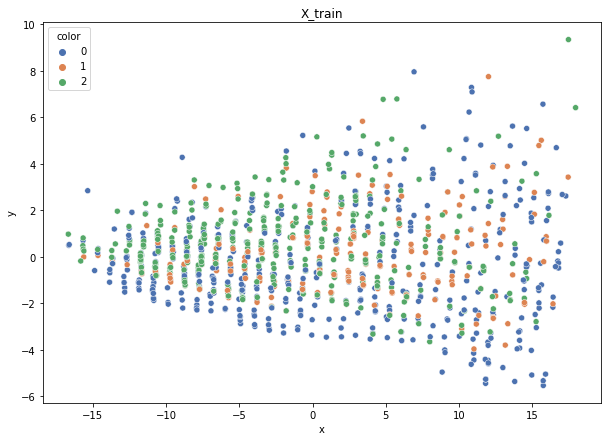

Class cardinalities: Counter({0: 503, 2: 409, 1: 267})
Weights: {0: 0.24308874498865835, 1: 0.4579537031059744, 2: 0.29895755190536716}


100%|██████████| 294/294 [00:00<00:00, 3277.22it/s]


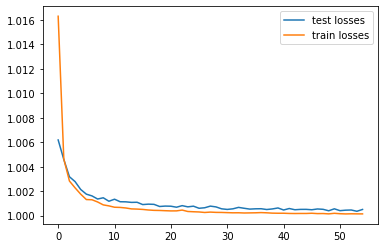

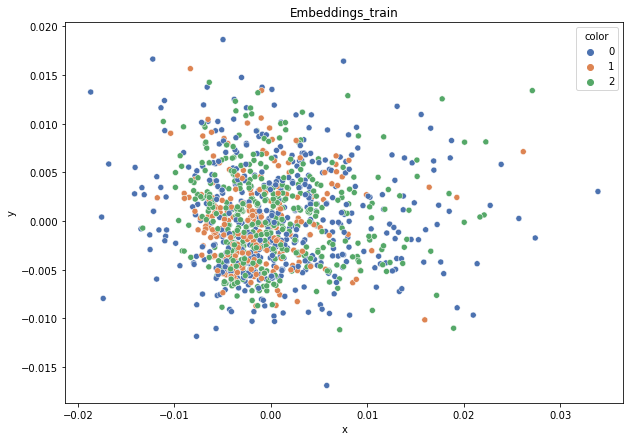

DT-f1-new-features: 0.4
DT-f1-old+new-features: 0.46
DT-f1-old-features: 0.44
DT-gmean-new-features: 0.4
DT-gmean-old+new-features: 0.454
DT-gmean-old-features: 0.438
KNN-f1-new-features: 0.394
KNN-f1-old+new-features: 0.413
KNN-f1-old-features: 0.418
KNN-gmean-new-features: 0.384
KNN-gmean-old+new-features: 0.409
KNN-gmean-old-features: 0.413
LDA-f1-new-features: 0.421
LDA-f1-old+new-features: 0.485
LDA-f1-old-features: 0.485
LDA-gmean-new-features: 0.399
LDA-gmean-old+new-features: 0.461
LDA-gmean-old-features: 0.451
QDA-f1-new-features: 0.486
QDA-f1-old+new-features: 0.467
QDA-f1-old-features: 0.516
QDA-gmean-new-features: 0.47
QDA-gmean-old+new-features: 0.457
QDA-gmean-old-features: 0.524
RF24-f1-new-features: 0.407
RF24-f1-old+new-features: 0.478
RF24-f1-old-features: 0.509
RF24-gmean-new-features: 0.381
RF24-gmean-old+new-features: 0.453
RF24-gmean-old-features: 0.497


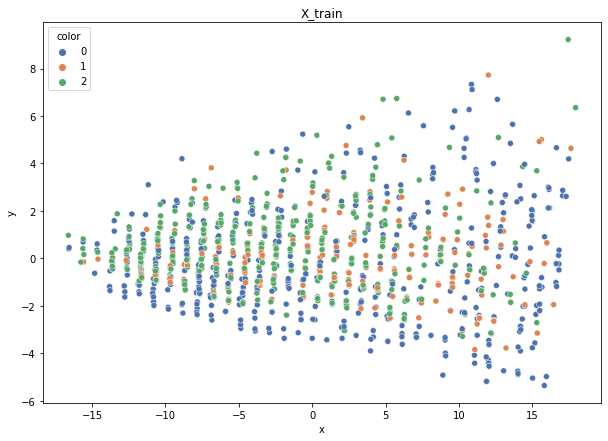

Class cardinalities: Counter({0: 504, 2: 409, 1: 266})
Weights: {0: 0.24230613326681422, 1: 0.4591063577687006, 2: 0.29858750896448505}


100%|██████████| 294/294 [00:00<00:00, 3429.94it/s]


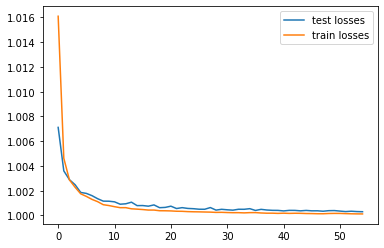

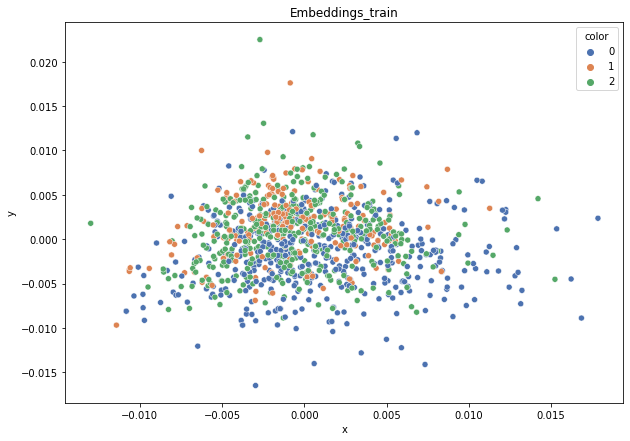

DT-f1-new-features: 0.339
DT-f1-old+new-features: 0.436
DT-f1-old-features: 0.473
DT-gmean-new-features: 0.333
DT-gmean-old+new-features: 0.435
DT-gmean-old-features: 0.483
KNN-f1-new-features: 0.37
KNN-f1-old+new-features: 0.408
KNN-f1-old-features: 0.408
KNN-gmean-new-features: 0.349
KNN-gmean-old+new-features: 0.396
KNN-gmean-old-features: 0.394
LDA-f1-new-features: 0.353
LDA-f1-old+new-features: 0.517
LDA-f1-old-features: 0.527
LDA-gmean-new-features: 0.302
LDA-gmean-old+new-features: 0.514
LDA-gmean-old-features: 0.509
QDA-f1-new-features: 0.379
QDA-f1-old+new-features: 0.444
QDA-f1-old-features: 0.542
QDA-gmean-new-features: 0.352
QDA-gmean-old+new-features: 0.438
QDA-gmean-old-features: 0.557
RF24-f1-new-features: 0.378
RF24-f1-old+new-features: 0.461
RF24-f1-old-features: 0.515
RF24-gmean-new-features: 0.336
RF24-gmean-old+new-features: 0.435
RF24-gmean-old-features: 0.518
dermatology


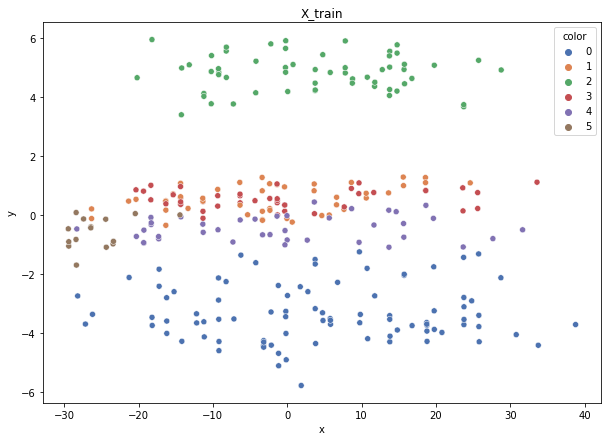

Class cardinalities: Counter({0: 90, 2: 58, 1: 48, 4: 41, 3: 39, 5: 16})
Weights: {1: 0.1288257963857323, 0: 0.0687070914057239, 2: 0.10661445218129569, 4: 0.15082044454915, 3: 0.1585548263209013, 5: 0.38647738915719687}


100%|██████████| 74/74 [00:00<00:00, 2979.54it/s]


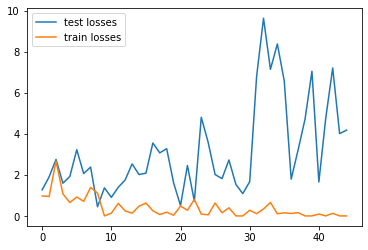

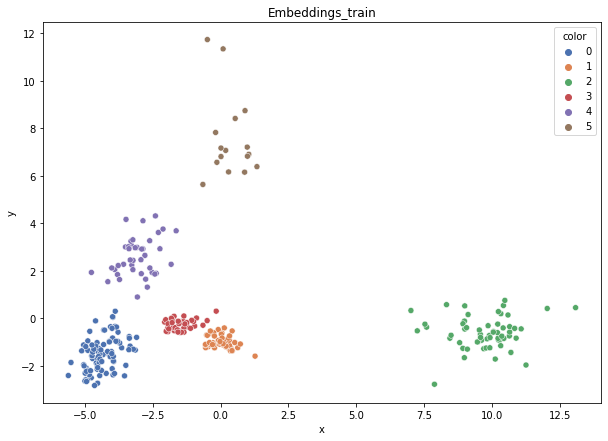

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


DT-f1-new-features: 0.876
DT-f1-old+new-features: 0.862
DT-f1-old-features: 0.914
DT-gmean-new-features: 0.864
DT-gmean-old+new-features: 0.864
DT-gmean-old-features: 0.911
KNN-f1-new-features: 0.933
KNN-f1-old+new-features: 0.944
KNN-f1-old-features: 0.944
KNN-gmean-new-features: 0.929
KNN-gmean-old+new-features: 0.941
KNN-gmean-old-features: 0.941
LDA-f1-new-features: 0.931
LDA-f1-old+new-features: 0.945
LDA-f1-old-features: 0.943
LDA-gmean-new-features: 0.926
LDA-gmean-old+new-features: 0.941
LDA-gmean-old-features: 0.942
QDA-f1-new-features: 0.78
QDA-f1-old+new-features: 0.874
QDA-f1-old-features: 0.749
QDA-gmean-new-features: 0.302
QDA-gmean-old+new-features: 0.9
QDA-gmean-old-features: 0.74
RF24-f1-new-features: 0.933
RF24-f1-old+new-features: 0.959
RF24-f1-old-features: 0.959
RF24-gmean-new-features: 0.929
RF24-gmean-old+new-features: 0.957
RF24-gmean-old-features: 0.957


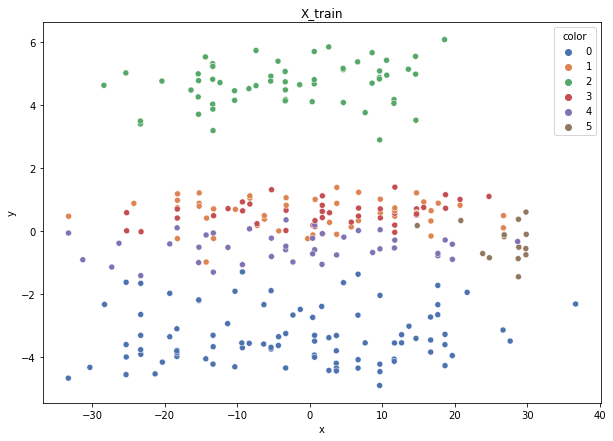

Class cardinalities: Counter({0: 89, 2: 58, 1: 49, 4: 41, 3: 40, 5: 16})
Weights: {1: 0.1269355878601628, 2: 0.10723868629565478, 0: 0.06988588545110087, 4: 0.1517035074426336, 3: 0.15549609512869944, 5: 0.3887402378217486}


100%|██████████| 73/73 [00:00<00:00, 3106.80it/s]


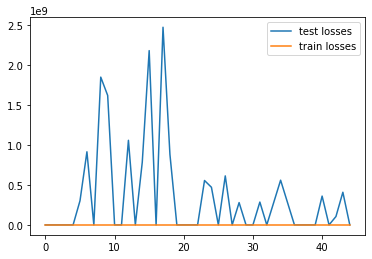

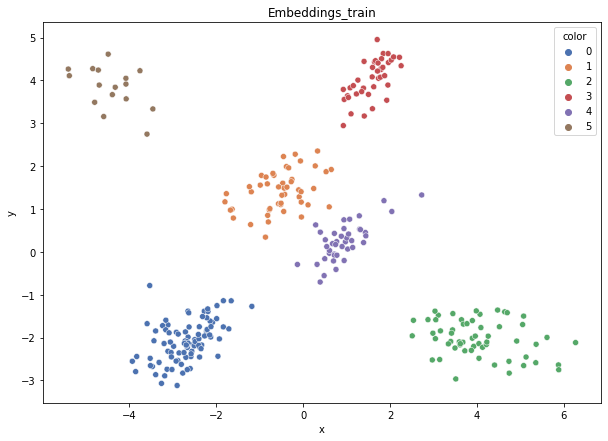

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


DT-f1-new-features: 0.941
DT-f1-old+new-features: 0.908
DT-f1-old-features: 0.955
DT-gmean-new-features: 0.934
DT-gmean-old+new-features: 0.883
DT-gmean-old-features: 0.955
KNN-f1-new-features: 0.941
KNN-f1-old+new-features: 0.958
KNN-f1-old-features: 0.952
KNN-gmean-new-features: 0.934
KNN-gmean-old+new-features: 0.955
KNN-gmean-old-features: 0.951
LDA-f1-new-features: 0.953
LDA-f1-old+new-features: 0.94
LDA-f1-old-features: 0.968
LDA-gmean-new-features: 0.945
LDA-gmean-old+new-features: 0.934
LDA-gmean-old-features: 0.97
QDA-f1-new-features: 0.765
QDA-f1-old+new-features: 0.904
QDA-f1-old-features: 0.786
QDA-gmean-new-features: 0.295
QDA-gmean-old+new-features: 0.907
QDA-gmean-old-features: 0.766
RF24-f1-new-features: 0.937
RF24-f1-old+new-features: 0.968
RF24-f1-old-features: 0.984
RF24-gmean-new-features: 0.934
RF24-gmean-old+new-features: 0.966
RF24-gmean-old-features: 0.986


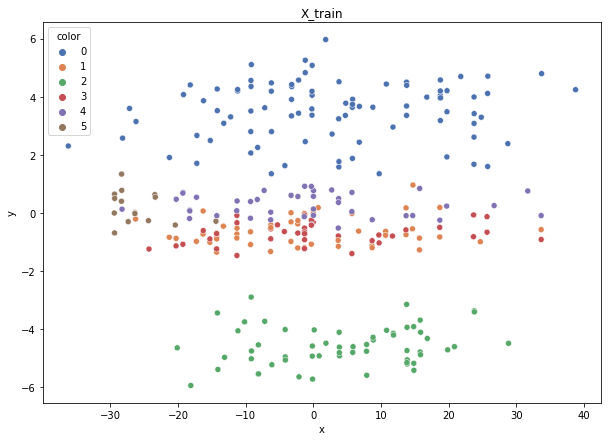

Class cardinalities: Counter({0: 89, 2: 58, 1: 49, 4: 42, 3: 39, 5: 16})
Weights: {0: 0.06985968170695418, 2: 0.10719847710205038, 4: 0.14803599218854577, 3: 0.15942337620304928, 1: 0.1268879933044678, 5: 0.38859447949493264}


100%|██████████| 73/73 [00:00<00:00, 2935.27it/s]


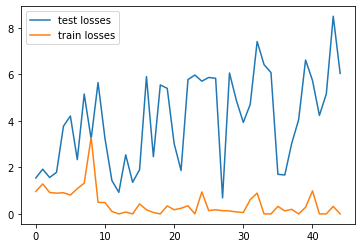

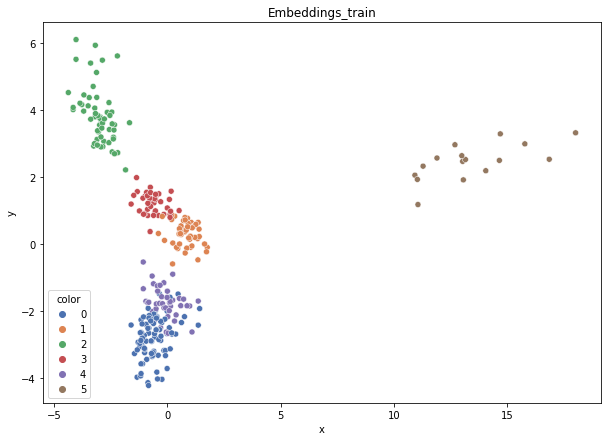

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


DT-f1-new-features: 0.917
DT-f1-old+new-features: 0.904
DT-f1-old-features: 0.945
DT-gmean-new-features: 0.898
DT-gmean-old+new-features: 0.907
DT-gmean-old-features: 0.953
KNN-f1-new-features: 0.929
KNN-f1-old+new-features: 0.911
KNN-f1-old-features: 0.906
KNN-gmean-new-features: 0.935
KNN-gmean-old+new-features: 0.914
KNN-gmean-old-features: 0.891
LDA-f1-new-features: 0.958
LDA-f1-old+new-features: 0.932
LDA-f1-old-features: 0.922
LDA-gmean-new-features: 0.95
LDA-gmean-old+new-features: 0.935
LDA-gmean-old-features: 0.913
QDA-f1-new-features: 0.776
QDA-f1-old+new-features: 0.907
QDA-f1-old-features: 0.865
QDA-gmean-new-features: 0.3
QDA-gmean-old+new-features: 0.891
QDA-gmean-old-features: 0.861
RF24-f1-new-features: 0.932
RF24-f1-old+new-features: 0.932
RF24-f1-old-features: 0.909
RF24-gmean-new-features: 0.935
RF24-gmean-old+new-features: 0.935
RF24-gmean-old-features: 0.905


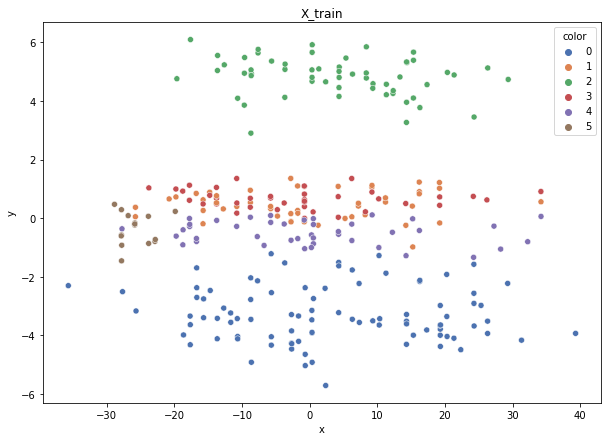

Class cardinalities: Counter({0: 90, 2: 57, 1: 49, 4: 42, 3: 39, 5: 16})
Weights: {1: 0.12674800566460384, 0: 0.06900724752850654, 2: 0.10895881188711559, 4: 0.14787267327537115, 3: 0.15924749429655355, 5: 0.3881657673478493}


100%|██████████| 73/73 [00:00<00:00, 3097.68it/s]


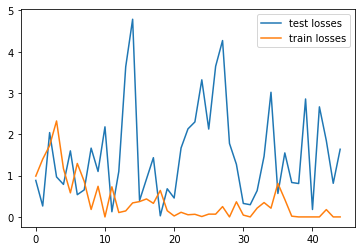

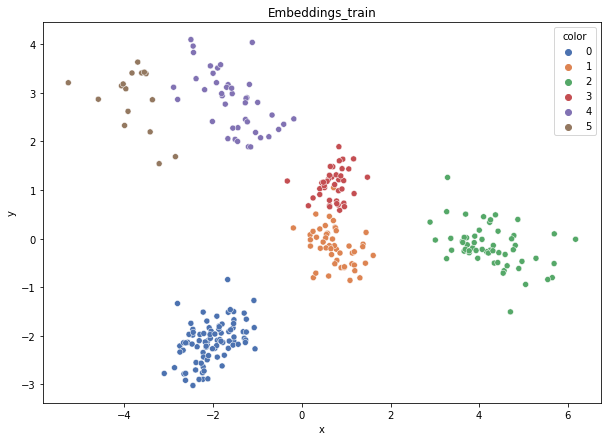

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


DT-f1-new-features: 0.93
DT-f1-old+new-features: 1.0
DT-f1-old-features: 0.946
DT-gmean-new-features: 0.929
DT-gmean-old+new-features: 1.0
DT-gmean-old-features: 0.945
KNN-f1-new-features: 0.969
KNN-f1-old+new-features: 0.969
KNN-f1-old-features: 0.939
KNN-gmean-new-features: 0.963
KNN-gmean-old+new-features: 0.968
KNN-gmean-old-features: 0.937
LDA-f1-new-features: 0.985
LDA-f1-old+new-features: 0.969
LDA-f1-old-features: 0.969
LDA-gmean-new-features: 0.983
LDA-gmean-old+new-features: 0.963
LDA-gmean-old-features: 0.968
QDA-f1-new-features: 0.76
QDA-f1-old+new-features: 0.79
QDA-f1-old-features: 0.652
QDA-gmean-new-features: 0.298
QDA-gmean-old+new-features: 0.721
QDA-gmean-old-features: 0.553
RF24-f1-new-features: 0.969
RF24-f1-old+new-features: 0.969
RF24-f1-old-features: 0.969
RF24-gmean-new-features: 0.968
RF24-gmean-old+new-features: 0.963
RF24-gmean-old-features: 0.963


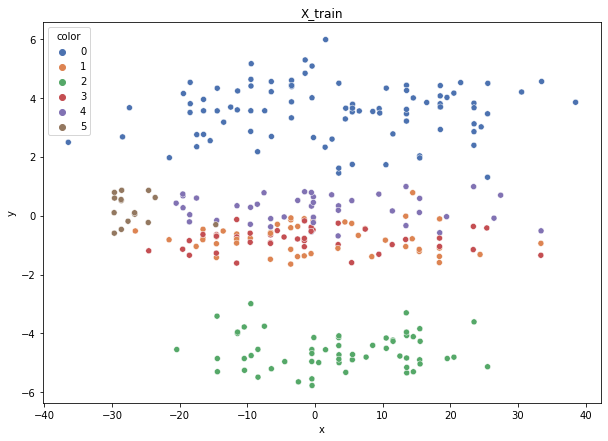

Class cardinalities: Counter({0: 90, 2: 57, 1: 49, 4: 42, 3: 39, 5: 16})
Weights: {1: 0.12674800566460384, 0: 0.06900724752850654, 2: 0.10895881188711559, 3: 0.15924749429655355, 4: 0.14787267327537115, 5: 0.3881657673478493}


100%|██████████| 73/73 [00:00<00:00, 3187.19it/s]


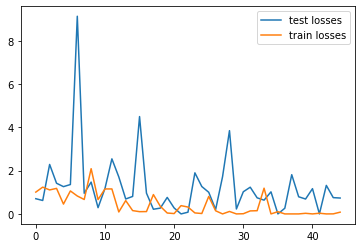

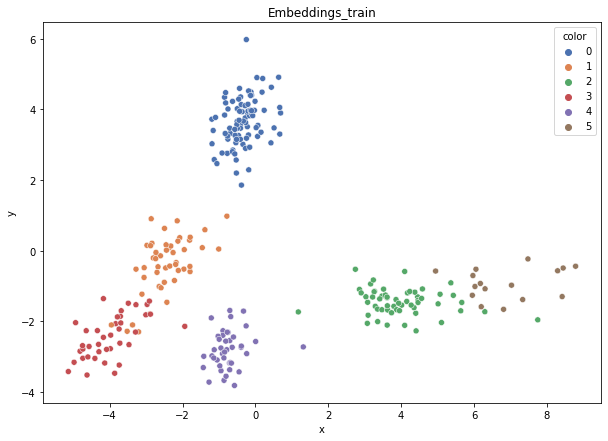

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


DT-f1-new-features: 1.0
DT-f1-old+new-features: 0.989
DT-f1-old-features: 0.989
DT-gmean-new-features: 1.0
DT-gmean-old+new-features: 0.992
DT-gmean-old-features: 0.992
KNN-f1-new-features: 1.0
KNN-f1-old+new-features: 1.0
KNN-f1-old-features: 0.944
KNN-gmean-new-features: 1.0
KNN-gmean-old+new-features: 1.0
KNN-gmean-old-features: 0.942
LDA-f1-new-features: 1.0
LDA-f1-old+new-features: 1.0
LDA-f1-old-features: 0.989
LDA-gmean-new-features: 1.0
LDA-gmean-old+new-features: 1.0
LDA-gmean-old-features: 0.992
QDA-f1-new-features: 0.81
QDA-f1-old+new-features: 0.946
QDA-f1-old-features: 0.835
QDA-gmean-new-features: 0.316
QDA-gmean-old+new-features: 0.942
QDA-gmean-old-features: 0.814
RF24-f1-new-features: 1.0
RF24-f1-old+new-features: 1.0
RF24-f1-old-features: 1.0
RF24-gmean-new-features: 1.0
RF24-gmean-old+new-features: 1.0
RF24-gmean-old-features: 1.0
hayes-roth


/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


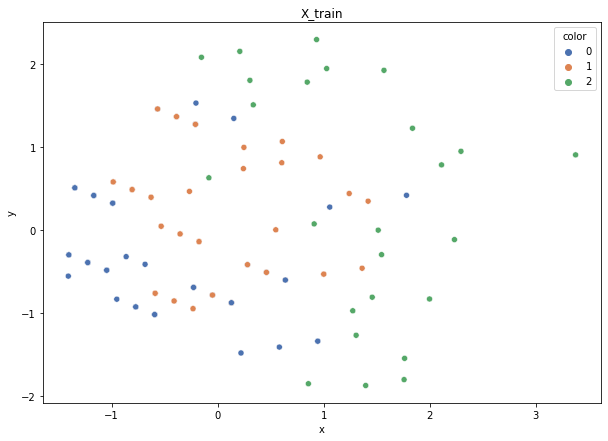

Class cardinalities: Counter({0: 52, 1: 51, 2: 25})
Weights: {0: 0.243925770040176, 1: 0.24870862827625786, 2: 0.507365601683566}


100%|██████████| 32/32 [00:00<00:00, 2808.49it/s]


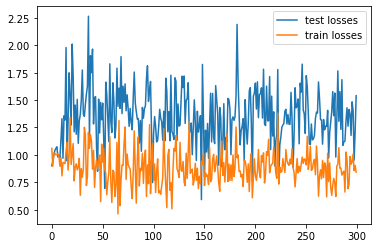

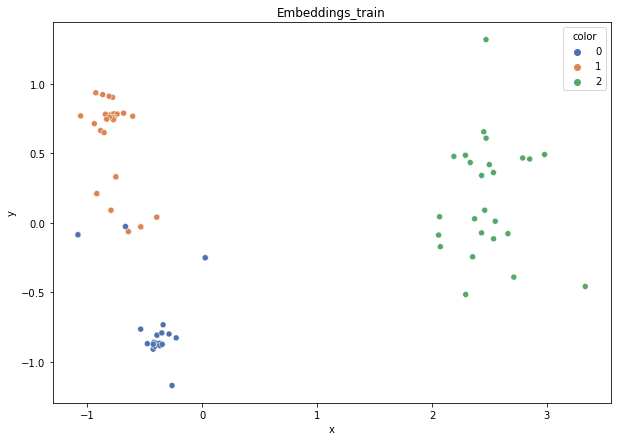

DT-f1-new-features: 0.838
DT-f1-old+new-features: 0.838
DT-f1-old-features: 0.842
DT-gmean-new-features: 0.814
DT-gmean-old+new-features: 0.814
DT-gmean-old-features: 0.828
KNN-f1-new-features: 0.846
KNN-f1-old+new-features: 0.897
KNN-f1-old-features: 0.733
KNN-gmean-new-features: 0.84
KNN-gmean-old+new-features: 0.895
KNN-gmean-old-features: 0.688
LDA-f1-new-features: 0.867
LDA-f1-old+new-features: 0.867
LDA-f1-old-features: 0.57
LDA-gmean-new-features: 0.851
LDA-gmean-old+new-features: 0.851
LDA-gmean-old-features: 0.549
QDA-f1-new-features: 0.897
QDA-f1-old+new-features: 0.87
QDA-f1-old-features: 0.58
QDA-gmean-new-features: 0.892
QDA-gmean-old+new-features: 0.861
QDA-gmean-old-features: 0.574
RF24-f1-new-features: 0.846
RF24-f1-old+new-features: 0.872
RF24-f1-old-features: 0.838
RF24-gmean-new-features: 0.84
RF24-gmean-old+new-features: 0.867
RF24-gmean-old-features: 0.814


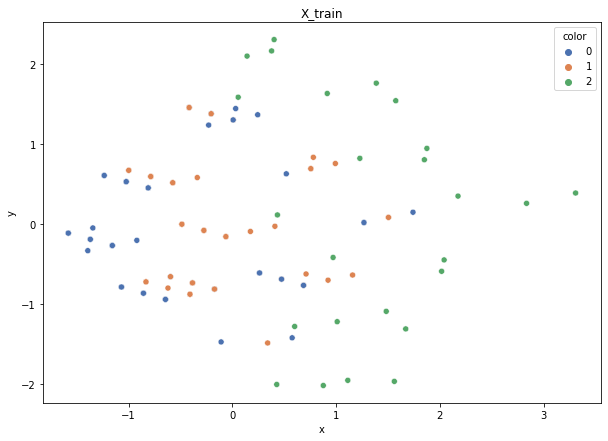

Class cardinalities: Counter({0: 52, 1: 51, 2: 25})
Weights: {0: 0.243925770040176, 1: 0.24870862827625786, 2: 0.507365601683566}


100%|██████████| 32/32 [00:00<00:00, 3173.37it/s]


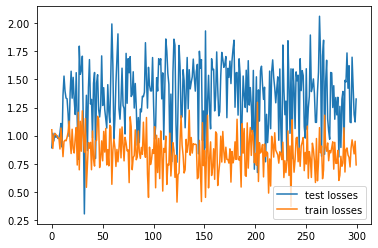

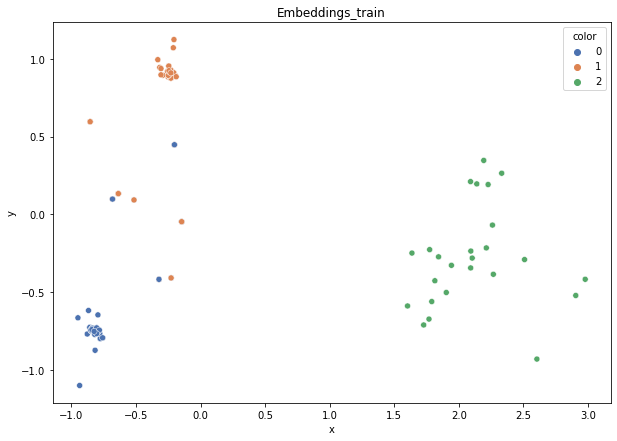

DT-f1-new-features: 0.897
DT-f1-old+new-features: 0.897
DT-f1-old-features: 0.872
DT-gmean-new-features: 0.895
DT-gmean-old+new-features: 0.895
DT-gmean-old-features: 0.867
KNN-f1-new-features: 0.87
KNN-f1-old+new-features: 0.82
KNN-f1-old-features: 0.643
KNN-gmean-new-features: 0.861
KNN-gmean-old+new-features: 0.811
KNN-gmean-old-features: 0.619
LDA-f1-new-features: 0.897
LDA-f1-old+new-features: 0.897
LDA-f1-old-features: 0.439
LDA-gmean-new-features: 0.895
LDA-gmean-old+new-features: 0.895
LDA-gmean-old-features: 0.414
QDA-f1-new-features: 0.872
QDA-f1-old+new-features: 0.897
QDA-f1-old-features: 0.54
QDA-gmean-new-features: 0.867
QDA-gmean-old+new-features: 0.895
QDA-gmean-old-features: 0.529
RF24-f1-new-features: 0.897
RF24-f1-old+new-features: 0.897
RF24-f1-old-features: 0.846
RF24-gmean-new-features: 0.895
RF24-gmean-old+new-features: 0.895
RF24-gmean-old-features: 0.84


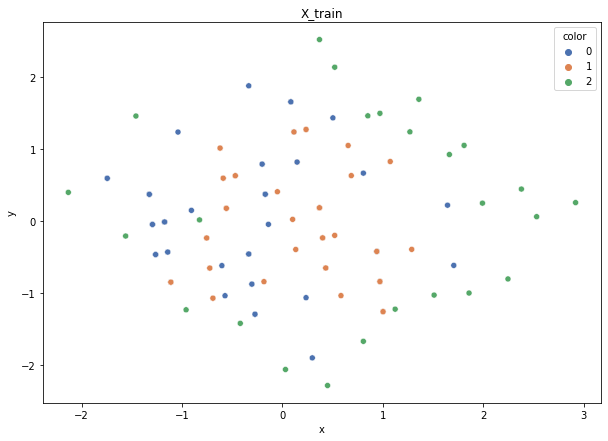

Class cardinalities: Counter({0: 52, 1: 51, 2: 25})
Weights: {0: 0.243925770040176, 1: 0.24870862827625786, 2: 0.507365601683566}


100%|██████████| 32/32 [00:00<00:00, 2911.76it/s]


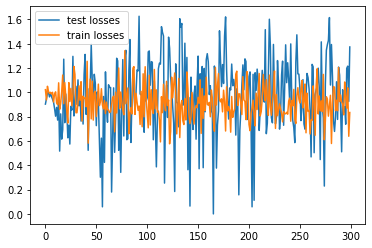

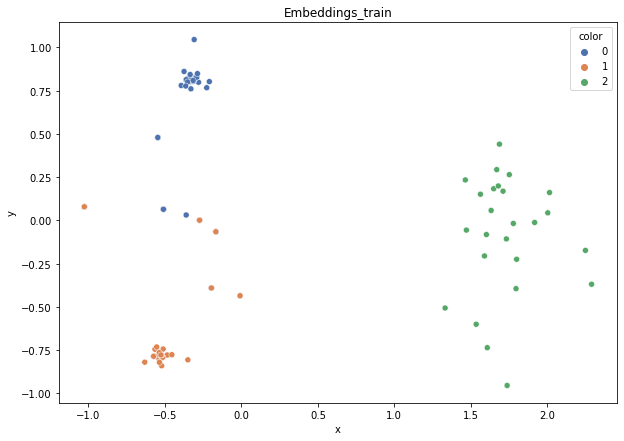

DT-f1-new-features: 0.923
DT-f1-old+new-features: 0.923
DT-f1-old-features: 0.923
DT-gmean-new-features: 0.921
DT-gmean-old+new-features: 0.921
DT-gmean-old-features: 0.921
KNN-f1-new-features: 0.923
KNN-f1-old+new-features: 0.923
KNN-f1-old-features: 0.836
KNN-gmean-new-features: 0.921
KNN-gmean-old+new-features: 0.921
KNN-gmean-old-features: 0.805
LDA-f1-new-features: 0.948
LDA-f1-old+new-features: 0.948
LDA-f1-old-features: 0.565
LDA-gmean-new-features: 0.946
LDA-gmean-old+new-features: 0.946
LDA-gmean-old-features: 0.474
QDA-f1-new-features: 0.923
QDA-f1-old+new-features: 0.923
QDA-f1-old-features: 0.666
QDA-gmean-new-features: 0.921
QDA-gmean-old+new-features: 0.921
QDA-gmean-old-features: 0.643
RF24-f1-new-features: 0.948
RF24-f1-old+new-features: 0.948
RF24-f1-old-features: 0.923
RF24-gmean-new-features: 0.946
RF24-gmean-old+new-features: 0.946
RF24-gmean-old-features: 0.921


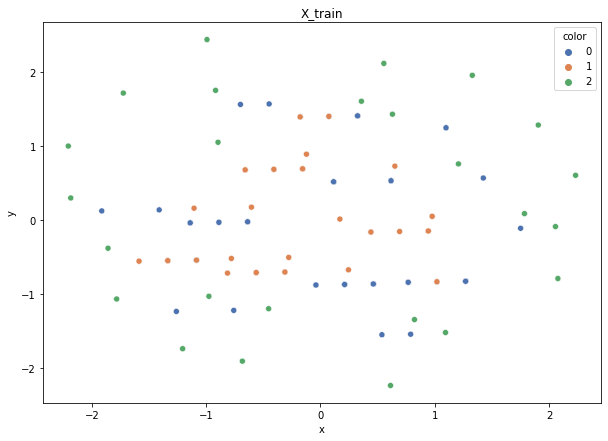

Class cardinalities: Counter({0: 52, 1: 51, 2: 25})
Weights: {1: 0.24870862827625786, 2: 0.507365601683566, 0: 0.243925770040176}


100%|██████████| 32/32 [00:00<00:00, 2849.03it/s]


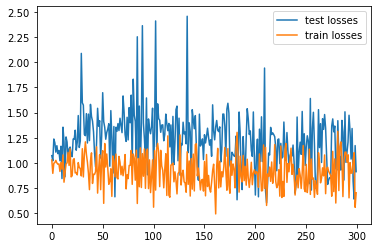

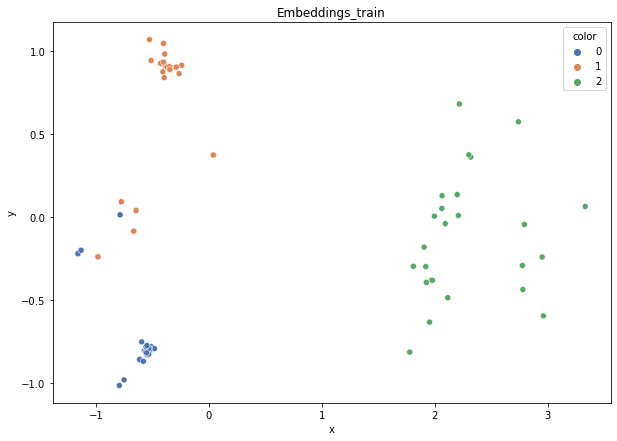

DT-f1-new-features: 0.872
DT-f1-old+new-features: 0.872
DT-f1-old-features: 0.897
DT-gmean-new-features: 0.867
DT-gmean-old+new-features: 0.867
DT-gmean-old-features: 0.892
KNN-f1-new-features: 0.897
KNN-f1-old+new-features: 0.897
KNN-f1-old-features: 0.594
KNN-gmean-new-features: 0.895
KNN-gmean-old+new-features: 0.895
KNN-gmean-old-features: 0.54
LDA-f1-new-features: 0.923
LDA-f1-old+new-features: 0.923
LDA-f1-old-features: 0.615
LDA-gmean-new-features: 0.921
LDA-gmean-old+new-features: 0.921
LDA-gmean-old-features: 0.605
QDA-f1-new-features: 0.846
QDA-f1-old+new-features: 0.897
QDA-f1-old-features: 0.739
QDA-gmean-new-features: 0.867
QDA-gmean-old+new-features: 0.892
QDA-gmean-old-features: 0.752
RF24-f1-new-features: 0.897
RF24-f1-old+new-features: 0.897
RF24-f1-old-features: 0.923
RF24-gmean-new-features: 0.895
RF24-gmean-old+new-features: 0.895
RF24-gmean-old-features: 0.921


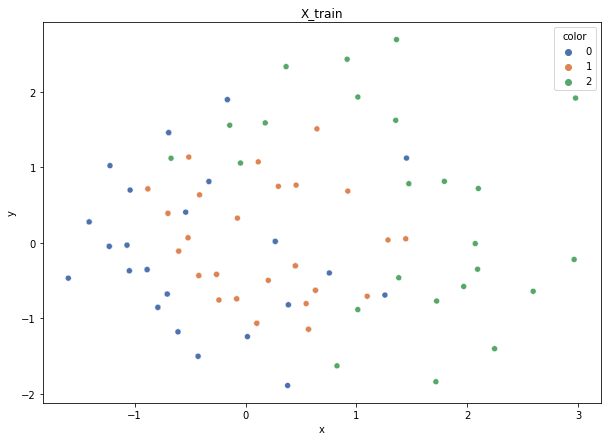

Class cardinalities: Counter({0: 52, 1: 52, 2: 24})
Weights: {0: 0.24000000000000005, 2: 0.52, 1: 0.24000000000000005}


100%|██████████| 32/32 [00:00<00:00, 2975.28it/s]


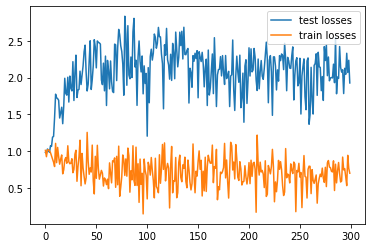

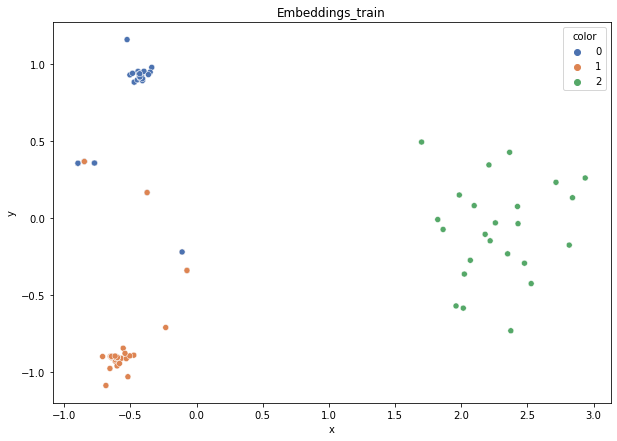

DT-f1-new-features: 0.812
DT-f1-old+new-features: 0.777
DT-f1-old-features: 0.722
DT-gmean-new-features: 0.8
DT-gmean-old+new-features: 0.76
DT-gmean-old-features: 0.684
KNN-f1-new-features: 0.812
KNN-f1-old+new-features: 0.812
KNN-f1-old-features: 0.555
KNN-gmean-new-features: 0.8
KNN-gmean-old+new-features: 0.8
KNN-gmean-old-features: 0.529
LDA-f1-new-features: 0.786
LDA-f1-old+new-features: 0.76
LDA-f1-old-features: 0.607
LDA-gmean-new-features: 0.773
LDA-gmean-old+new-features: 0.743
LDA-gmean-old-features: 0.591
QDA-f1-new-features: 0.786
QDA-f1-old+new-features: 0.724
QDA-f1-old-features: 0.663
QDA-gmean-new-features: 0.773
QDA-gmean-old+new-features: 0.702
QDA-gmean-old-features: 0.667
RF24-f1-new-features: 0.76
RF24-f1-old+new-features: 0.786
RF24-f1-old-features: 0.733
RF24-gmean-new-features: 0.743
RF24-gmean-old+new-features: 0.773
RF24-gmean-old-features: 0.711
new_vehicle


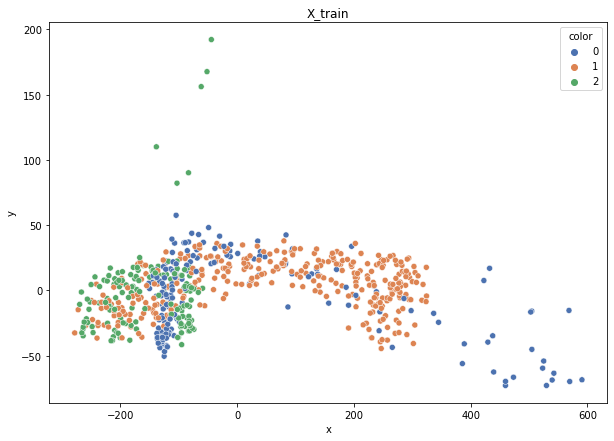

Class cardinalities: Counter({1: 343, 0: 174, 2: 159})
Weights: {2: 0.42063643091235864, 1: 0.19498889946083095, 0: 0.38437466962681044}


100%|██████████| 170/170 [00:00<00:00, 3053.05it/s]


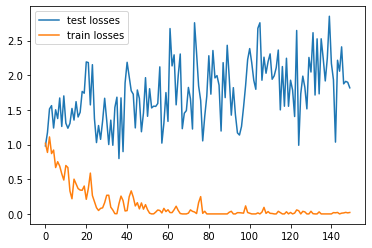

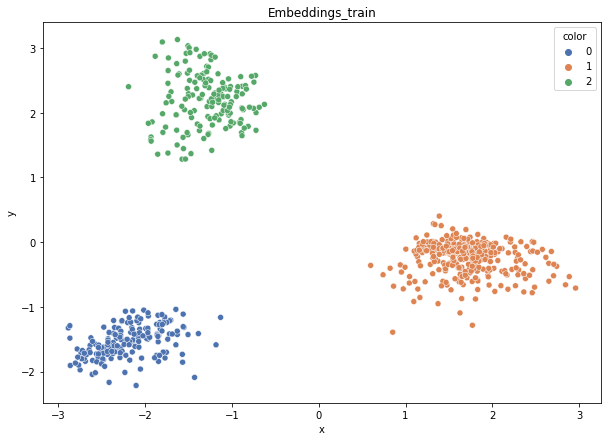

DT-f1-new-features: 0.94
DT-f1-old+new-features: 0.938
DT-f1-old-features: 0.901
DT-gmean-new-features: 0.929
DT-gmean-old+new-features: 0.929
DT-gmean-old-features: 0.908
KNN-f1-new-features: 0.952
KNN-f1-old+new-features: 0.952
KNN-f1-old-features: 0.889
KNN-gmean-new-features: 0.953
KNN-gmean-old+new-features: 0.953
KNN-gmean-old-features: 0.895
LDA-f1-new-features: 0.952
LDA-f1-old+new-features: 0.958
LDA-f1-old-features: 0.907
LDA-gmean-new-features: 0.953
LDA-gmean-old+new-features: 0.956
LDA-gmean-old-features: 0.921
QDA-f1-new-features: 0.966
QDA-f1-old+new-features: 0.966
QDA-f1-old-features: 0.932
QDA-gmean-new-features: 0.964
QDA-gmean-old+new-features: 0.964
QDA-gmean-old-features: 0.944
RF24-f1-new-features: 0.944
RF24-f1-old+new-features: 0.944
RF24-f1-old-features: 0.922
RF24-gmean-new-features: 0.944
RF24-gmean-old+new-features: 0.944
RF24-gmean-old-features: 0.932


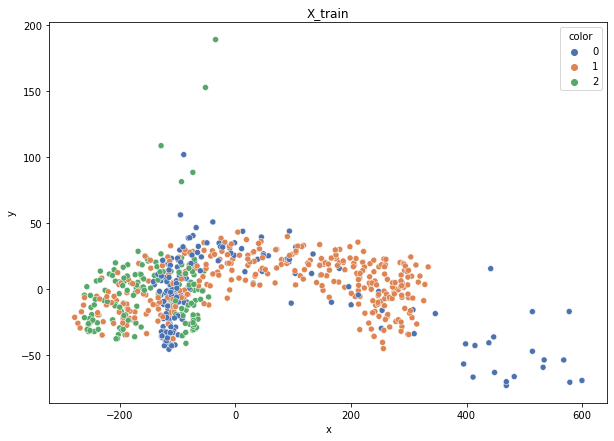

Class cardinalities: Counter({1: 343, 0: 175, 2: 159})
Weights: {2: 0.4215623617324616, 1: 0.19541812103633058, 0: 0.3830195172312079}


100%|██████████| 169/169 [00:00<00:00, 3179.97it/s]


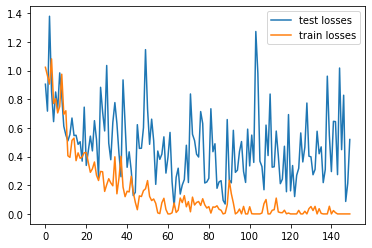

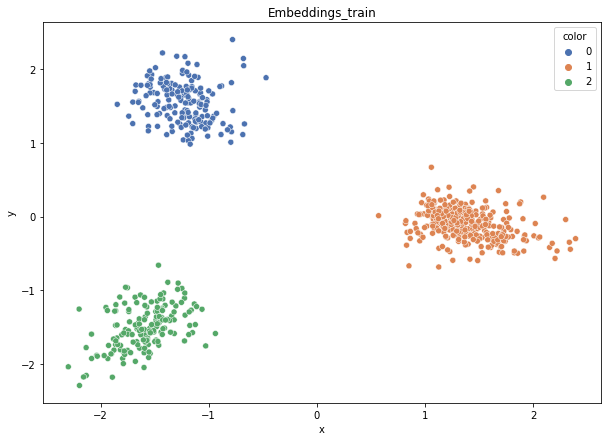

DT-f1-new-features: 0.994
DT-f1-old+new-features: 0.975
DT-f1-old-features: 0.906
DT-gmean-new-features: 0.992
DT-gmean-old+new-features: 0.976
DT-gmean-old-features: 0.904
KNN-f1-new-features: 1.0
KNN-f1-old+new-features: 1.0
KNN-f1-old-features: 0.9
KNN-gmean-new-features: 1.0
KNN-gmean-old+new-features: 1.0
KNN-gmean-old-features: 0.908
LDA-f1-new-features: 0.992
LDA-f1-old+new-features: 1.0
LDA-f1-old-features: 0.933
LDA-gmean-new-features: 0.992
LDA-gmean-old+new-features: 1.0
LDA-gmean-old-features: 0.94
QDA-f1-new-features: 0.994
QDA-f1-old+new-features: 1.0
QDA-f1-old-features: 0.988
QDA-gmean-new-features: 0.996
QDA-gmean-old+new-features: 1.0
QDA-gmean-old-features: 0.992
RF24-f1-new-features: 1.0
RF24-f1-old+new-features: 1.0
RF24-f1-old-features: 0.958
RF24-gmean-new-features: 1.0
RF24-gmean-old+new-features: 1.0
RF24-gmean-old-features: 0.968


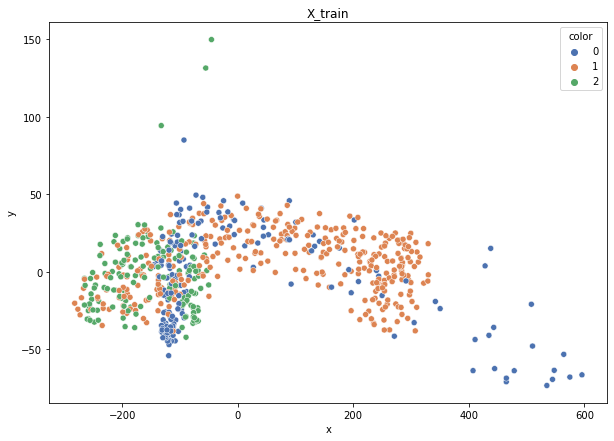

Class cardinalities: Counter({1: 343, 0: 175, 2: 159})
Weights: {2: 0.4215623617324616, 1: 0.19541812103633058, 0: 0.3830195172312079}


100%|██████████| 169/169 [00:00<00:00, 3141.73it/s]


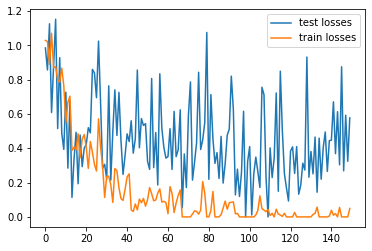

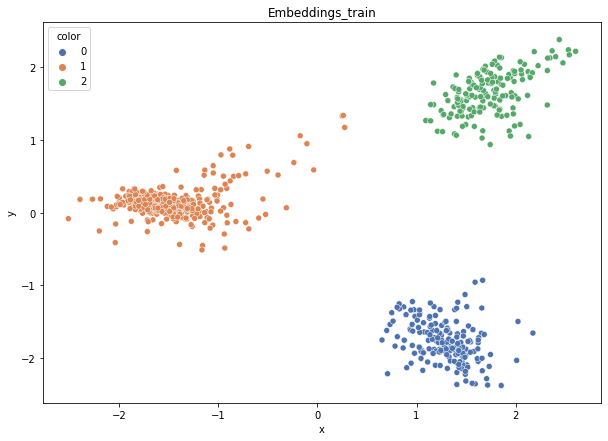

DT-f1-new-features: 0.978
DT-f1-old+new-features: 0.964
DT-f1-old-features: 0.89
DT-gmean-new-features: 0.974
DT-gmean-old+new-features: 0.959
DT-gmean-old-features: 0.895
KNN-f1-new-features: 1.0
KNN-f1-old+new-features: 0.994
KNN-f1-old-features: 0.899
KNN-gmean-new-features: 1.0
KNN-gmean-old+new-features: 0.996
KNN-gmean-old-features: 0.897
LDA-f1-new-features: 0.994
LDA-f1-old+new-features: 1.0
LDA-f1-old-features: 0.965
LDA-gmean-new-features: 0.996
LDA-gmean-old+new-features: 1.0
LDA-gmean-old-features: 0.964
QDA-f1-new-features: 1.0
QDA-f1-old+new-features: 1.0
QDA-f1-old-features: 0.976
QDA-gmean-new-features: 1.0
QDA-gmean-old+new-features: 1.0
QDA-gmean-old-features: 0.975
RF24-f1-new-features: 1.0
RF24-f1-old+new-features: 1.0
RF24-f1-old-features: 0.952
RF24-gmean-new-features: 1.0
RF24-gmean-old+new-features: 1.0
RF24-gmean-old-features: 0.955


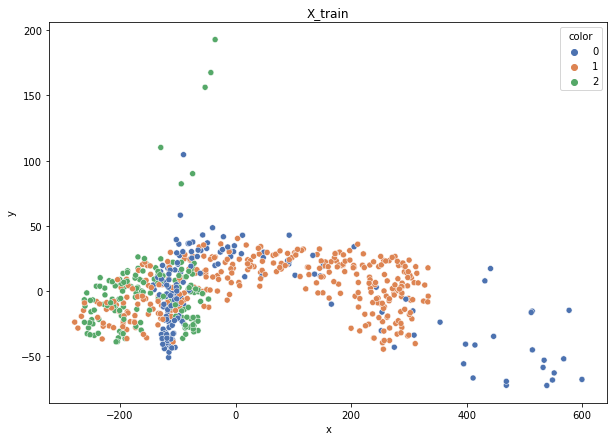

Class cardinalities: Counter({1: 344, 0: 174, 2: 159})
Weights: {2: 0.42087499472640594, 0: 0.3845926675948192, 1: 0.19453233767877484}


100%|██████████| 169/169 [00:00<00:00, 3076.18it/s]


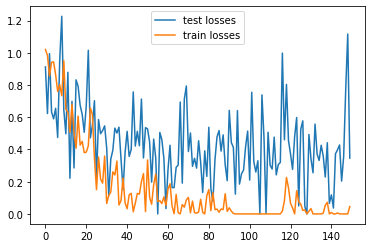

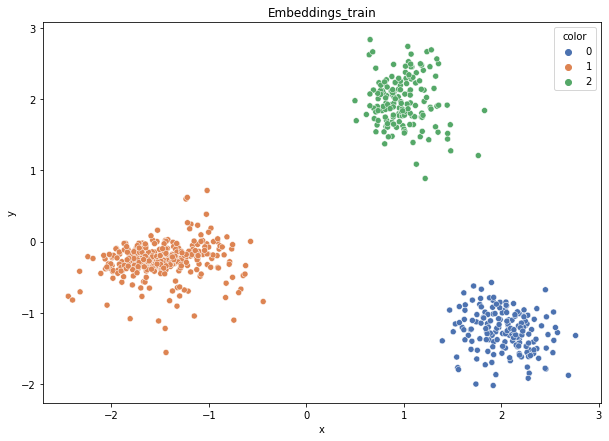

DT-f1-new-features: 0.978
DT-f1-old+new-features: 0.973
DT-f1-old-features: 0.909
DT-gmean-new-features: 0.979
DT-gmean-old+new-features: 0.975
DT-gmean-old-features: 0.916
KNN-f1-new-features: 0.994
KNN-f1-old+new-features: 0.988
KNN-f1-old-features: 0.937
KNN-gmean-new-features: 0.996
KNN-gmean-old+new-features: 0.992
KNN-gmean-old-features: 0.927
LDA-f1-new-features: 0.994
LDA-f1-old+new-features: 0.994
LDA-f1-old-features: 0.953
LDA-gmean-new-features: 0.996
LDA-gmean-old+new-features: 0.996
LDA-gmean-old-features: 0.957
QDA-f1-new-features: 0.994
QDA-f1-old+new-features: 0.994
QDA-f1-old-features: 0.988
QDA-gmean-new-features: 0.996
QDA-gmean-old+new-features: 0.996
QDA-gmean-old-features: 0.988
RF24-f1-new-features: 0.988
RF24-f1-old+new-features: 0.981
RF24-f1-old-features: 0.976
RF24-gmean-new-features: 0.988
RF24-gmean-old+new-features: 0.979
RF24-gmean-old-features: 0.977


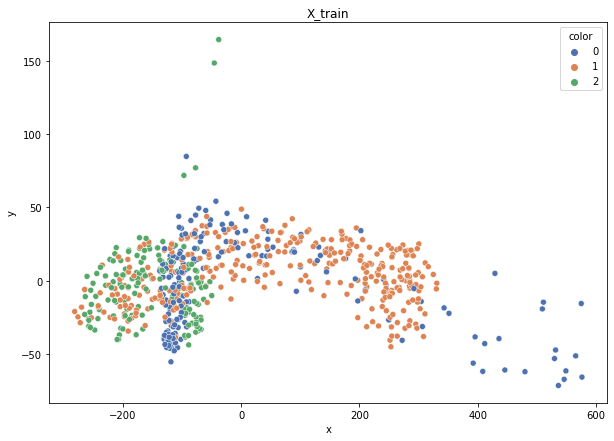

Class cardinalities: Counter({1: 343, 0: 174, 2: 160})
Weights: {2: 0.4191092821730032, 1: 0.19550287215067205, 0: 0.3853878456763248}


100%|██████████| 169/169 [00:00<00:00, 3060.94it/s]


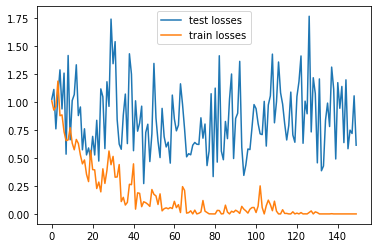

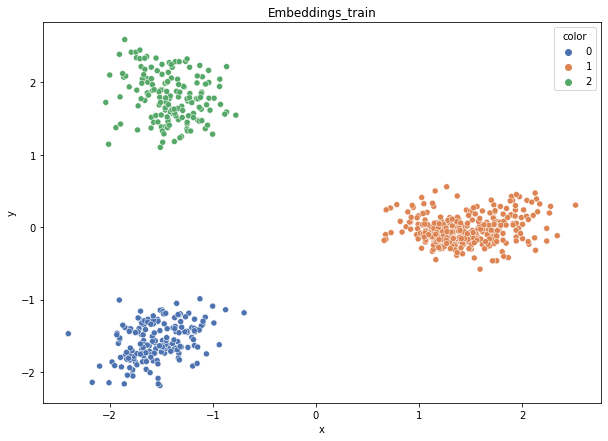

DT-f1-new-features: 0.98
DT-f1-old+new-features: 0.965
DT-f1-old-features: 0.877
DT-gmean-new-features: 0.976
DT-gmean-old+new-features: 0.957
DT-gmean-old-features: 0.87
KNN-f1-new-features: 0.994
KNN-f1-old+new-features: 0.994
KNN-f1-old-features: 0.937
KNN-gmean-new-features: 0.991
KNN-gmean-old+new-features: 0.991
KNN-gmean-old-features: 0.935
LDA-f1-new-features: 0.992
LDA-f1-old+new-features: 0.986
LDA-f1-old-features: 0.939
LDA-gmean-new-features: 0.992
LDA-gmean-old+new-features: 0.984
LDA-gmean-old-features: 0.941
QDA-f1-new-features: 0.98
QDA-f1-old+new-features: 0.992
QDA-f1-old-features: 0.964
QDA-gmean-new-features: 0.977
QDA-gmean-old+new-features: 0.992
QDA-gmean-old-features: 0.969
RF24-f1-new-features: 0.994
RF24-f1-old+new-features: 0.982
RF24-f1-old-features: 0.978
RF24-gmean-new-features: 0.991
RF24-gmean-old+new-features: 0.975
RF24-gmean-old-features: 0.981
new_yeast


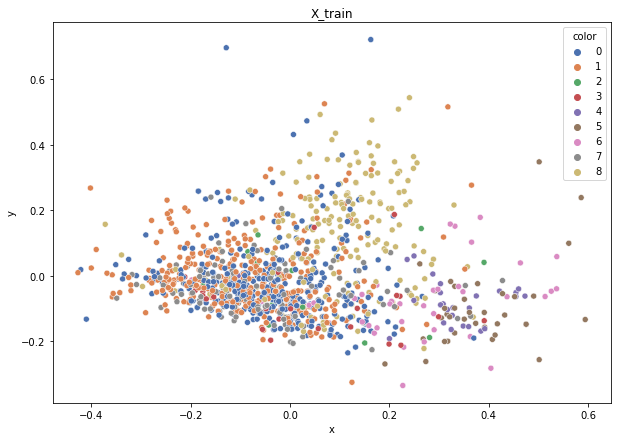

Class cardinalities: Counter({0: 370, 1: 343, 8: 195, 7: 135, 6: 40, 5: 36, 4: 28, 3: 24, 2: 16})
Weights: {8: 0.024325906642526016, 0: 0.012820410257547495, 1: 0.013829597070823827, 5: 0.1317653276470159, 4: 0.16941256411759187, 6: 0.11858879488231433, 3: 0.19764799147052386, 7: 0.03513742070587091, 2: 0.2964719872057858}


100%|██████████| 297/297 [00:00<00:00, 3322.00it/s]


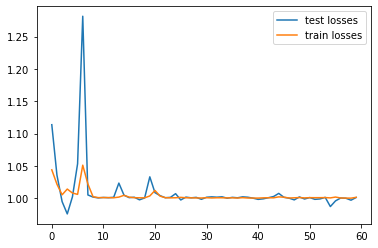

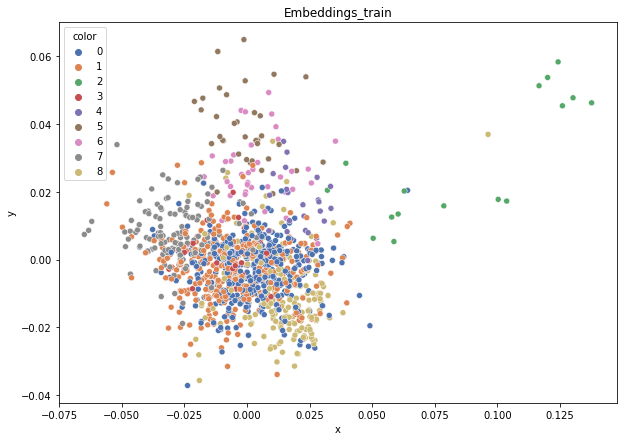

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


DT-f1-new-features: 0.404
DT-f1-old+new-features: 0.475
DT-f1-old-features: 0.494
DT-gmean-new-features: 0.355
DT-gmean-old+new-features: 0.437
DT-gmean-old-features: 0.271
KNN-f1-new-features: 0.552
KNN-f1-old+new-features: 0.545
KNN-f1-old-features: 0.545
KNN-gmean-new-features: 0.492
KNN-gmean-old+new-features: 0.51
KNN-gmean-old-features: 0.51
LDA-f1-new-features: 0.52
LDA-f1-old+new-features: 0.579
LDA-f1-old-features: 0.564
LDA-gmean-new-features: 0.29
LDA-gmean-old+new-features: 0.539
LDA-gmean-old-features: 0.308
QDA-f1-new-features: 0.486
QDA-f1-old+new-features: 0.337
QDA-f1-old-features: 0.171
QDA-gmean-new-features: 0.25
QDA-gmean-old+new-features: 0.099
QDA-gmean-old-features: 0.047
RF24-f1-new-features: 0.539
RF24-f1-old+new-features: 0.587
RF24-f1-old-features: 0.565
RF24-gmean-new-features: 0.502
RF24-gmean-old+new-features: 0.529
RF24-gmean-old-features: 0.313


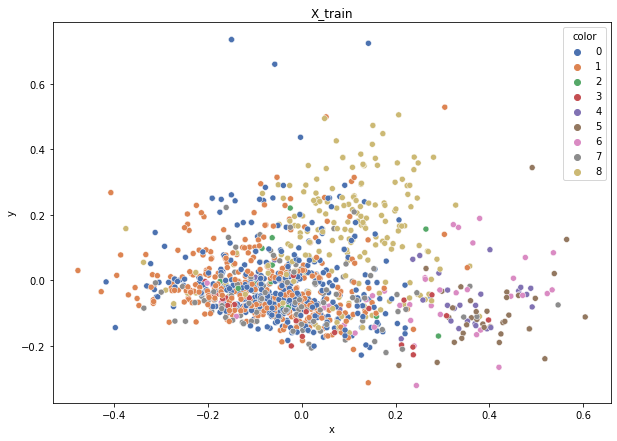

Class cardinalities: Counter({0: 371, 1: 343, 8: 195, 7: 134, 6: 41, 5: 35, 4: 28, 3: 24, 2: 16})
Weights: {1: 0.013814401543936261, 8: 0.02429917810035968, 0: 0.012771805200997676, 5: 0.13538113513057534, 6: 0.11556926169683263, 7: 0.035360744250523414, 3: 0.1974308220654224, 4: 0.16922641891321918, 2: 0.2961462330981336}


100%|██████████| 297/297 [00:00<00:00, 3337.84it/s]


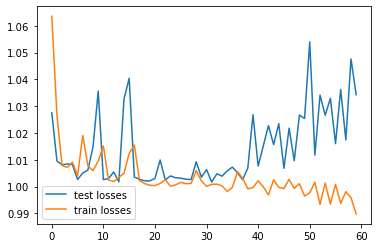

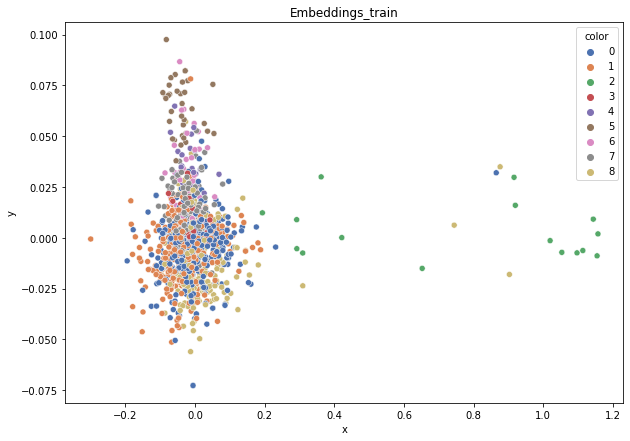

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


DT-f1-new-features: 0.368
DT-f1-old+new-features: 0.408
DT-f1-old-features: 0.451
DT-gmean-new-features: 0.206
DT-gmean-old+new-features: 0.224
DT-gmean-old-features: 0.26
KNN-f1-new-features: 0.492
KNN-f1-old+new-features: 0.494
KNN-f1-old-features: 0.494
KNN-gmean-new-features: 0.259
KNN-gmean-old+new-features: 0.268
KNN-gmean-old-features: 0.268
LDA-f1-new-features: 0.515
LDA-f1-old+new-features: 0.57
LDA-f1-old-features: 0.57
LDA-gmean-new-features: 0.277
LDA-gmean-old+new-features: 0.307
LDA-gmean-old-features: 0.307
QDA-f1-new-features: 0.518
QDA-f1-old+new-features: 0.252
QDA-f1-old-features: 0.1
QDA-gmean-new-features: 0.262
QDA-gmean-old+new-features: 0.076
QDA-gmean-old-features: 0.033
RF24-f1-new-features: 0.467
RF24-f1-old+new-features: 0.561
RF24-f1-old-features: 0.612
RF24-gmean-new-features: 0.258
RF24-gmean-old+new-features: 0.31
RF24-gmean-old-features: 0.332


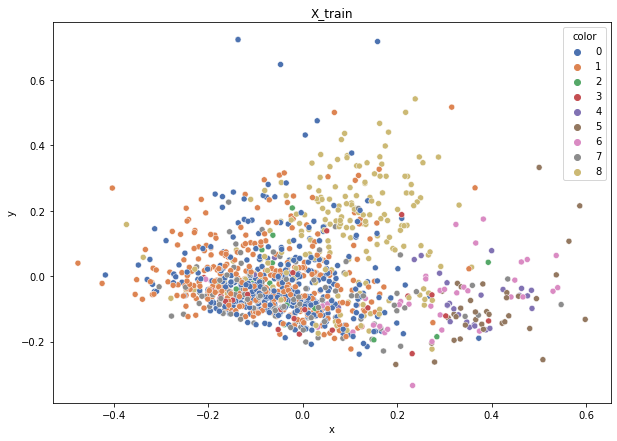

Class cardinalities: Counter({0: 371, 1: 343, 8: 195, 7: 134, 6: 41, 5: 35, 4: 28, 3: 24, 2: 16})
Weights: {8: 0.024299178100359677, 1: 0.01381440154393626, 0: 0.012771805200997674, 5: 0.13538113513057534, 4: 0.16922641891321916, 6: 0.11556926169683261, 7: 0.03536074425052341, 3: 0.19743082206542237, 2: 0.29614623309813354}


100%|██████████| 297/297 [00:00<00:00, 3151.82it/s]


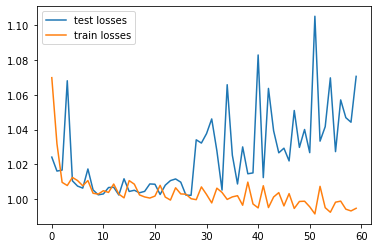

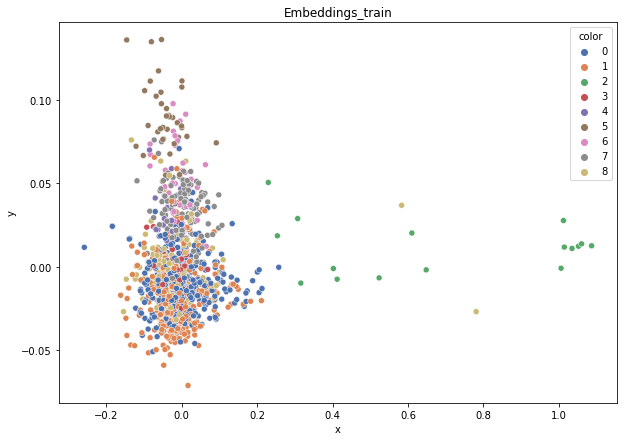

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


DT-f1-new-features: 0.362
DT-f1-old+new-features: 0.364
DT-f1-old-features: 0.407
DT-gmean-new-features: 0.214
DT-gmean-old+new-features: 0.198
DT-gmean-old-features: 0.401
KNN-f1-new-features: 0.45
KNN-f1-old+new-features: 0.451
KNN-f1-old-features: 0.451
KNN-gmean-new-features: 0.251
KNN-gmean-old+new-features: 0.422
KNN-gmean-old-features: 0.422
LDA-f1-new-features: 0.476
LDA-f1-old+new-features: 0.498
LDA-f1-old-features: 0.492
LDA-gmean-new-features: 0.269
LDA-gmean-old+new-features: 0.273
LDA-gmean-old-features: 0.267
QDA-f1-new-features: 0.394
QDA-f1-old+new-features: 0.345
QDA-f1-old-features: 0.262
QDA-gmean-new-features: 0.129
QDA-gmean-old+new-features: 0.184
QDA-gmean-old-features: 0.079
RF24-f1-new-features: 0.421
RF24-f1-old+new-features: 0.475
RF24-f1-old-features: 0.538
RF24-gmean-new-features: 0.225
RF24-gmean-old+new-features: 0.256
RF24-gmean-old-features: 0.474


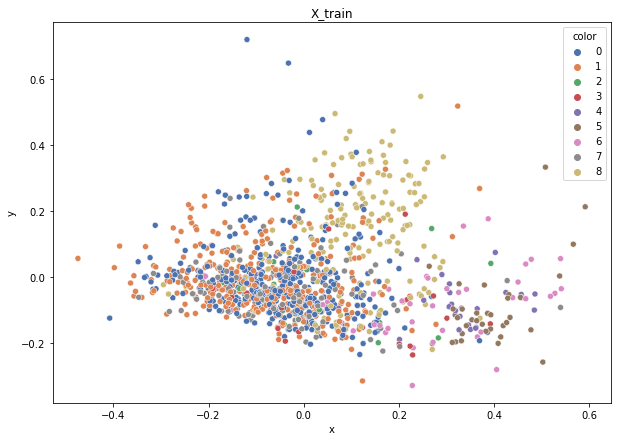

Class cardinalities: Counter({0: 370, 1: 344, 8: 195, 7: 134, 6: 41, 5: 35, 4: 28, 3: 24, 2: 16})
Weights: {8: 0.024299315142460837, 1: 0.013774321083662392, 0: 0.012806395818323955, 5: 0.13538189865085323, 4: 0.16922737331356652, 6: 0.11556991348243568, 7: 0.03536094367746166, 3: 0.1974319355324943, 2: 0.29614790329874147}


100%|██████████| 297/297 [00:00<00:00, 3280.30it/s]


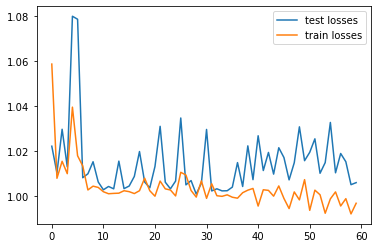

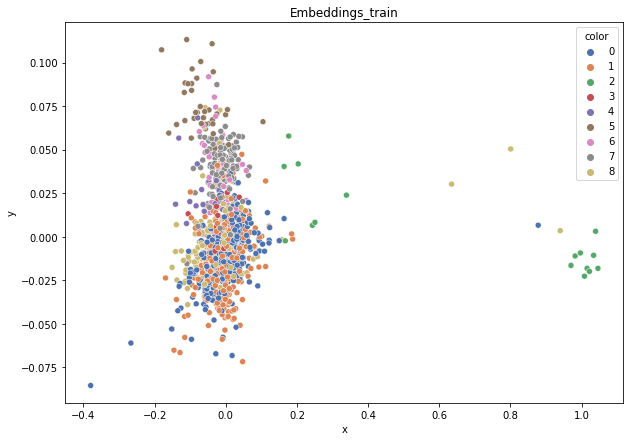

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


DT-f1-new-features: 0.407
DT-f1-old+new-features: 0.402
DT-f1-old-features: 0.437
DT-gmean-new-features: 0.379
DT-gmean-old+new-features: 0.356
DT-gmean-old-features: 0.247
KNN-f1-new-features: 0.446
KNN-f1-old+new-features: 0.492
KNN-f1-old-features: 0.492
KNN-gmean-new-features: 0.397
KNN-gmean-old+new-features: 0.439
KNN-gmean-old-features: 0.439
LDA-f1-new-features: 0.492
LDA-f1-old+new-features: 0.512
LDA-f1-old-features: 0.5
LDA-gmean-new-features: 0.261
LDA-gmean-old+new-features: 0.268
LDA-gmean-old-features: 0.26
QDA-f1-new-features: 0.423
QDA-f1-old+new-features: 0.226
QDA-f1-old-features: 0.106
QDA-gmean-new-features: 0.222
QDA-gmean-old+new-features: 0.122
QDA-gmean-old-features: 0.026
RF24-f1-new-features: 0.488
RF24-f1-old+new-features: 0.52
RF24-f1-old-features: 0.531
RF24-gmean-new-features: 0.272
RF24-gmean-old+new-features: 0.289
RF24-gmean-old-features: 0.277


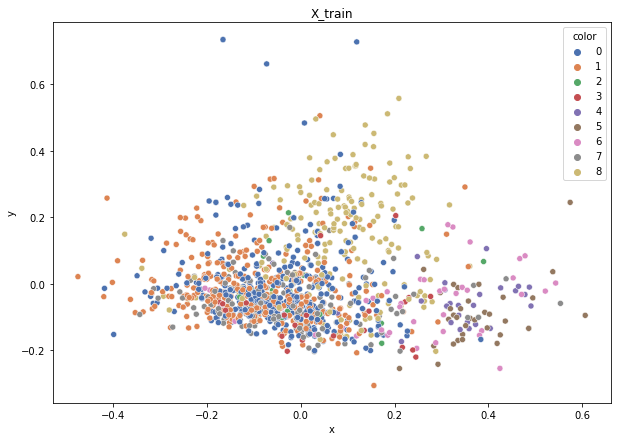

Class cardinalities: Counter({0: 370, 1: 343, 8: 196, 7: 135, 6: 41, 5: 35, 4: 28, 3: 24, 2: 16})
Weights: {8: 0.02418370057482606, 1: 0.013819257471329179, 0: 0.012810825169367322, 5: 0.13542872321902596, 4: 0.16928590402378244, 6: 0.11560988567477826, 7: 0.035111150464191915, 3: 0.1975002213610795, 2: 0.29625033204161927}


100%|██████████| 296/296 [00:00<00:00, 3150.91it/s]


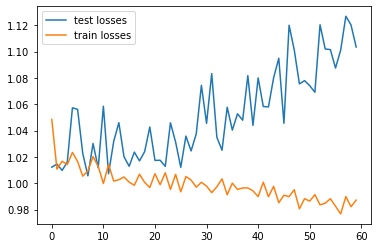

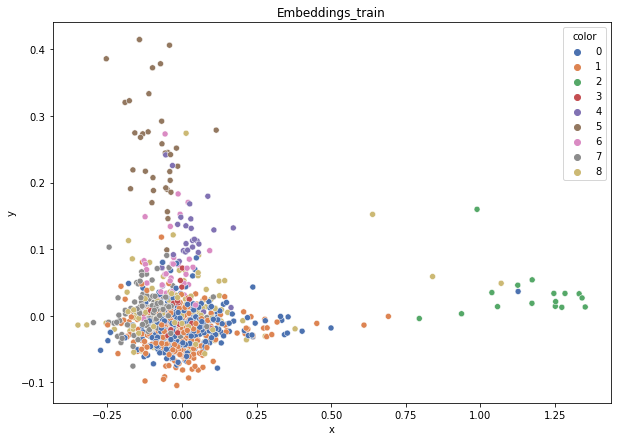

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


DT-f1-new-features: 0.422
DT-f1-old+new-features: 0.482
DT-f1-old-features: 0.423
DT-gmean-new-features: 0.372
DT-gmean-old+new-features: 0.445
DT-gmean-old-features: 0.236
KNN-f1-new-features: 0.443
KNN-f1-old+new-features: 0.459
KNN-f1-old-features: 0.452
KNN-gmean-new-features: 0.367
KNN-gmean-old+new-features: 0.402
KNN-gmean-old-features: 0.403
LDA-f1-new-features: 0.533
LDA-f1-old+new-features: 0.55
LDA-f1-old-features: 0.532
LDA-gmean-new-features: 0.482
LDA-gmean-old+new-features: 0.288
LDA-gmean-old-features: 0.274
QDA-f1-new-features: 0.439
QDA-f1-old+new-features: 0.273
QDA-f1-old-features: 0.118
QDA-gmean-new-features: 0.139
QDA-gmean-old+new-features: 0.099
QDA-gmean-old-features: 0.043
RF24-f1-new-features: 0.504
RF24-f1-old+new-features: 0.523
RF24-f1-old-features: 0.569
RF24-gmean-new-features: 0.266
RF24-gmean-old+new-features: 0.275
RF24-gmean-old-features: 0.295
1czysty-cut


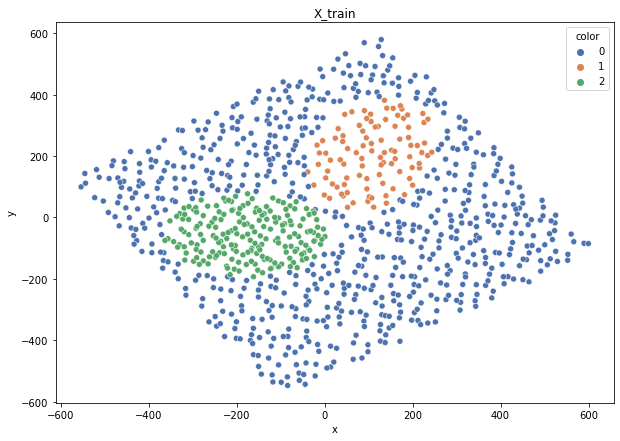

Class cardinalities: Counter({0: 672, 2: 192, 1: 96})
Weights: {1: 0.6086956521739131, 0: 0.08695652173913043, 2: 0.30434782608695654}


100%|██████████| 240/240 [00:00<00:00, 3139.72it/s]


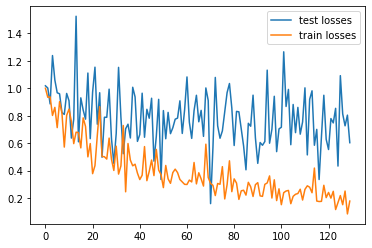

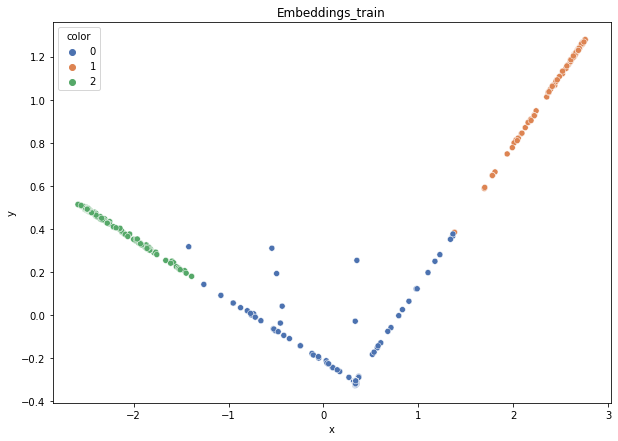

DT-f1-new-features: 0.952
DT-f1-old+new-features: 0.952
DT-f1-old-features: 0.901
DT-gmean-new-features: 0.951
DT-gmean-old+new-features: 0.951
DT-gmean-old-features: 0.889
KNN-f1-new-features: 0.952
KNN-f1-old+new-features: 0.949
KNN-f1-old-features: 0.937
KNN-gmean-new-features: 0.951
KNN-gmean-old+new-features: 0.945
KNN-gmean-old-features: 0.941
LDA-f1-new-features: 0.964
LDA-f1-old+new-features: 0.964
LDA-f1-old-features: 0.262
LDA-gmean-new-features: 0.978
LDA-gmean-old+new-features: 0.978
LDA-gmean-old-features: 0.01
QDA-f1-new-features: 0.948
QDA-f1-old+new-features: 0.95
QDA-f1-old-features: 0.805
QDA-gmean-new-features: 0.979
QDA-gmean-old+new-features: 0.974
QDA-gmean-old-features: 0.701
RF24-f1-new-features: 0.952
RF24-f1-old+new-features: 0.952
RF24-f1-old-features: 0.934
RF24-gmean-new-features: 0.951
RF24-gmean-old+new-features: 0.951
RF24-gmean-old-features: 0.939


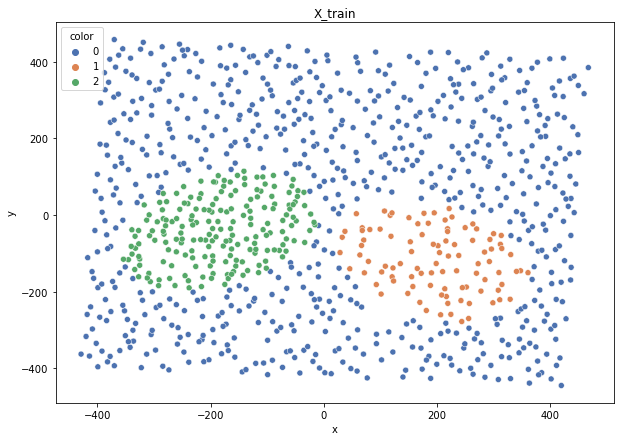

Class cardinalities: Counter({0: 672, 2: 192, 1: 96})
Weights: {1: 0.6086956521739131, 0: 0.08695652173913043, 2: 0.30434782608695654}


100%|██████████| 240/240 [00:00<00:00, 3549.43it/s]


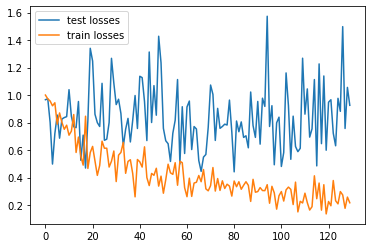

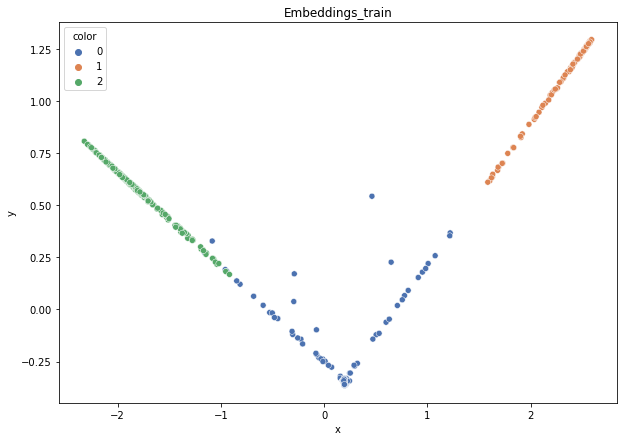

DT-f1-new-features: 0.947
DT-f1-old+new-features: 0.947
DT-f1-old-features: 0.929
DT-gmean-new-features: 0.912
DT-gmean-old+new-features: 0.912
DT-gmean-old-features: 0.928
KNN-f1-new-features: 0.947
KNN-f1-old+new-features: 0.947
KNN-f1-old-features: 0.945
KNN-gmean-new-features: 0.917
KNN-gmean-old+new-features: 0.912
KNN-gmean-old-features: 0.934
LDA-f1-new-features: 0.957
LDA-f1-old+new-features: 0.957
LDA-f1-old-features: 0.265
LDA-gmean-new-features: 0.933
LDA-gmean-old+new-features: 0.933
LDA-gmean-old-features: 0.01
QDA-f1-new-features: 0.97
QDA-f1-old+new-features: 0.97
QDA-f1-old-features: 0.817
QDA-gmean-new-features: 0.966
QDA-gmean-old+new-features: 0.955
QDA-gmean-old-features: 0.709
RF24-f1-new-features: 0.952
RF24-f1-old+new-features: 0.947
RF24-f1-old-features: 0.901
RF24-gmean-new-features: 0.919
RF24-gmean-old+new-features: 0.912
RF24-gmean-old-features: 0.906


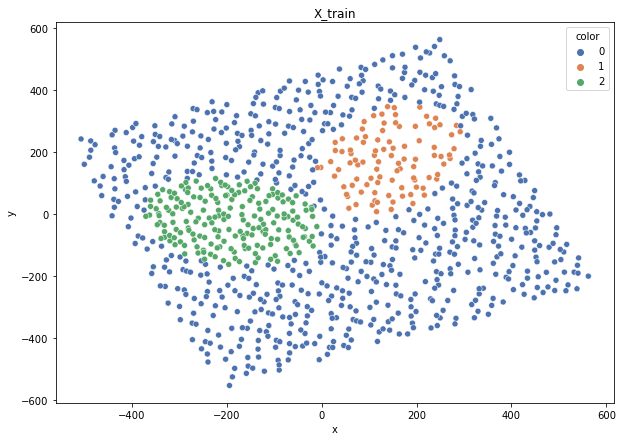

Class cardinalities: Counter({0: 672, 2: 192, 1: 96})
Weights: {1: 0.6086956521739131, 0: 0.08695652173913043, 2: 0.30434782608695654}


100%|██████████| 240/240 [00:00<00:00, 3450.35it/s]


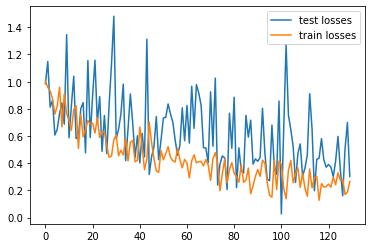

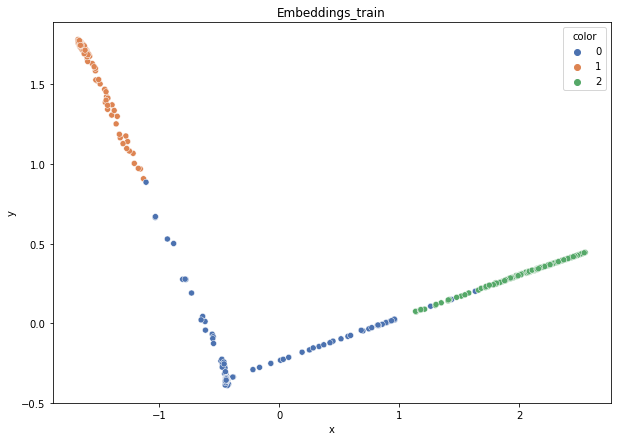

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


DT-f1-new-features: 0.975
DT-f1-old+new-features: 0.966
DT-f1-old-features: 0.942
DT-gmean-new-features: 0.968
DT-gmean-old+new-features: 0.941
DT-gmean-old-features: 0.934
KNN-f1-new-features: 0.975
KNN-f1-old+new-features: 0.976
KNN-f1-old-features: 0.957
KNN-gmean-new-features: 0.963
KNN-gmean-old+new-features: 0.969
KNN-gmean-old-features: 0.933
LDA-f1-new-features: 0.983
LDA-f1-old+new-features: 0.979
LDA-f1-old-features: 0.256
LDA-gmean-new-features: 0.982
LDA-gmean-old+new-features: 0.98
LDA-gmean-old-features: 0.01
QDA-f1-new-features: 0.984
QDA-f1-old+new-features: 0.984
QDA-f1-old-features: 0.856
QDA-gmean-new-features: 0.984
QDA-gmean-old+new-features: 0.984
QDA-gmean-old-features: 0.783
RF24-f1-new-features: 0.975
RF24-f1-old+new-features: 0.975
RF24-f1-old-features: 0.951
RF24-gmean-new-features: 0.968
RF24-gmean-old+new-features: 0.968
RF24-gmean-old-features: 0.949


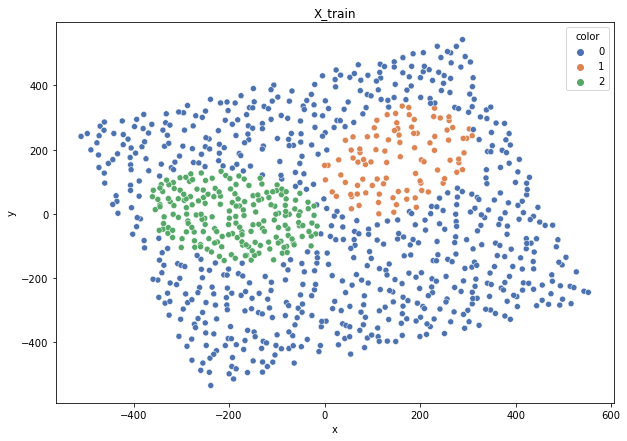

Class cardinalities: Counter({0: 672, 2: 192, 1: 96})
Weights: {1: 0.6086956521739131, 0: 0.08695652173913043, 2: 0.30434782608695654}


100%|██████████| 240/240 [00:00<00:00, 3457.63it/s]


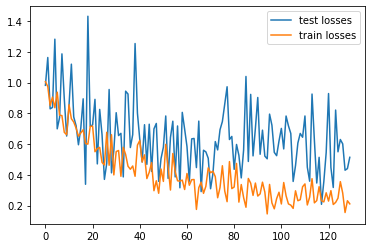

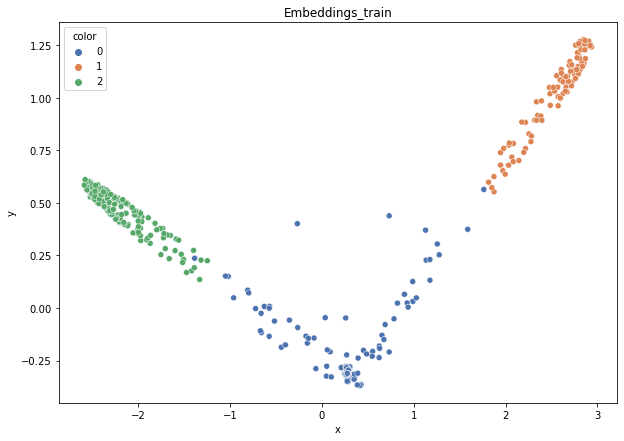

DT-f1-new-features: 0.974
DT-f1-old+new-features: 0.974
DT-f1-old-features: 0.932
DT-gmean-new-features: 0.973
DT-gmean-old+new-features: 0.973
DT-gmean-old-features: 0.959
KNN-f1-new-features: 0.987
KNN-f1-old+new-features: 0.964
KNN-f1-old-features: 0.931
KNN-gmean-new-features: 0.989
KNN-gmean-old+new-features: 0.983
KNN-gmean-old-features: 0.957
LDA-f1-new-features: 0.967
LDA-f1-old+new-features: 0.967
LDA-f1-old-features: 0.28
LDA-gmean-new-features: 0.983
LDA-gmean-old+new-features: 0.983
LDA-gmean-old-features: 0.034
QDA-f1-new-features: 0.933
QDA-f1-old+new-features: 0.94
QDA-f1-old-features: 0.864
QDA-gmean-new-features: 0.966
QDA-gmean-old+new-features: 0.973
QDA-gmean-old-features: 0.798
RF24-f1-new-features: 0.974
RF24-f1-old+new-features: 0.974
RF24-f1-old-features: 0.937
RF24-gmean-new-features: 0.973
RF24-gmean-old+new-features: 0.973
RF24-gmean-old-features: 0.963


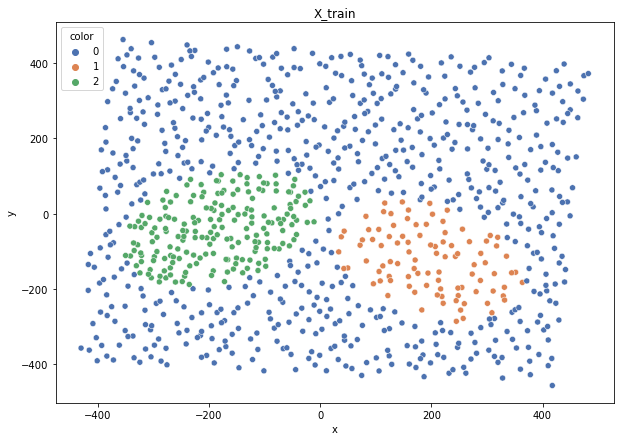

Class cardinalities: Counter({0: 672, 2: 192, 1: 96})
Weights: {1: 0.6086956521739131, 0: 0.08695652173913043, 2: 0.30434782608695654}


100%|██████████| 240/240 [00:00<00:00, 3570.41it/s]


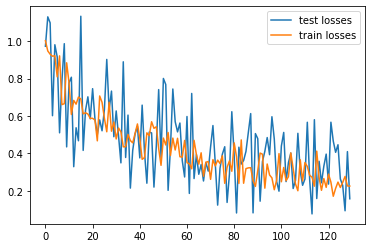

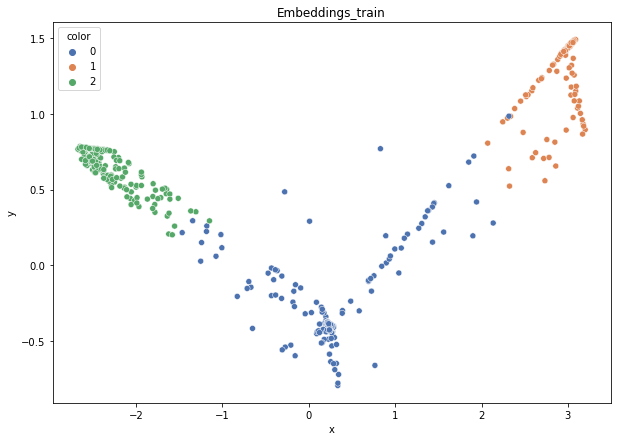

DT-f1-new-features: 0.983
DT-f1-old+new-features: 0.983
DT-f1-old-features: 0.973
DT-gmean-new-features: 0.982
DT-gmean-old+new-features: 0.982
DT-gmean-old-features: 0.973
KNN-f1-new-features: 0.97
KNN-f1-old+new-features: 0.975
KNN-f1-old-features: 0.958
KNN-gmean-new-features: 0.961
KNN-gmean-old+new-features: 0.963
KNN-gmean-old-features: 0.955
LDA-f1-new-features: 0.987
LDA-f1-old+new-features: 0.987
LDA-f1-old-features: 0.259
LDA-gmean-new-features: 0.994
LDA-gmean-old+new-features: 0.994
LDA-gmean-old-features: 0.01
QDA-f1-new-features: 0.973
QDA-f1-old+new-features: 0.978
QDA-f1-old-features: 0.728
QDA-gmean-new-features: 0.968
QDA-gmean-old+new-features: 0.975
QDA-gmean-old-features: 0.59
RF24-f1-new-features: 0.983
RF24-f1-old+new-features: 0.983
RF24-f1-old-features: 0.948
RF24-gmean-new-features: 0.982
RF24-gmean-old+new-features: 0.982
RF24-gmean-old-features: 0.936
2delikatne-cut


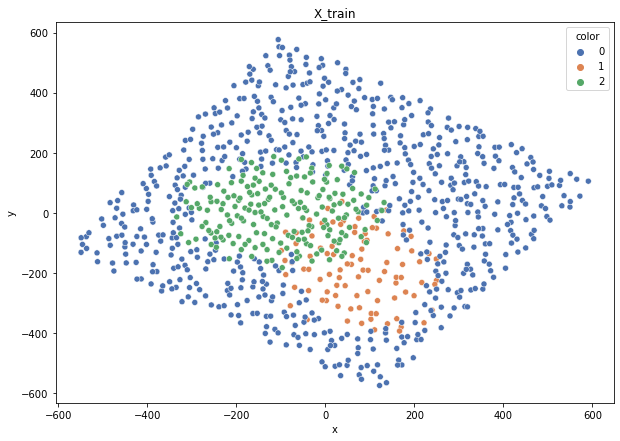

Class cardinalities: Counter({0: 672, 2: 192, 1: 96})
Weights: {1: 0.6086956521739131, 0: 0.08695652173913043, 2: 0.30434782608695654}


100%|██████████| 240/240 [00:00<00:00, 3523.11it/s]


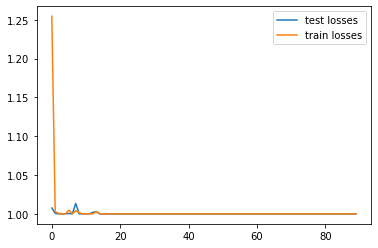

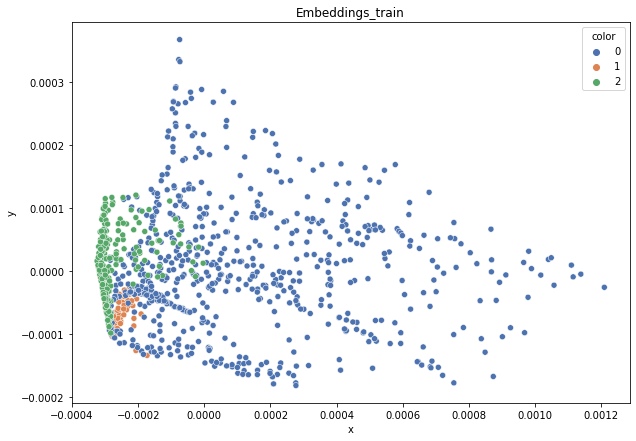

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


DT-f1-new-features: 0.748
DT-f1-old+new-features: 0.687
DT-f1-old-features: 0.69
DT-gmean-new-features: 0.737
DT-gmean-old+new-features: 0.684
DT-gmean-old-features: 0.674
KNN-f1-new-features: 0.677
KNN-f1-old+new-features: 0.693
KNN-f1-old-features: 0.693
KNN-gmean-new-features: 0.657
KNN-gmean-old+new-features: 0.674
KNN-gmean-old-features: 0.674
LDA-f1-new-features: 0.77
LDA-f1-old+new-features: 0.775
LDA-f1-old-features: 0.274
LDA-gmean-new-features: 0.843
LDA-gmean-old+new-features: 0.83
LDA-gmean-old-features: 0.01
QDA-f1-new-features: 0.777
QDA-f1-old+new-features: 0.751
QDA-f1-old-features: 0.615
QDA-gmean-new-features: 0.837
QDA-gmean-old+new-features: 0.809
QDA-gmean-old-features: 0.443
RF24-f1-new-features: 0.75
RF24-f1-old+new-features: 0.759
RF24-f1-old-features: 0.774
RF24-gmean-new-features: 0.743
RF24-gmean-old+new-features: 0.744
RF24-gmean-old-features: 0.76


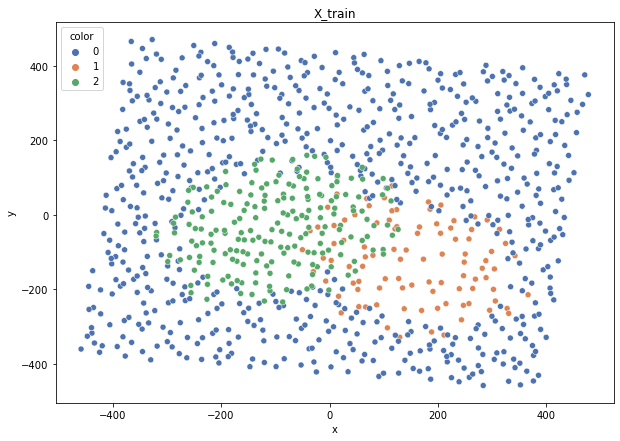

Class cardinalities: Counter({0: 672, 2: 192, 1: 96})
Weights: {1: 0.6086956521739131, 0: 0.08695652173913043, 2: 0.30434782608695654}


100%|██████████| 240/240 [00:00<00:00, 3536.10it/s]


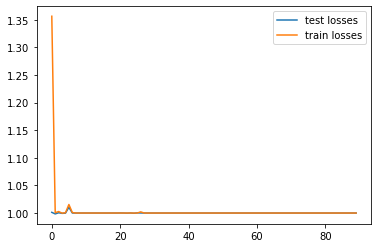

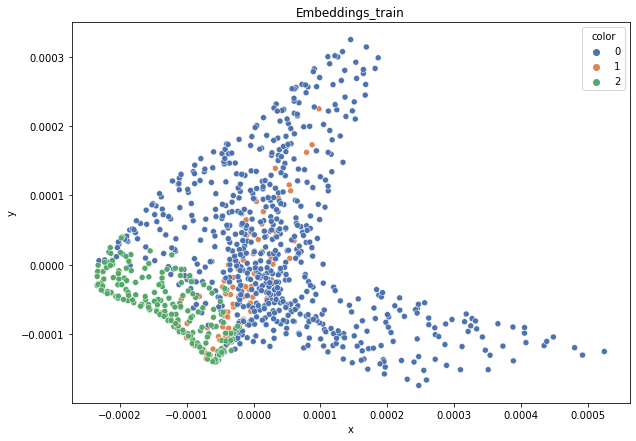

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


DT-f1-new-features: 0.691
DT-f1-old+new-features: 0.697
DT-f1-old-features: 0.763
DT-gmean-new-features: 0.708
DT-gmean-old+new-features: 0.708
DT-gmean-old-features: 0.787
KNN-f1-new-features: 0.772
KNN-f1-old+new-features: 0.742
KNN-f1-old-features: 0.742
KNN-gmean-new-features: 0.756
KNN-gmean-old+new-features: 0.727
KNN-gmean-old-features: 0.727
LDA-f1-new-features: 0.802
LDA-f1-old+new-features: 0.826
LDA-f1-old-features: 0.275
LDA-gmean-new-features: 0.844
LDA-gmean-old+new-features: 0.867
LDA-gmean-old-features: 0.01
QDA-f1-new-features: 0.708
QDA-f1-old+new-features: 0.695
QDA-f1-old-features: 0.646
QDA-gmean-new-features: 0.81
QDA-gmean-old+new-features: 0.798
QDA-gmean-old-features: 0.503
RF24-f1-new-features: 0.801
RF24-f1-old+new-features: 0.803
RF24-f1-old-features: 0.776
RF24-gmean-new-features: 0.811
RF24-gmean-old+new-features: 0.806
RF24-gmean-old-features: 0.776


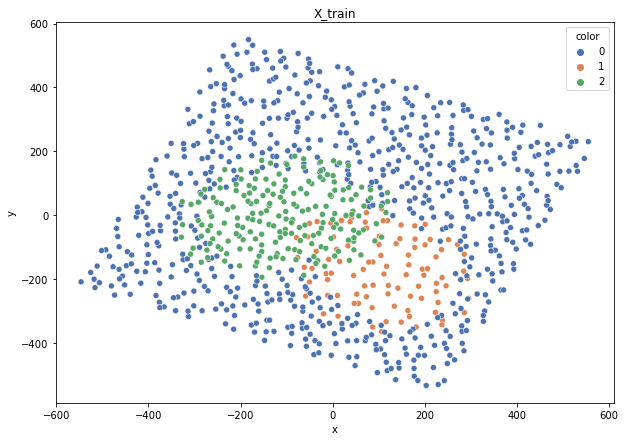

Class cardinalities: Counter({0: 672, 2: 192, 1: 96})
Weights: {1: 0.6086956521739131, 0: 0.08695652173913043, 2: 0.30434782608695654}


100%|██████████| 240/240 [00:00<00:00, 3466.02it/s]


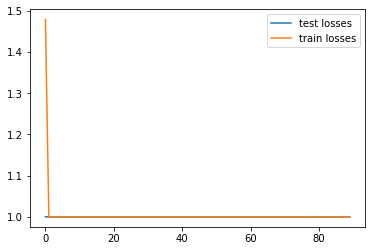

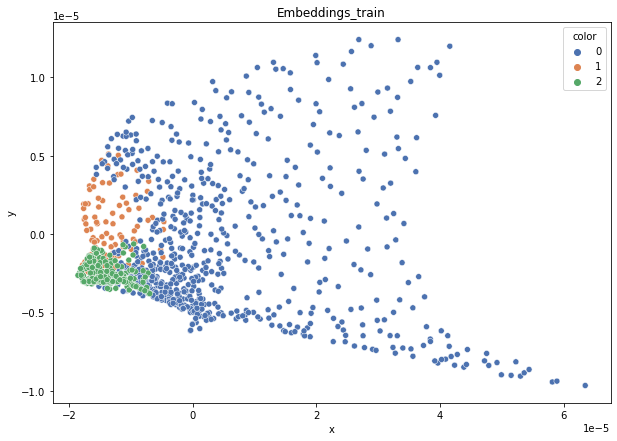

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


DT-f1-new-features: 0.754
DT-f1-old+new-features: 0.711
DT-f1-old-features: 0.712
DT-gmean-new-features: 0.764
DT-gmean-old+new-features: 0.729
DT-gmean-old-features: 0.727
KNN-f1-new-features: 0.732
KNN-f1-old+new-features: 0.666
KNN-f1-old-features: 0.666
KNN-gmean-new-features: 0.699
KNN-gmean-old+new-features: 0.636
KNN-gmean-old-features: 0.636
LDA-f1-new-features: 0.769
LDA-f1-old+new-features: 0.794
LDA-f1-old-features: 0.275
LDA-gmean-new-features: 0.754
LDA-gmean-old+new-features: 0.79
LDA-gmean-old-features: 0.01
QDA-f1-new-features: 0.751
QDA-f1-old+new-features: 0.746
QDA-f1-old-features: 0.657
QDA-gmean-new-features: 0.799
QDA-gmean-old+new-features: 0.786
QDA-gmean-old-features: 0.514
RF24-f1-new-features: 0.782
RF24-f1-old+new-features: 0.753
RF24-f1-old-features: 0.757
RF24-gmean-new-features: 0.795
RF24-gmean-old+new-features: 0.759
RF24-gmean-old-features: 0.754


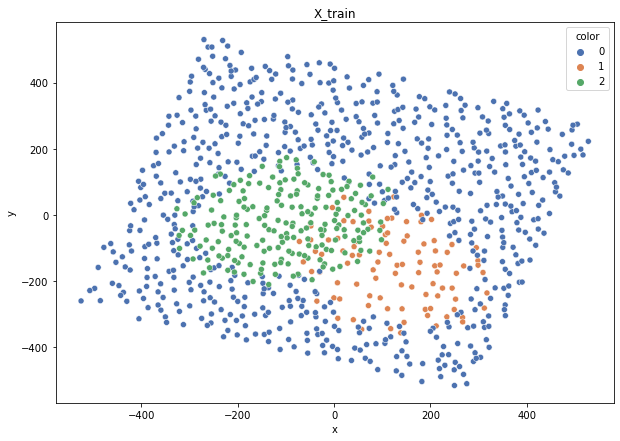

Class cardinalities: Counter({0: 672, 2: 192, 1: 96})
Weights: {1: 0.6086956521739131, 0: 0.08695652173913043, 2: 0.30434782608695654}


100%|██████████| 240/240 [00:00<00:00, 3422.07it/s]


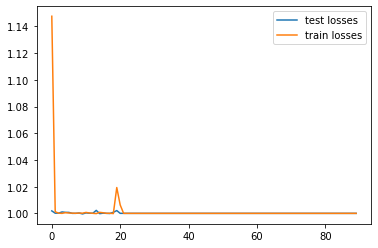

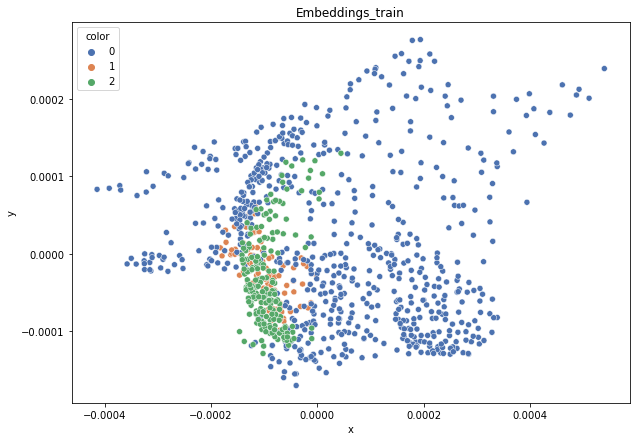

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


DT-f1-new-features: 0.7
DT-f1-old+new-features: 0.722
DT-f1-old-features: 0.712
DT-gmean-new-features: 0.704
DT-gmean-old+new-features: 0.729
DT-gmean-old-features: 0.724
KNN-f1-new-features: 0.721
KNN-f1-old+new-features: 0.73
KNN-f1-old-features: 0.73
KNN-gmean-new-features: 0.709
KNN-gmean-old+new-features: 0.735
KNN-gmean-old-features: 0.735
LDA-f1-new-features: 0.653
LDA-f1-old+new-features: 0.722
LDA-f1-old-features: 0.274
LDA-gmean-new-features: 0.639
LDA-gmean-old+new-features: 0.78
LDA-gmean-old-features: 0.01
QDA-f1-new-features: 0.716
QDA-f1-old+new-features: 0.702
QDA-f1-old-features: 0.668
QDA-gmean-new-features: 0.828
QDA-gmean-old+new-features: 0.819
QDA-gmean-old-features: 0.534
RF24-f1-new-features: 0.739
RF24-f1-old+new-features: 0.746
RF24-f1-old-features: 0.714
RF24-gmean-new-features: 0.75
RF24-gmean-old+new-features: 0.755
RF24-gmean-old-features: 0.712


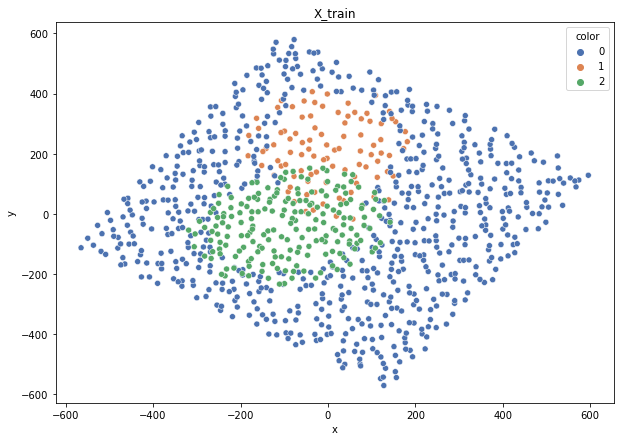

Class cardinalities: Counter({0: 672, 2: 192, 1: 96})
Weights: {1: 0.6086956521739131, 0: 0.08695652173913043, 2: 0.30434782608695654}


100%|██████████| 240/240 [00:00<00:00, 3514.42it/s]


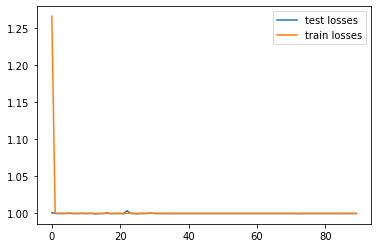

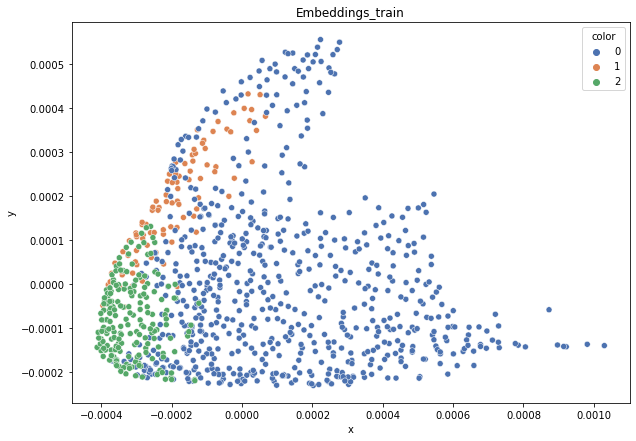

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


DT-f1-new-features: 0.696
DT-f1-old+new-features: 0.755
DT-f1-old-features: 0.744
DT-gmean-new-features: 0.674
DT-gmean-old+new-features: 0.73
DT-gmean-old-features: 0.774
KNN-f1-new-features: 0.702
KNN-f1-old+new-features: 0.669
KNN-f1-old-features: 0.669
KNN-gmean-new-features: 0.691
KNN-gmean-old+new-features: 0.62
KNN-gmean-old-features: 0.62
LDA-f1-new-features: 0.757
LDA-f1-old+new-features: 0.802
LDA-f1-old-features: 0.273
LDA-gmean-new-features: 0.757
LDA-gmean-old+new-features: 0.818
LDA-gmean-old-features: 0.01
QDA-f1-new-features: 0.753
QDA-f1-old+new-features: 0.751
QDA-f1-old-features: 0.709
QDA-gmean-new-features: 0.792
QDA-gmean-old+new-features: 0.811
QDA-gmean-old-features: 0.579
RF24-f1-new-features: 0.783
RF24-f1-old+new-features: 0.754
RF24-f1-old-features: 0.785
RF24-gmean-new-features: 0.744
RF24-gmean-old+new-features: 0.704
RF24-gmean-old-features: 0.783
3mocniej-cut


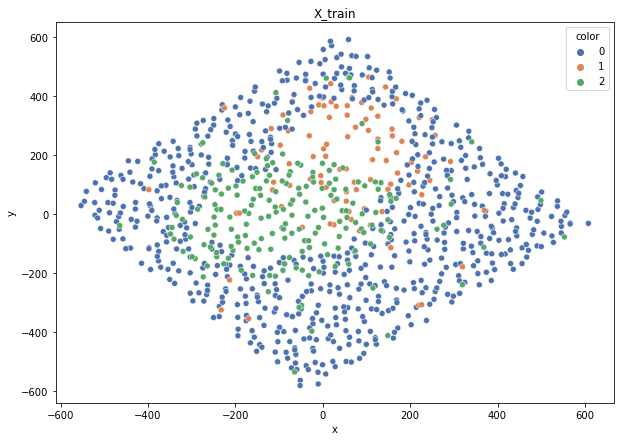

Class cardinalities: Counter({0: 672, 2: 192, 1: 96})
Weights: {1: 0.6086956521739131, 0: 0.08695652173913043, 2: 0.30434782608695654}


100%|██████████| 240/240 [00:00<00:00, 3529.63it/s]


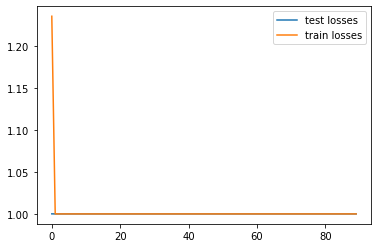

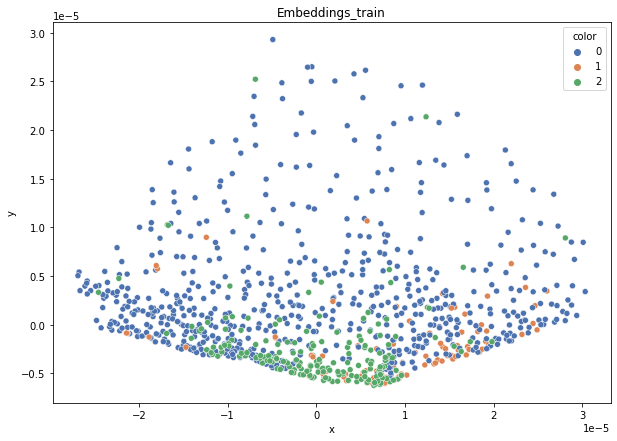

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


DT-f1-new-features: 0.572
DT-f1-old+new-features: 0.58
DT-f1-old-features: 0.522
DT-gmean-new-features: 0.606
DT-gmean-old+new-features: 0.608
DT-gmean-old-features: 0.524
KNN-f1-new-features: 0.536
KNN-f1-old+new-features: 0.537
KNN-f1-old-features: 0.537
KNN-gmean-new-features: 0.502
KNN-gmean-old+new-features: 0.502
KNN-gmean-old-features: 0.502
LDA-f1-new-features: 0.555
LDA-f1-old+new-features: 0.565
LDA-f1-old-features: 0.275
LDA-gmean-new-features: 0.472
LDA-gmean-old+new-features: 0.508
LDA-gmean-old-features: 0.01
QDA-f1-new-features: 0.505
QDA-f1-old+new-features: 0.536
QDA-f1-old-features: 0.275
QDA-gmean-new-features: 0.596
QDA-gmean-old+new-features: 0.604
QDA-gmean-old-features: 0.01
RF24-f1-new-features: 0.55
RF24-f1-old+new-features: 0.566
RF24-f1-old-features: 0.545
RF24-gmean-new-features: 0.506
RF24-gmean-old+new-features: 0.512
RF24-gmean-old-features: 0.493


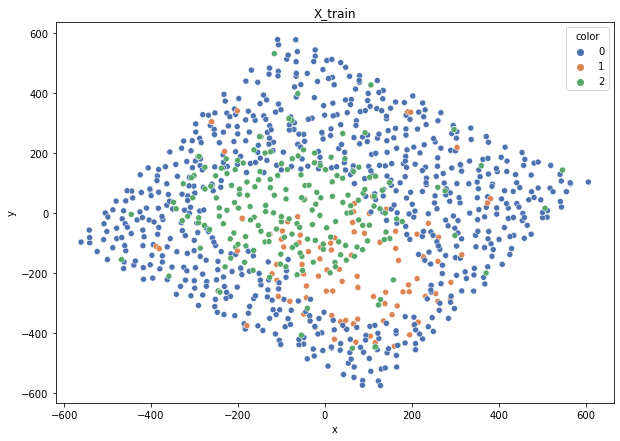

Class cardinalities: Counter({0: 672, 2: 192, 1: 96})
Weights: {1: 0.6086956521739131, 0: 0.08695652173913043, 2: 0.30434782608695654}


100%|██████████| 240/240 [00:00<00:00, 3325.17it/s]


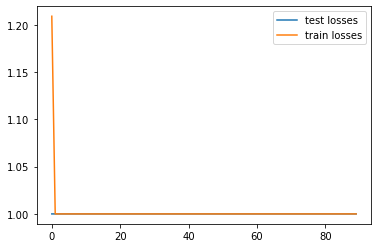

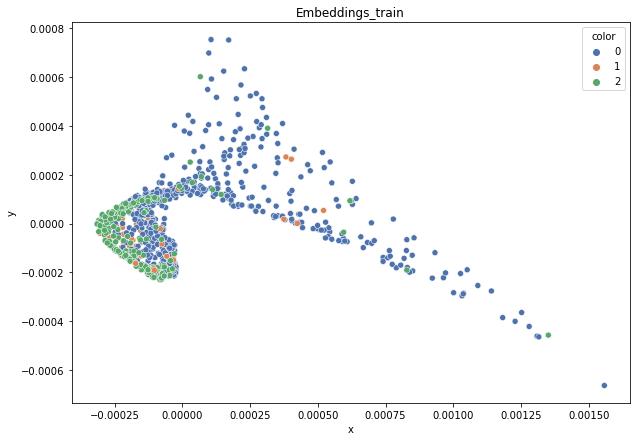

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


DT-f1-new-features: 0.557
DT-f1-old+new-features: 0.553
DT-f1-old-features: 0.531
DT-gmean-new-features: 0.568
DT-gmean-old+new-features: 0.583
DT-gmean-old-features: 0.547
KNN-f1-new-features: 0.563
KNN-f1-old+new-features: 0.536
KNN-f1-old-features: 0.536
KNN-gmean-new-features: 0.502
KNN-gmean-old+new-features: 0.479
KNN-gmean-old-features: 0.479
LDA-f1-new-features: 0.587
LDA-f1-old+new-features: 0.648
LDA-f1-old-features: 0.275
LDA-gmean-new-features: 0.455
LDA-gmean-old+new-features: 0.536
LDA-gmean-old-features: 0.01
QDA-f1-new-features: 0.551
QDA-f1-old+new-features: 0.568
QDA-f1-old-features: 0.275
QDA-gmean-new-features: 0.643
QDA-gmean-old+new-features: 0.659
QDA-gmean-old-features: 0.01
RF24-f1-new-features: 0.679
RF24-f1-old+new-features: 0.641
RF24-f1-old-features: 0.581
RF24-gmean-new-features: 0.622
RF24-gmean-old+new-features: 0.601
RF24-gmean-old-features: 0.551


/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


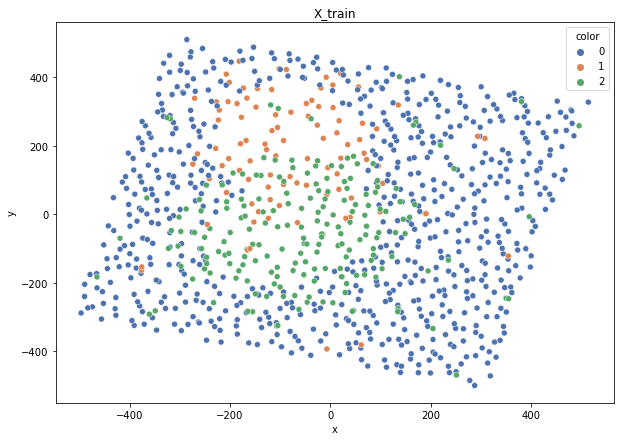

Class cardinalities: Counter({0: 672, 2: 192, 1: 96})
Weights: {1: 0.6086956521739131, 0: 0.08695652173913043, 2: 0.30434782608695654}


100%|██████████| 240/240 [00:00<00:00, 3477.53it/s]


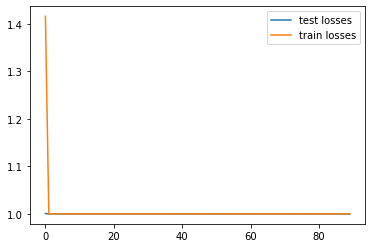

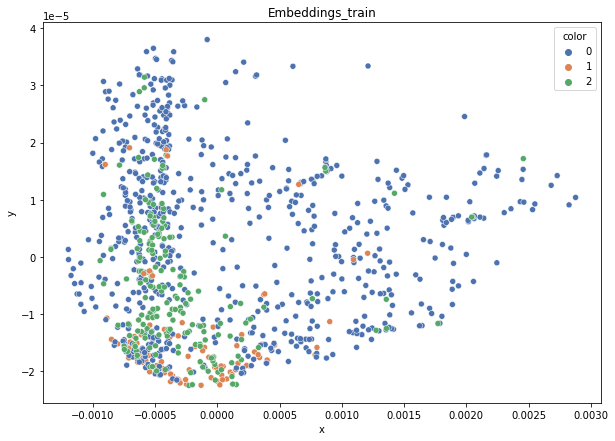

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


DT-f1-new-features: 0.383
DT-f1-old+new-features: 0.427
DT-f1-old-features: 0.442
DT-gmean-new-features: 0.303
DT-gmean-old+new-features: 0.382
DT-gmean-old-features: 0.43
KNN-f1-new-features: 0.465
KNN-f1-old+new-features: 0.438
KNN-f1-old-features: 0.438
KNN-gmean-new-features: 0.386
KNN-gmean-old+new-features: 0.373
KNN-gmean-old-features: 0.373
LDA-f1-new-features: 0.521
LDA-f1-old+new-features: 0.528
LDA-f1-old-features: 0.275
LDA-gmean-new-features: 0.345
LDA-gmean-old+new-features: 0.392
LDA-gmean-old-features: 0.01
QDA-f1-new-features: 0.509
QDA-f1-old+new-features: 0.528
QDA-f1-old-features: 0.275
QDA-gmean-new-features: 0.554
QDA-gmean-old+new-features: 0.574
QDA-gmean-old-features: 0.01
RF24-f1-new-features: 0.504
RF24-f1-old+new-features: 0.473
RF24-f1-old-features: 0.481
RF24-gmean-new-features: 0.438
RF24-gmean-old+new-features: 0.411
RF24-gmean-old-features: 0.396


/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


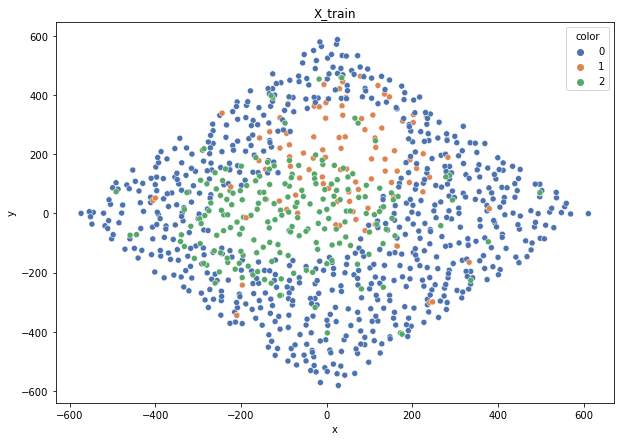

Class cardinalities: Counter({0: 672, 2: 192, 1: 96})
Weights: {1: 0.6086956521739131, 0: 0.08695652173913043, 2: 0.30434782608695654}


100%|██████████| 240/240 [00:00<00:00, 3402.09it/s]


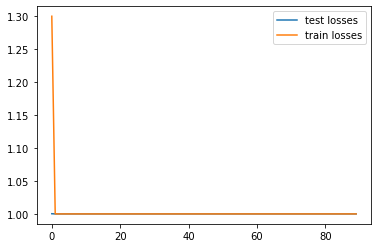

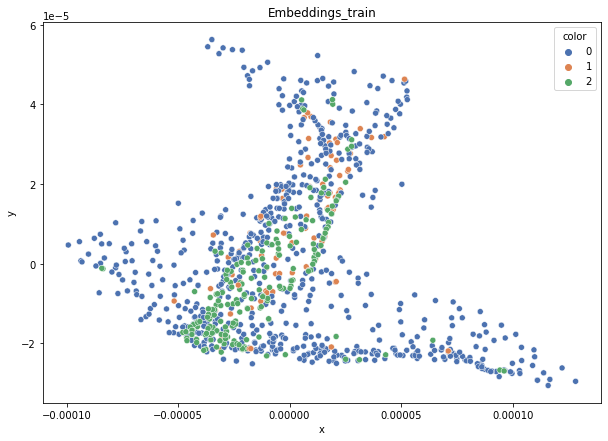

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


DT-f1-new-features: 0.532
DT-f1-old+new-features: 0.549
DT-f1-old-features: 0.477
DT-gmean-new-features: 0.51
DT-gmean-old+new-features: 0.535
DT-gmean-old-features: 0.473
KNN-f1-new-features: 0.543
KNN-f1-old+new-features: 0.51
KNN-f1-old-features: 0.51
KNN-gmean-new-features: 0.5
KNN-gmean-old+new-features: 0.464
KNN-gmean-old-features: 0.464
LDA-f1-new-features: 0.585
LDA-f1-old+new-features: 0.59
LDA-f1-old-features: 0.275
LDA-gmean-new-features: 0.511
LDA-gmean-old+new-features: 0.529
LDA-gmean-old-features: 0.01
QDA-f1-new-features: 0.574
QDA-f1-old+new-features: 0.592
QDA-f1-old-features: 0.275
QDA-gmean-new-features: 0.642
QDA-gmean-old+new-features: 0.672
QDA-gmean-old-features: 0.01
RF24-f1-new-features: 0.582
RF24-f1-old+new-features: 0.591
RF24-f1-old-features: 0.585
RF24-gmean-new-features: 0.556
RF24-gmean-old+new-features: 0.57
RF24-gmean-old-features: 0.584


/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


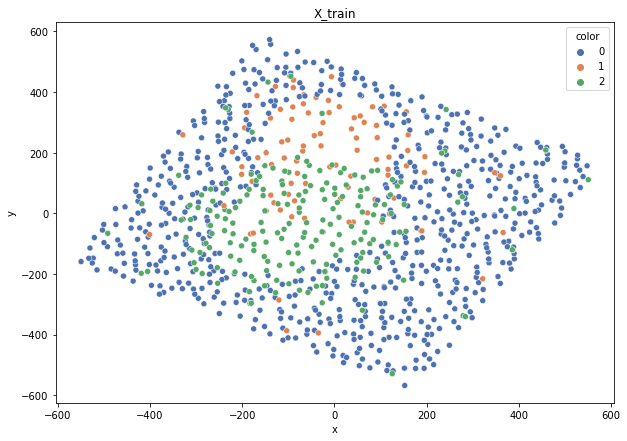

Class cardinalities: Counter({0: 672, 2: 192, 1: 96})
Weights: {1: 0.6086956521739131, 0: 0.08695652173913043, 2: 0.30434782608695654}


100%|██████████| 240/240 [00:00<00:00, 3396.53it/s]


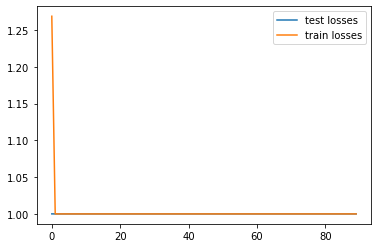

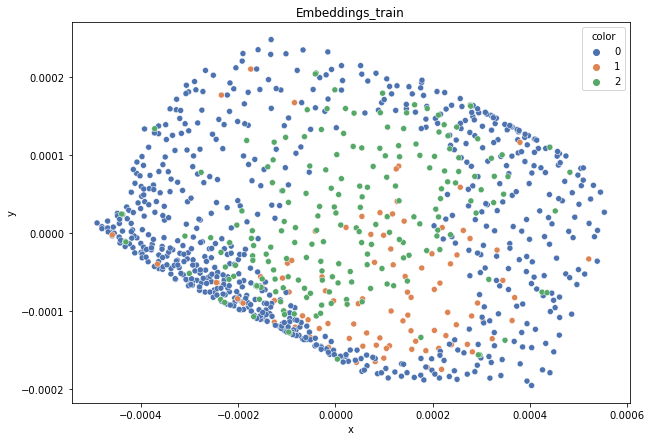

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


DT-f1-new-features: 0.589
DT-f1-old+new-features: 0.569
DT-f1-old-features: 0.552
DT-gmean-new-features: 0.602
DT-gmean-old+new-features: 0.565
DT-gmean-old-features: 0.536
KNN-f1-new-features: 0.503
KNN-f1-old+new-features: 0.522
KNN-f1-old-features: 0.522
KNN-gmean-new-features: 0.413
KNN-gmean-old+new-features: 0.471
KNN-gmean-old-features: 0.471
LDA-f1-new-features: 0.612
LDA-f1-old+new-features: 0.62
LDA-f1-old-features: 0.275
LDA-gmean-new-features: 0.548
LDA-gmean-old+new-features: 0.524
LDA-gmean-old-features: 0.01
QDA-f1-new-features: 0.555
QDA-f1-old+new-features: 0.543
QDA-f1-old-features: 0.275
QDA-gmean-new-features: 0.63
QDA-gmean-old+new-features: 0.615
QDA-gmean-old-features: 0.01
RF24-f1-new-features: 0.556
RF24-f1-old+new-features: 0.572
RF24-f1-old-features: 0.612
RF24-gmean-new-features: 0.47
RF24-gmean-old+new-features: 0.483
RF24-gmean-old-features: 0.574
4delikatne-bezover-cut


/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


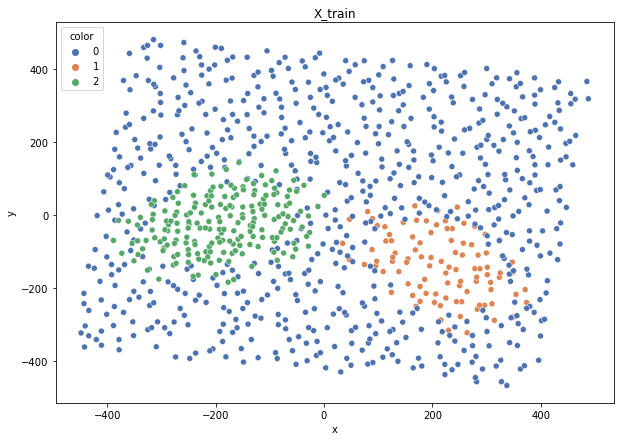

Class cardinalities: Counter({0: 672, 2: 192, 1: 96})
Weights: {1: 0.6086956521739131, 0: 0.08695652173913043, 2: 0.30434782608695654}


100%|██████████| 240/240 [00:00<00:00, 3442.00it/s]


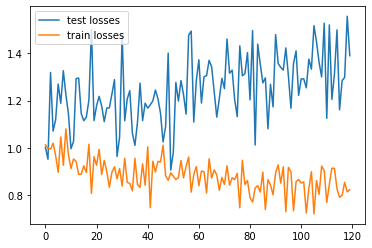

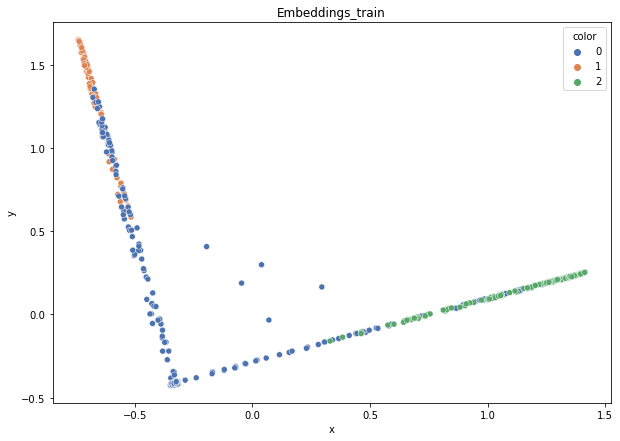

DT-f1-new-features: 0.805
DT-f1-old+new-features: 0.812
DT-f1-old-features: 0.809
DT-gmean-new-features: 0.799
DT-gmean-old+new-features: 0.801
DT-gmean-old-features: 0.814
KNN-f1-new-features: 0.781
KNN-f1-old+new-features: 0.791
KNN-f1-old-features: 0.772
KNN-gmean-new-features: 0.768
KNN-gmean-old+new-features: 0.758
KNN-gmean-old-features: 0.746
LDA-f1-new-features: 0.807
LDA-f1-old+new-features: 0.807
LDA-f1-old-features: 0.265
LDA-gmean-new-features: 0.815
LDA-gmean-old+new-features: 0.815
LDA-gmean-old-features: 0.026
QDA-f1-new-features: 0.814
QDA-f1-old+new-features: 0.798
QDA-f1-old-features: 0.739
QDA-gmean-new-features: 0.847
QDA-gmean-old+new-features: 0.825
QDA-gmean-old-features: 0.64
RF24-f1-new-features: 0.805
RF24-f1-old+new-features: 0.817
RF24-f1-old-features: 0.811
RF24-gmean-new-features: 0.799
RF24-gmean-old+new-features: 0.808
RF24-gmean-old-features: 0.811


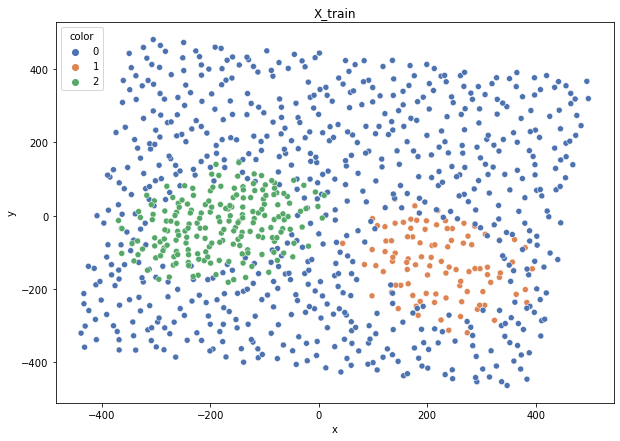

Class cardinalities: Counter({0: 672, 2: 192, 1: 96})
Weights: {1: 0.6086956521739131, 0: 0.08695652173913043, 2: 0.30434782608695654}


100%|██████████| 240/240 [00:00<00:00, 3382.38it/s]


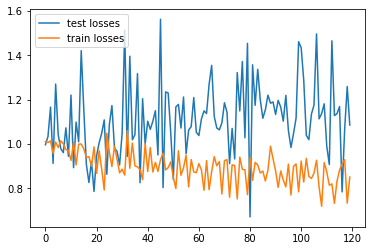

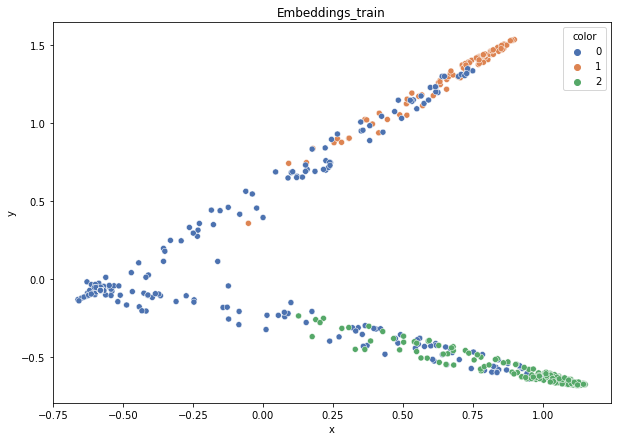

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


DT-f1-new-features: 0.817
DT-f1-old+new-features: 0.808
DT-f1-old-features: 0.761
DT-gmean-new-features: 0.842
DT-gmean-old+new-features: 0.828
DT-gmean-old-features: 0.769
KNN-f1-new-features: 0.852
KNN-f1-old+new-features: 0.814
KNN-f1-old-features: 0.767
KNN-gmean-new-features: 0.846
KNN-gmean-old+new-features: 0.792
KNN-gmean-old-features: 0.776
LDA-f1-new-features: 0.838
LDA-f1-old+new-features: 0.838
LDA-f1-old-features: 0.274
LDA-gmean-new-features: 0.883
LDA-gmean-old+new-features: 0.883
LDA-gmean-old-features: 0.027
QDA-f1-new-features: 0.82
QDA-f1-old+new-features: 0.824
QDA-f1-old-features: 0.843
QDA-gmean-new-features: 0.884
QDA-gmean-old+new-features: 0.886
QDA-gmean-old-features: 0.8
RF24-f1-new-features: 0.822
RF24-f1-old+new-features: 0.832
RF24-f1-old-features: 0.826
RF24-gmean-new-features: 0.843
RF24-gmean-old+new-features: 0.852
RF24-gmean-old-features: 0.845


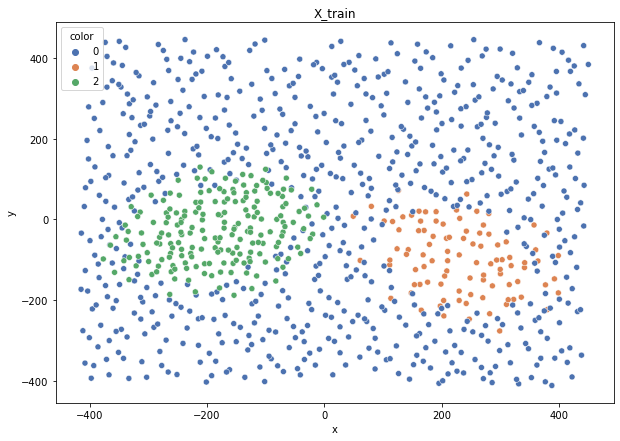

Class cardinalities: Counter({0: 672, 2: 192, 1: 96})
Weights: {1: 0.6086956521739131, 0: 0.08695652173913043, 2: 0.30434782608695654}


100%|██████████| 240/240 [00:00<00:00, 3438.99it/s]


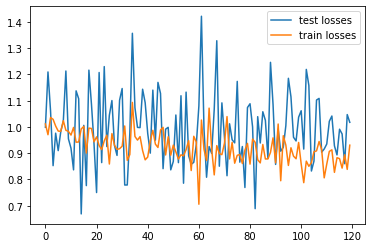

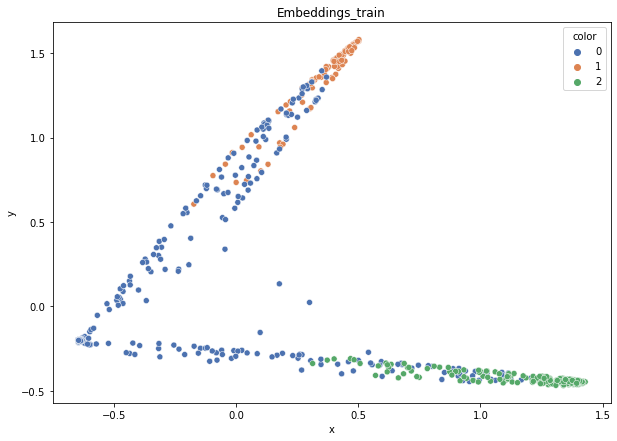

DT-f1-new-features: 0.846
DT-f1-old+new-features: 0.826
DT-f1-old-features: 0.785
DT-gmean-new-features: 0.817
DT-gmean-old+new-features: 0.791
DT-gmean-old-features: 0.785
KNN-f1-new-features: 0.804
KNN-f1-old+new-features: 0.801
KNN-f1-old-features: 0.766
KNN-gmean-new-features: 0.778
KNN-gmean-old+new-features: 0.788
KNN-gmean-old-features: 0.744
LDA-f1-new-features: 0.856
LDA-f1-old+new-features: 0.856
LDA-f1-old-features: 0.276
LDA-gmean-new-features: 0.883
LDA-gmean-old+new-features: 0.883
LDA-gmean-old-features: 0.027
QDA-f1-new-features: 0.844
QDA-f1-old+new-features: 0.858
QDA-f1-old-features: 0.718
QDA-gmean-new-features: 0.914
QDA-gmean-old+new-features: 0.916
QDA-gmean-old-features: 0.599
RF24-f1-new-features: 0.831
RF24-f1-old+new-features: 0.81
RF24-f1-old-features: 0.801
RF24-gmean-new-features: 0.798
RF24-gmean-old+new-features: 0.767
RF24-gmean-old-features: 0.78


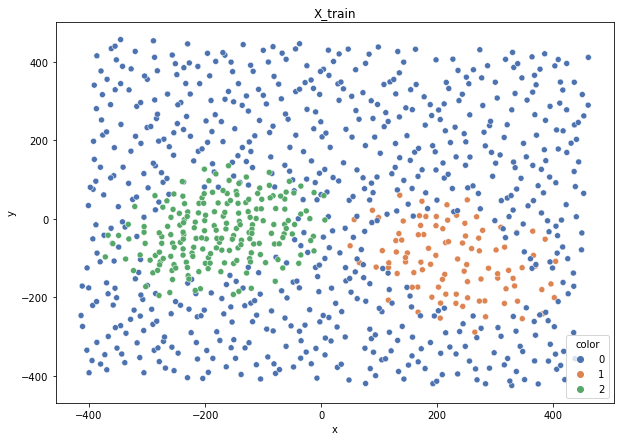

Class cardinalities: Counter({0: 672, 2: 192, 1: 96})
Weights: {1: 0.6086956521739131, 0: 0.08695652173913043, 2: 0.30434782608695654}


100%|██████████| 240/240 [00:00<00:00, 3491.29it/s]


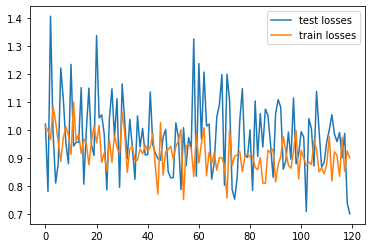

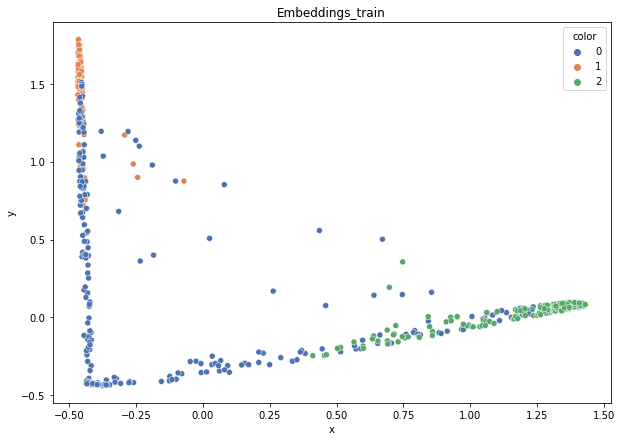

DT-f1-new-features: 0.873
DT-f1-old+new-features: 0.855
DT-f1-old-features: 0.805
DT-gmean-new-features: 0.927
DT-gmean-old+new-features: 0.887
DT-gmean-old-features: 0.831
KNN-f1-new-features: 0.82
KNN-f1-old+new-features: 0.765
KNN-f1-old-features: 0.747
KNN-gmean-new-features: 0.836
KNN-gmean-old+new-features: 0.767
KNN-gmean-old-features: 0.749
LDA-f1-new-features: 0.83
LDA-f1-old+new-features: 0.825
LDA-f1-old-features: 0.265
LDA-gmean-new-features: 0.917
LDA-gmean-old+new-features: 0.915
LDA-gmean-old-features: 0.01
QDA-f1-new-features: 0.797
QDA-f1-old+new-features: 0.814
QDA-f1-old-features: 0.828
QDA-gmean-new-features: 0.901
QDA-gmean-old+new-features: 0.919
QDA-gmean-old-features: 0.78
RF24-f1-new-features: 0.829
RF24-f1-old+new-features: 0.82
RF24-f1-old-features: 0.827
RF24-gmean-new-features: 0.871
RF24-gmean-old+new-features: 0.857
RF24-gmean-old-features: 0.871


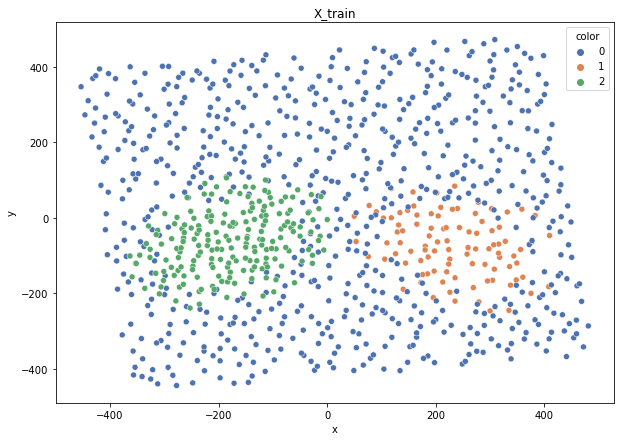

Class cardinalities: Counter({0: 672, 2: 192, 1: 96})
Weights: {1: 0.6086956521739131, 0: 0.08695652173913043, 2: 0.30434782608695654}


100%|██████████| 240/240 [00:00<00:00, 3383.16it/s]


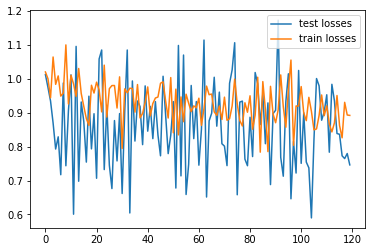

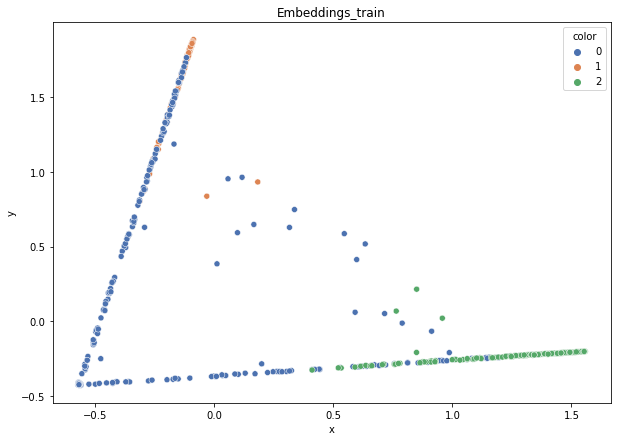

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


DT-f1-new-features: 0.878
DT-f1-old+new-features: 0.88
DT-f1-old-features: 0.821
DT-gmean-new-features: 0.878
DT-gmean-old+new-features: 0.903
DT-gmean-old-features: 0.866
KNN-f1-new-features: 0.849
KNN-f1-old+new-features: 0.823
KNN-f1-old-features: 0.786
KNN-gmean-new-features: 0.849
KNN-gmean-old+new-features: 0.834
KNN-gmean-old-features: 0.788
LDA-f1-new-features: 0.86
LDA-f1-old+new-features: 0.864
LDA-f1-old-features: 0.264
LDA-gmean-new-features: 0.93
LDA-gmean-old+new-features: 0.921
LDA-gmean-old-features: 0.026
QDA-f1-new-features: 0.855
QDA-f1-old+new-features: 0.86
QDA-f1-old-features: 0.841
QDA-gmean-new-features: 0.928
QDA-gmean-old+new-features: 0.93
QDA-gmean-old-features: 0.767
RF24-f1-new-features: 0.888
RF24-f1-old+new-features: 0.889
RF24-f1-old-features: 0.836
RF24-gmean-new-features: 0.9
RF24-gmean-old+new-features: 0.91
RF24-gmean-old-features: 0.87
balance-scale


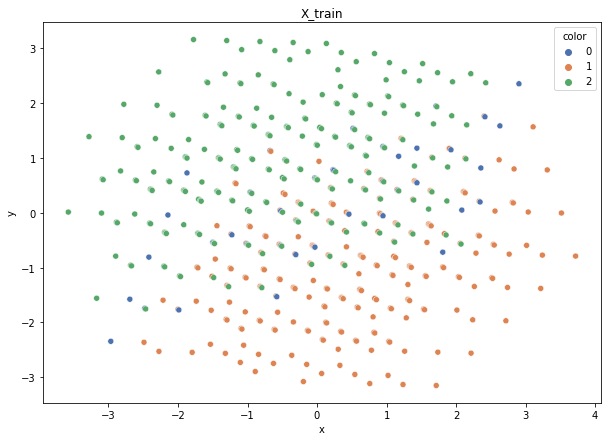

Class cardinalities: Counter({1: 231, 2: 230, 0: 39})
Weights: {0: 0.7471628063958148, 2: 0.1266928236932034, 1: 0.12614436991098174}


100%|██████████| 125/125 [00:00<00:00, 3431.05it/s]


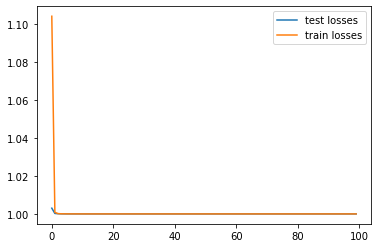

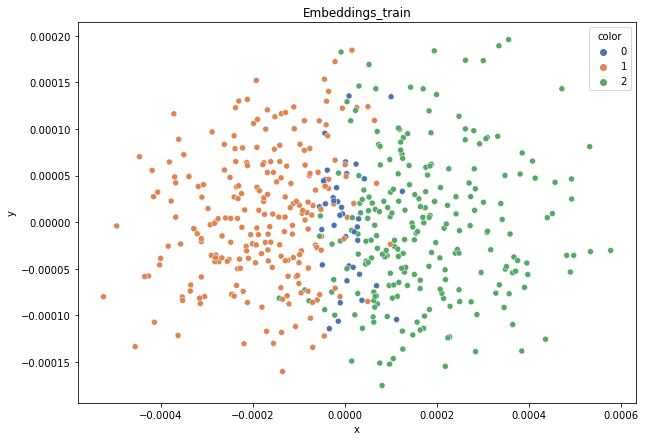

DT-f1-new-features: 0.654
DT-f1-old+new-features: 0.649
DT-f1-old-features: 0.568
DT-gmean-new-features: 0.593
DT-gmean-old+new-features: 0.533
DT-gmean-old-features: 0.088
KNN-f1-new-features: 0.688
KNN-f1-old+new-features: 0.566
KNN-f1-old-features: 0.568
KNN-gmean-new-features: 0.694
KNN-gmean-old+new-features: 0.09
KNN-gmean-old-features: 0.09
LDA-f1-new-features: 0.578
LDA-f1-old+new-features: 0.614
LDA-f1-old-features: 0.617
LDA-gmean-new-features: 0.094
LDA-gmean-old+new-features: 0.097
LDA-gmean-old-features: 0.098
QDA-f1-new-features: 0.659
QDA-f1-old+new-features: 0.82
QDA-f1-old-features: 0.936
QDA-gmean-new-features: 0.54
QDA-gmean-old+new-features: 0.789
QDA-gmean-old-features: 0.971
RF24-f1-new-features: 0.682
RF24-f1-old+new-features: 0.591
RF24-f1-old-features: 0.585
RF24-gmean-new-features: 0.55
RF24-gmean-old+new-features: 0.094
RF24-gmean-old-features: 0.092


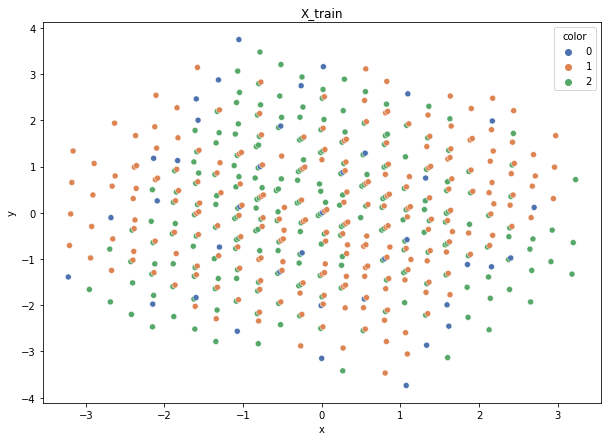

Class cardinalities: Counter({1: 231, 2: 230, 0: 39})
Weights: {0: 0.7471628063958148, 2: 0.1266928236932034, 1: 0.12614436991098174}


100%|██████████| 125/125 [00:00<00:00, 3229.77it/s]


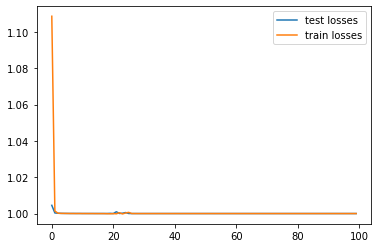

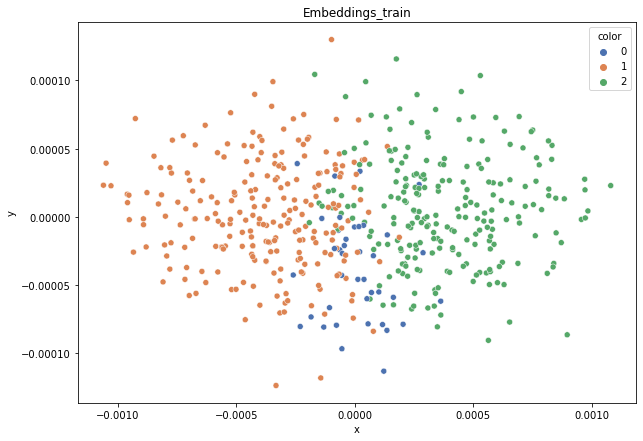

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


DT-f1-new-features: 0.601
DT-f1-old+new-features: 0.601
DT-f1-old-features: 0.638
DT-gmean-new-features: 0.417
DT-gmean-old+new-features: 0.417
DT-gmean-old-features: 0.585
KNN-f1-new-features: 0.556
KNN-f1-old+new-features: 0.563
KNN-f1-old-features: 0.545
KNN-gmean-new-features: 0.089
KNN-gmean-old+new-features: 0.09
KNN-gmean-old-features: 0.088
LDA-f1-new-features: 0.629
LDA-f1-old+new-features: 0.646
LDA-f1-old-features: 0.601
LDA-gmean-new-features: 0.431
LDA-gmean-old+new-features: 0.44
LDA-gmean-old-features: 0.096
QDA-f1-new-features: 0.612
QDA-f1-old+new-features: 0.701
QDA-f1-old-features: 0.845
QDA-gmean-new-features: 0.423
QDA-gmean-old+new-features: 0.613
QDA-gmean-old-features: 0.908
RF24-f1-new-features: 0.613
RF24-f1-old+new-features: 0.663
RF24-f1-old-features: 0.591
RF24-gmean-new-features: 0.423
RF24-gmean-old+new-features: 0.54
RF24-gmean-old-features: 0.092


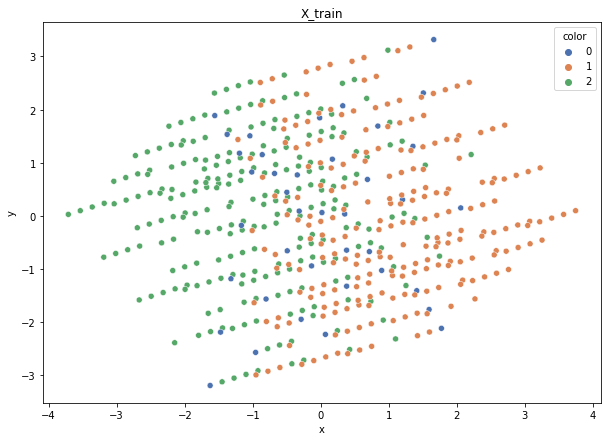

Class cardinalities: Counter({2: 231, 1: 230, 0: 39})
Weights: {2: 0.12614436991098174, 1: 0.1266928236932034, 0: 0.7471628063958148}


100%|██████████| 125/125 [00:00<00:00, 3418.14it/s]


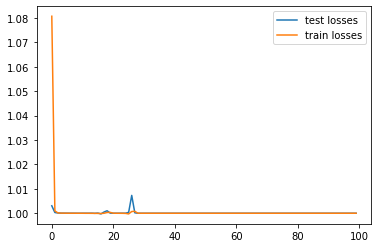

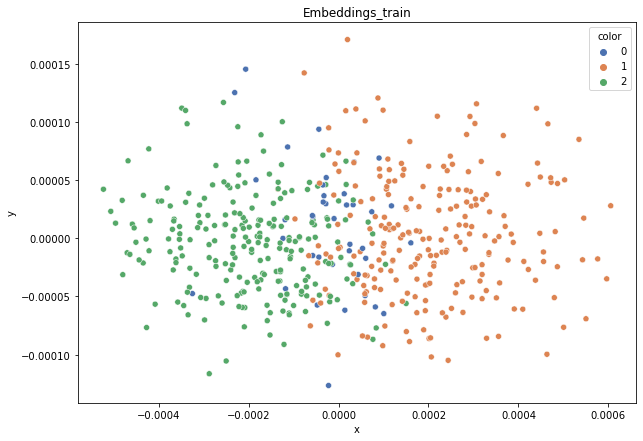

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


DT-f1-new-features: 0.611
DT-f1-old+new-features: 0.604
DT-f1-old-features: 0.655
DT-gmean-new-features: 0.565
DT-gmean-old+new-features: 0.56
DT-gmean-old-features: 0.597
KNN-f1-new-features: 0.601
KNN-f1-old+new-features: 0.577
KNN-f1-old-features: 0.566
KNN-gmean-new-features: 0.417
KNN-gmean-old+new-features: 0.091
KNN-gmean-old-features: 0.09
LDA-f1-new-features: 0.65
LDA-f1-old+new-features: 0.642
LDA-f1-old-features: 0.6
LDA-gmean-new-features: 0.529
LDA-gmean-old+new-features: 0.525
LDA-gmean-old-features: 0.096
QDA-f1-new-features: 0.661
QDA-f1-old+new-features: 0.742
QDA-f1-old-features: 0.836
QDA-gmean-new-features: 0.589
QDA-gmean-old+new-features: 0.675
QDA-gmean-old-features: 0.923
RF24-f1-new-features: 0.555
RF24-f1-old+new-features: 0.562
RF24-f1-old-features: 0.602
RF24-gmean-new-features: 0.09
RF24-gmean-old+new-features: 0.09
RF24-gmean-old-features: 0.093


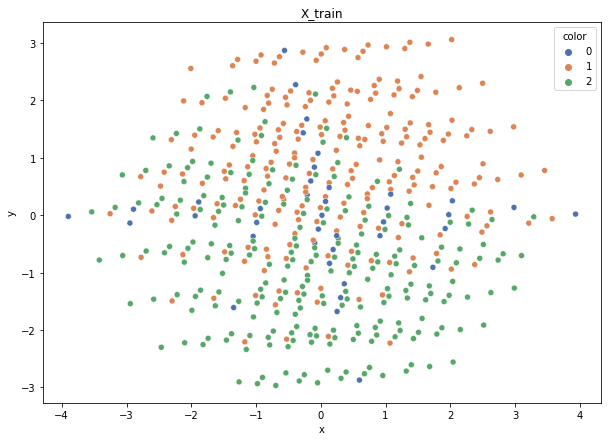

Class cardinalities: Counter({2: 231, 1: 230, 0: 39})
Weights: {0: 0.7471628063958148, 2: 0.12614436991098174, 1: 0.1266928236932034}


100%|██████████| 125/125 [00:00<00:00, 3367.62it/s]


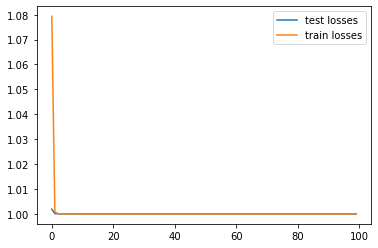

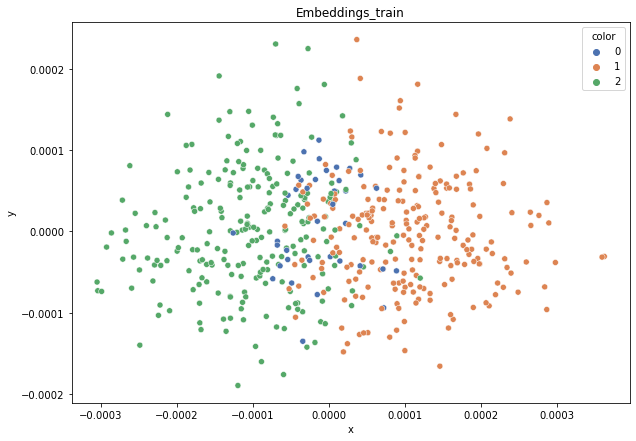

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


DT-f1-new-features: 0.606
DT-f1-old+new-features: 0.604
DT-f1-old-features: 0.582
DT-gmean-new-features: 0.564
DT-gmean-old+new-features: 0.602
DT-gmean-old-features: 0.397
KNN-f1-new-features: 0.593
KNN-f1-old+new-features: 0.569
KNN-f1-old-features: 0.562
KNN-gmean-new-features: 0.5
KNN-gmean-old+new-features: 0.089
KNN-gmean-old-features: 0.089
LDA-f1-new-features: 0.578
LDA-f1-old+new-features: 0.67
LDA-f1-old-features: 0.6
LDA-gmean-new-features: 0.093
LDA-gmean-old+new-features: 0.451
LDA-gmean-old-features: 0.096
QDA-f1-new-features: 0.685
QDA-f1-old+new-features: 0.786
QDA-f1-old-features: 0.809
QDA-gmean-new-features: 0.609
QDA-gmean-old+new-features: 0.737
QDA-gmean-old-features: 0.862
RF24-f1-new-features: 0.585
RF24-f1-old+new-features: 0.58
RF24-f1-old-features: 0.603
RF24-gmean-new-features: 0.094
RF24-gmean-old+new-features: 0.093
RF24-gmean-old-features: 0.094


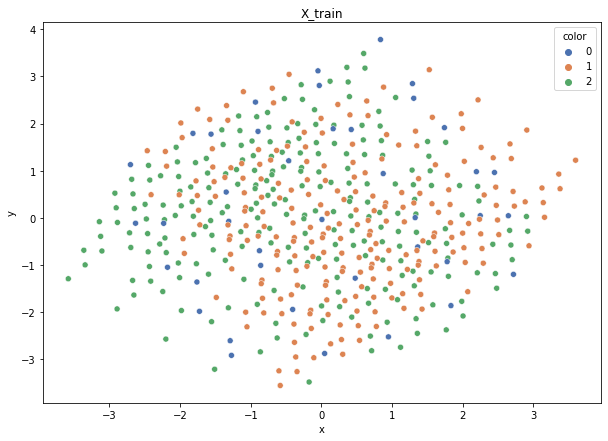

Class cardinalities: Counter({2: 230, 1: 230, 0: 40})
Weights: {0: 0.7419354838709677, 2: 0.12903225806451613, 1: 0.12903225806451613}


100%|██████████| 125/125 [00:00<00:00, 3418.05it/s]


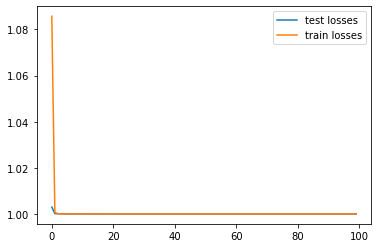

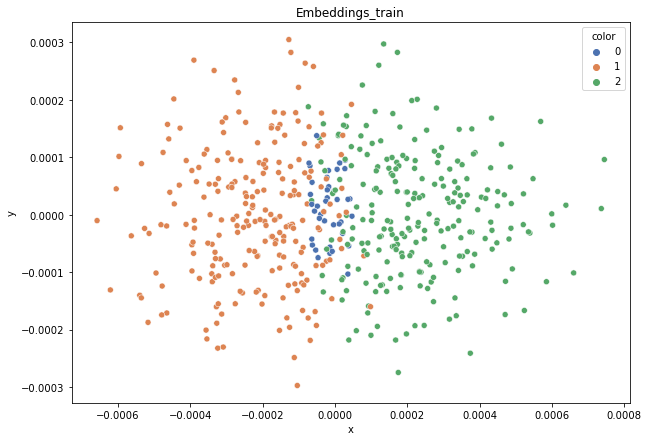

DT-f1-new-features: 0.651
DT-f1-old+new-features: 0.623
DT-f1-old-features: 0.582
DT-gmean-new-features: 0.552
DT-gmean-old+new-features: 0.441
DT-gmean-old-features: 0.415
KNN-f1-new-features: 0.629
KNN-f1-old+new-features: 0.58
KNN-f1-old-features: 0.563
KNN-gmean-new-features: 0.444
KNN-gmean-old+new-features: 0.091
KNN-gmean-old-features: 0.089
LDA-f1-new-features: 0.617
LDA-f1-old+new-features: 0.62
LDA-f1-old-features: 0.62
LDA-gmean-new-features: 0.097
LDA-gmean-old+new-features: 0.098
LDA-gmean-old-features: 0.098
QDA-f1-new-features: 0.646
QDA-f1-old+new-features: 0.693
QDA-f1-old-features: 0.859
QDA-gmean-new-features: 0.453
QDA-gmean-old+new-features: 0.567
QDA-gmean-old-features: 0.917
RF24-f1-new-features: 0.613
RF24-f1-old+new-features: 0.727
RF24-f1-old-features: 0.587
RF24-gmean-new-features: 0.096
RF24-gmean-old+new-features: 0.588
RF24-gmean-old-features: 0.091
cleveland


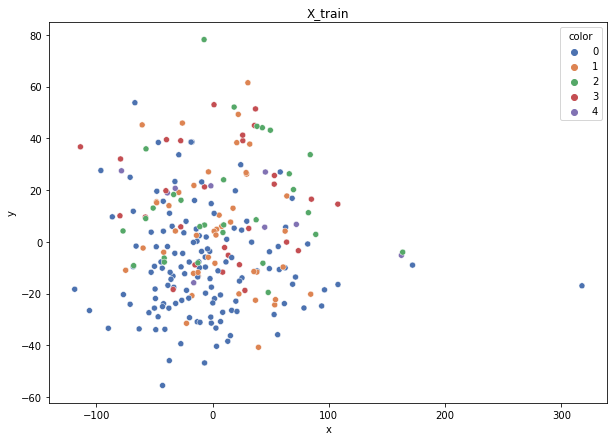

Class cardinalities: Counter({0: 131, 1: 44, 2: 29, 3: 28, 4: 10})
Weights: {0: 0.03806176471590889, 2: 0.1719341785442781, 1: 0.11332025404054694, 3: 0.17807468492085946, 4: 0.4986091177784065}


100%|██████████| 61/61 [00:00<00:00, 3177.82it/s]


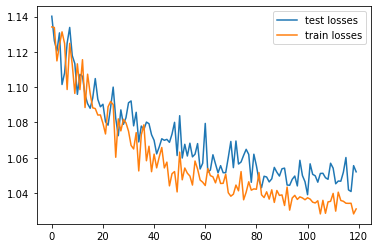

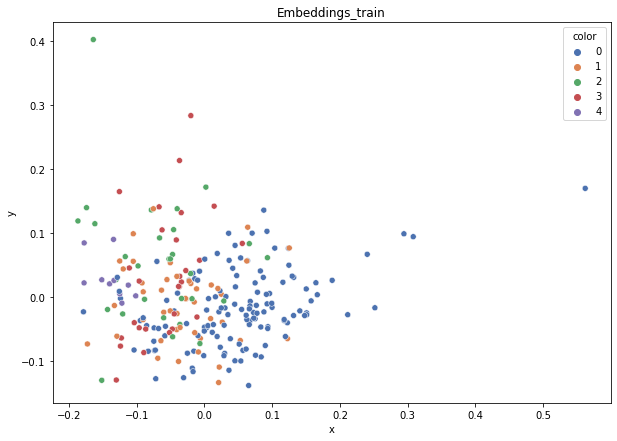

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


DT-f1-new-features: 0.25
DT-f1-old+new-features: 0.247
DT-f1-old-features: 0.266
DT-gmean-new-features: 0.085
DT-gmean-old+new-features: 0.082
DT-gmean-old-features: 0.098
KNN-f1-new-features: 0.263
KNN-f1-old+new-features: 0.275
KNN-f1-old-features: 0.275
KNN-gmean-new-features: 0.084
KNN-gmean-old+new-features: 0.089
KNN-gmean-old-features: 0.089
LDA-f1-new-features: 0.333
LDA-f1-old+new-features: 0.356
LDA-f1-old-features: 0.365
LDA-gmean-new-features: 0.1
LDA-gmean-old+new-features: 0.106
LDA-gmean-old-features: 0.111
QDA-f1-new-features: 0.325
QDA-f1-old+new-features: 0.214
QDA-f1-old-features: 0.392
QDA-gmean-new-features: 0.042
QDA-gmean-old+new-features: 0.012
QDA-gmean-old-features: 0.132
RF24-f1-new-features: 0.275
RF24-f1-old+new-features: 0.341
RF24-f1-old-features: 0.316
RF24-gmean-new-features: 0.08
RF24-gmean-old+new-features: 0.101
RF24-gmean-old-features: 0.092


/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


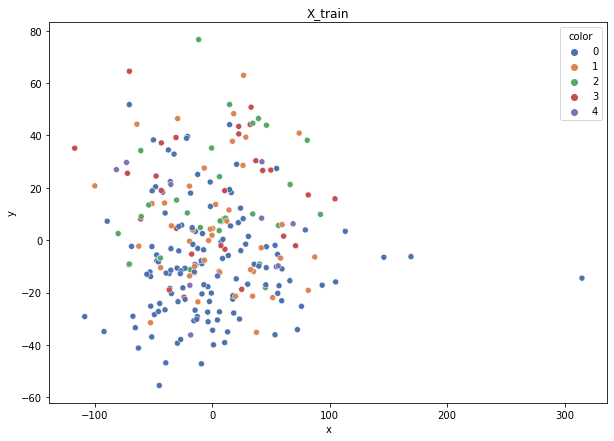

Class cardinalities: Counter({0: 131, 1: 44, 2: 29, 3: 28, 4: 10})
Weights: {0: 0.03806176471590889, 2: 0.1719341785442781, 1: 0.11332025404054694, 3: 0.17807468492085946, 4: 0.4986091177784065}


100%|██████████| 61/61 [00:00<00:00, 3250.70it/s]


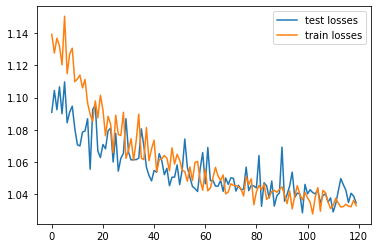

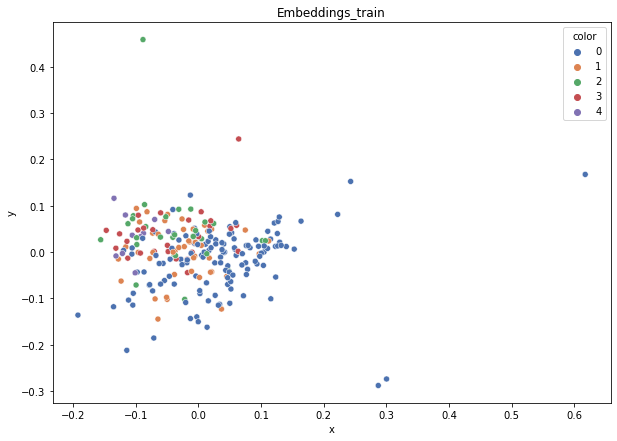

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


DT-f1-new-features: 0.401
DT-f1-old+new-features: 0.203
DT-f1-old-features: 0.281
DT-gmean-new-features: 0.382
DT-gmean-old+new-features: 0.03
DT-gmean-old-features: 0.101
KNN-f1-new-features: 0.338
KNN-f1-old+new-features: 0.356
KNN-f1-old-features: 0.356
KNN-gmean-new-features: 0.126
KNN-gmean-old+new-features: 0.122
KNN-gmean-old-features: 0.122
LDA-f1-new-features: 0.401
LDA-f1-old+new-features: 0.409
LDA-f1-old-features: 0.355
LDA-gmean-new-features: 0.322
LDA-gmean-old+new-features: 0.342
LDA-gmean-old-features: 0.108
QDA-f1-new-features: 0.33
QDA-f1-old+new-features: 0.192
QDA-f1-old-features: 0.39
QDA-gmean-new-features: 0.105
QDA-gmean-old+new-features: 0.011
QDA-gmean-old-features: 0.136
RF24-f1-new-features: 0.288
RF24-f1-old+new-features: 0.326
RF24-f1-old-features: 0.307
RF24-gmean-new-features: 0.091
RF24-gmean-old+new-features: 0.1
RF24-gmean-old-features: 0.093


/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


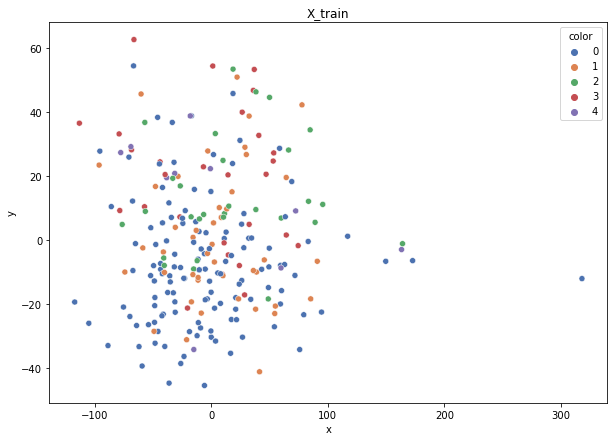

Class cardinalities: Counter({0: 131, 1: 44, 2: 29, 3: 28, 4: 10})
Weights: {0: 0.03806176471590889, 3: 0.17807468492085946, 1: 0.11332025404054694, 2: 0.1719341785442781, 4: 0.4986091177784065}


100%|██████████| 61/61 [00:00<00:00, 3071.16it/s]


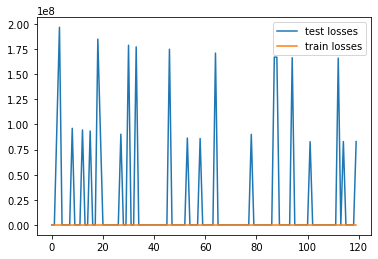

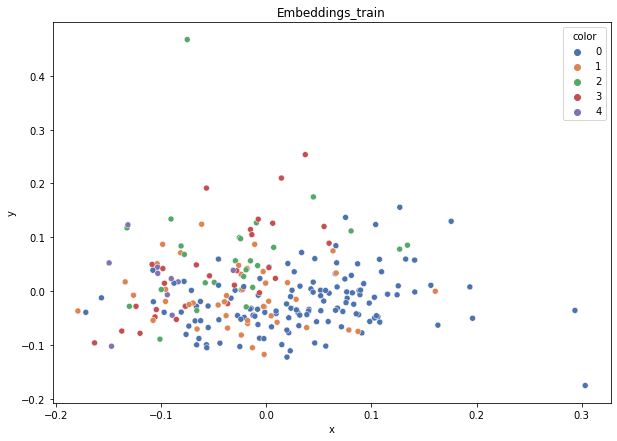

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


DT-f1-new-features: 0.303
DT-f1-old+new-features: 0.2
DT-f1-old-features: 0.368
DT-gmean-new-features: 0.114
DT-gmean-old+new-features: 0.029
DT-gmean-old-features: 0.128
KNN-f1-new-features: 0.264
KNN-f1-old+new-features: 0.325
KNN-f1-old-features: 0.325
KNN-gmean-new-features: 0.035
KNN-gmean-old+new-features: 0.109
KNN-gmean-old-features: 0.109
LDA-f1-new-features: 0.345
LDA-f1-old+new-features: 0.299
LDA-f1-old-features: 0.261
LDA-gmean-new-features: 0.257
LDA-gmean-old+new-features: 0.219
LDA-gmean-old-features: 0.034
QDA-f1-new-features: 0.357
QDA-f1-old+new-features: 0.208
QDA-f1-old-features: 0.345
QDA-gmean-new-features: 0.114
QDA-gmean-old+new-features: 0.012
QDA-gmean-old-features: 0.12
RF24-f1-new-features: 0.234
RF24-f1-old+new-features: 0.294
RF24-f1-old-features: 0.315
RF24-gmean-new-features: 0.069
RF24-gmean-old+new-features: 0.086
RF24-gmean-old-features: 0.1


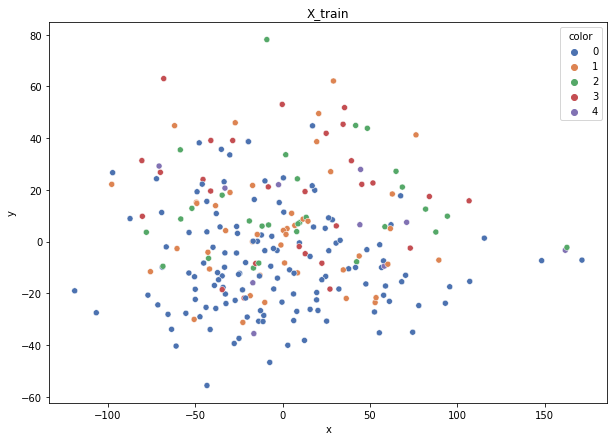

Class cardinalities: Counter({0: 131, 1: 44, 2: 29, 3: 28, 4: 11})
Weights: {0: 0.03986894846317969, 2: 0.18009766374746689, 1: 0.11870073292446681, 3: 0.18652972316701927, 4: 0.47480293169786725}


100%|██████████| 60/60 [00:00<00:00, 3296.63it/s]


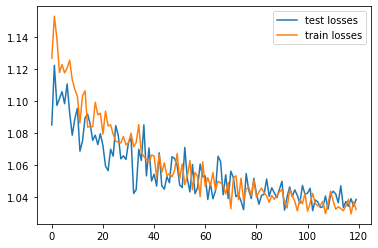

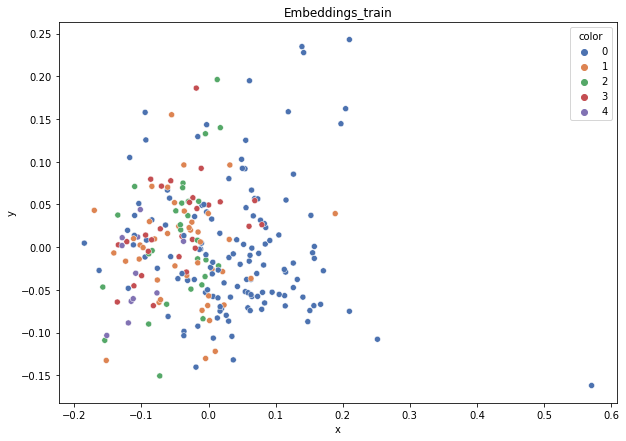

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


DT-f1-new-features: 0.3
DT-f1-old+new-features: 0.218
DT-f1-old-features: 0.305
DT-gmean-new-features: 0.101
DT-gmean-old+new-features: 0.03
DT-gmean-old-features: 0.112
KNN-f1-new-features: 0.233
KNN-f1-old+new-features: 0.254
KNN-f1-old-features: 0.254
KNN-gmean-new-features: 0.033
KNN-gmean-old+new-features: 0.036
KNN-gmean-old-features: 0.036
LDA-f1-new-features: 0.259
LDA-f1-old+new-features: 0.248
LDA-f1-old-features: 0.287
LDA-gmean-new-features: 0.034
LDA-gmean-old+new-features: 0.07
LDA-gmean-old-features: 0.086
QDA-f1-new-features: 0.285
QDA-f1-old+new-features: 0.171
QDA-f1-old-features: 0.254
QDA-gmean-new-features: 0.081
QDA-gmean-old+new-features: 0.01
QDA-gmean-old-features: 0.032
RF24-f1-new-features: 0.29
RF24-f1-old+new-features: 0.311
RF24-f1-old-features: 0.309
RF24-gmean-new-features: 0.081
RF24-gmean-old+new-features: 0.092
RF24-gmean-old-features: 0.098


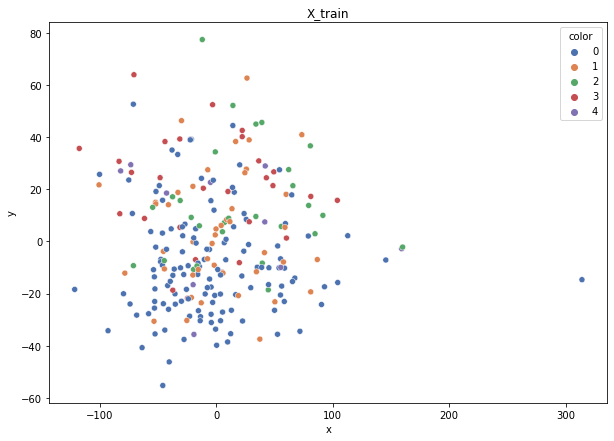

Class cardinalities: Counter({0: 132, 1: 44, 2: 28, 3: 28, 4: 11})
Weights: {2: 0.18539325842696627, 1: 0.11797752808988764, 0: 0.03932584269662921, 3: 0.18539325842696627, 4: 0.47191011235955055}


100%|██████████| 60/60 [00:00<00:00, 3169.78it/s]


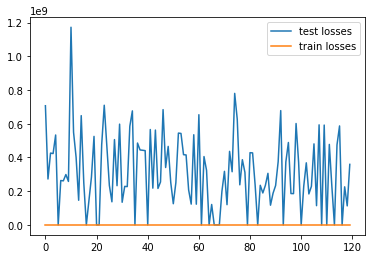

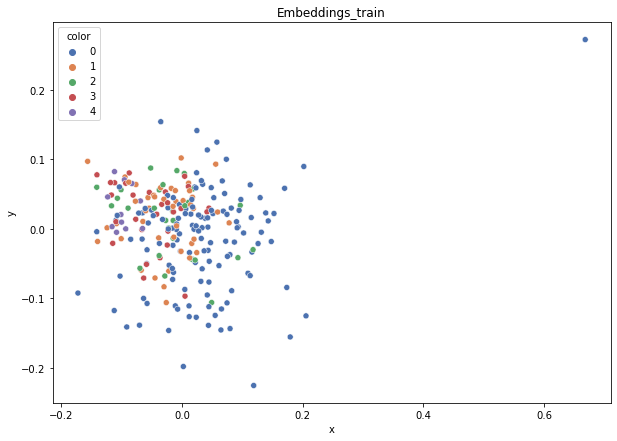

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


DT-f1-new-features: 0.264
DT-f1-old+new-features: 0.382
DT-f1-old-features: 0.227
DT-gmean-new-features: 0.084
DT-gmean-old+new-features: 0.134
DT-gmean-old-features: 0.03
KNN-f1-new-features: 0.348
KNN-f1-old+new-features: 0.304
KNN-f1-old-features: 0.275
KNN-gmean-new-features: 0.11
KNN-gmean-old+new-features: 0.04
KNN-gmean-old-features: 0.035
LDA-f1-new-features: 0.273
LDA-f1-old+new-features: 0.341
LDA-f1-old-features: 0.415
LDA-gmean-new-features: 0.088
LDA-gmean-old+new-features: 0.11
LDA-gmean-old-features: 0.363
QDA-f1-new-features: 0.293
QDA-f1-old+new-features: 0.168
QDA-f1-old-features: 0.268
QDA-gmean-new-features: 0.089
QDA-gmean-old+new-features: 0.01
QDA-gmean-old-features: 0.037
RF24-f1-new-features: 0.313
RF24-f1-old+new-features: 0.274
RF24-f1-old-features: 0.497
RF24-gmean-new-features: 0.098
RF24-gmean-old+new-features: 0.036
RF24-gmean-old-features: 0.452
cleveland_v2


/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


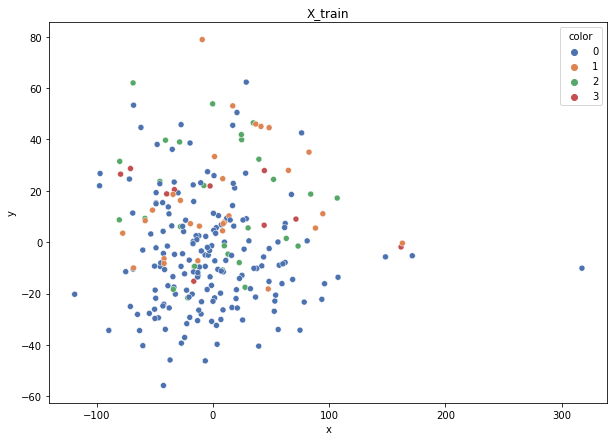

Class cardinalities: Counter({0: 175, 1: 29, 2: 28, 3: 10})
Weights: {0: 0.032483898067768135, 1: 0.19602352282273874, 2: 0.20302436292355083, 3: 0.5684682161859423}


100%|██████████| 61/61 [00:00<00:00, 3106.02it/s]


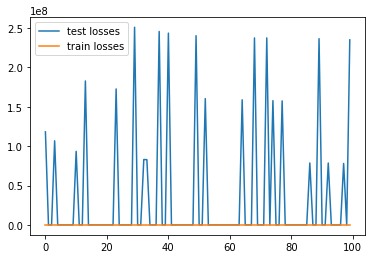

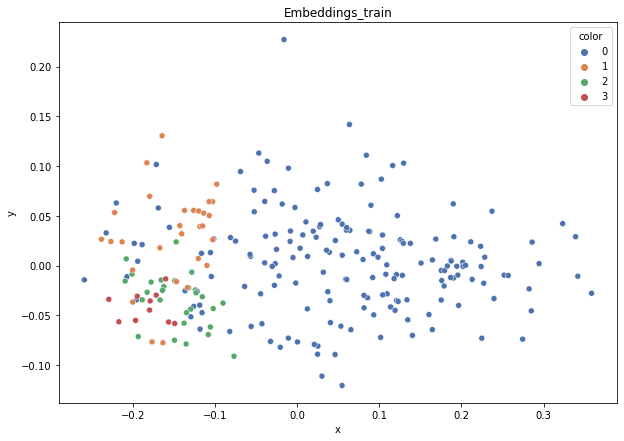

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


DT-f1-new-features: 0.422
DT-f1-old+new-features: 0.461
DT-f1-old-features: 0.358
DT-gmean-new-features: 0.109
DT-gmean-old+new-features: 0.116
DT-gmean-old-features: 0.099
KNN-f1-new-features: 0.401
KNN-f1-old+new-features: 0.238
KNN-f1-old-features: 0.238
KNN-gmean-new-features: 0.323
KNN-gmean-old+new-features: 0.018
KNN-gmean-old-features: 0.018
LDA-f1-new-features: 0.371
LDA-f1-old+new-features: 0.462
LDA-f1-old-features: 0.376
LDA-gmean-new-features: 0.086
LDA-gmean-old+new-features: 0.367
LDA-gmean-old-features: 0.028
QDA-f1-new-features: 0.354
QDA-f1-old+new-features: 0.21
QDA-f1-old-features: 0.394
QDA-gmean-new-features: 0.079
QDA-gmean-old+new-features: 0.006
QDA-gmean-old-features: 0.093
RF24-f1-new-features: 0.423
RF24-f1-old+new-features: 0.342
RF24-f1-old-features: 0.459
RF24-gmean-new-features: 0.114
RF24-gmean-old+new-features: 0.028
RF24-gmean-old-features: 0.121


/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


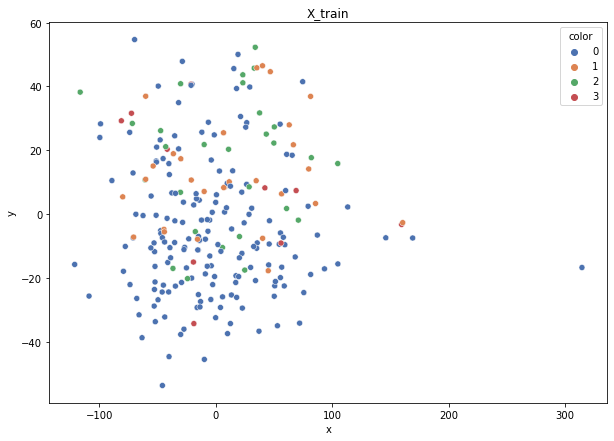

Class cardinalities: Counter({0: 175, 1: 29, 2: 28, 3: 10})
Weights: {0: 0.032483898067768135, 1: 0.19602352282273874, 2: 0.20302436292355083, 3: 0.5684682161859423}


100%|██████████| 61/61 [00:00<00:00, 3227.12it/s]


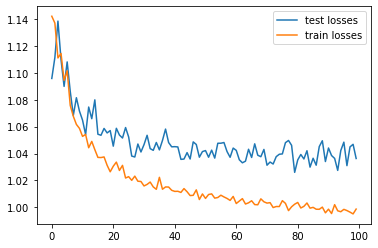

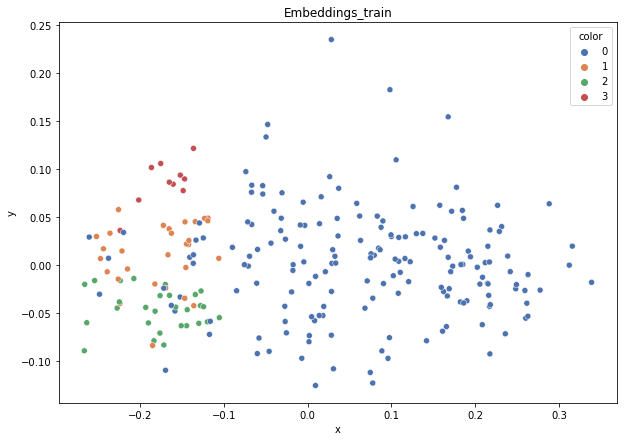

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


DT-f1-new-features: 0.349
DT-f1-old+new-features: 0.359
DT-f1-old-features: 0.484
DT-gmean-new-features: 0.09
DT-gmean-old+new-features: 0.09
DT-gmean-old-features: 0.546
KNN-f1-new-features: 0.395
KNN-f1-old+new-features: 0.39
KNN-f1-old-features: 0.39
KNN-gmean-new-features: 0.329
KNN-gmean-old+new-features: 0.11
KNN-gmean-old-features: 0.11
LDA-f1-new-features: 0.38
LDA-f1-old+new-features: 0.454
LDA-f1-old-features: 0.344
LDA-gmean-new-features: 0.323
LDA-gmean-old+new-features: 0.421
LDA-gmean-old-features: 0.085
QDA-f1-new-features: 0.294
QDA-f1-old+new-features: 0.21
QDA-f1-old-features: 0.399
QDA-gmean-new-features: 0.065
QDA-gmean-old+new-features: 0.006
QDA-gmean-old-features: 0.11
RF24-f1-new-features: 0.311
RF24-f1-old+new-features: 0.31
RF24-f1-old-features: 0.346
RF24-gmean-new-features: 0.077
RF24-gmean-old+new-features: 0.076
RF24-gmean-old-features: 0.085


/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


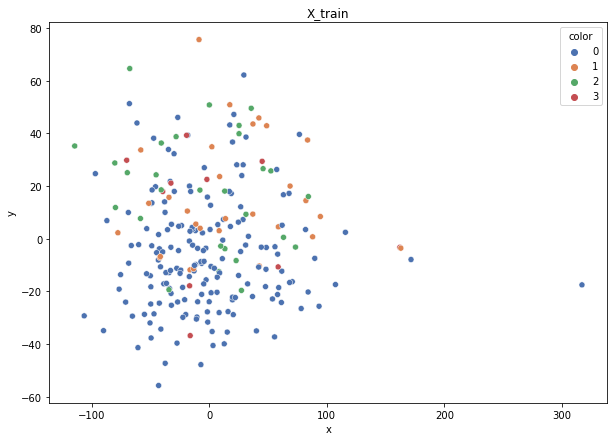

Class cardinalities: Counter({0: 175, 1: 29, 2: 28, 3: 10})
Weights: {0: 0.032483898067768135, 1: 0.19602352282273874, 2: 0.20302436292355083, 3: 0.5684682161859423}


100%|██████████| 61/61 [00:00<00:00, 3202.04it/s]


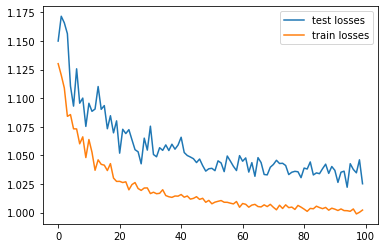

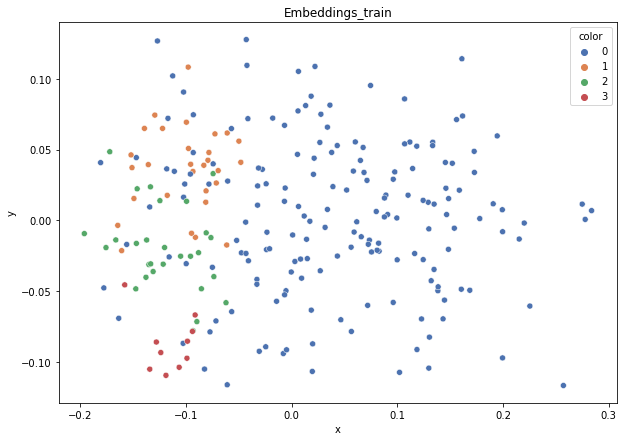

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


DT-f1-new-features: 0.302
DT-f1-old+new-features: 0.298
DT-f1-old-features: 0.295
DT-gmean-new-features: 0.022
DT-gmean-old+new-features: 0.022
DT-gmean-old-features: 0.075
KNN-f1-new-features: 0.345
KNN-f1-old+new-features: 0.356
KNN-f1-old-features: 0.356
KNN-gmean-new-features: 0.079
KNN-gmean-old+new-features: 0.079
KNN-gmean-old-features: 0.079
LDA-f1-new-features: 0.332
LDA-f1-old+new-features: 0.348
LDA-f1-old-features: 0.377
LDA-gmean-new-features: 0.078
LDA-gmean-old+new-features: 0.079
LDA-gmean-old-features: 0.098
QDA-f1-new-features: 0.31
QDA-f1-old+new-features: 0.21
QDA-f1-old-features: 0.351
QDA-gmean-new-features: 0.066
QDA-gmean-old+new-features: 0.006
QDA-gmean-old-features: 0.079
RF24-f1-new-features: 0.335
RF24-f1-old+new-features: 0.337
RF24-f1-old-features: 0.257
RF24-gmean-new-features: 0.025
RF24-gmean-old+new-features: 0.025
RF24-gmean-old-features: 0.019


/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


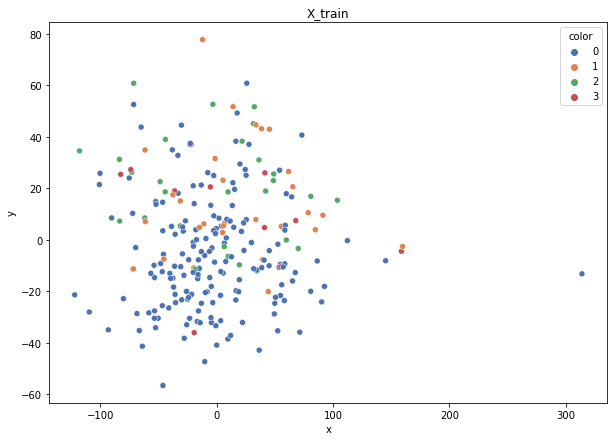

Class cardinalities: Counter({0: 175, 1: 29, 2: 28, 3: 11})
Weights: {1: 0.20670586024536255, 0: 0.03425411398351722, 2: 0.21408821239698264, 3: 0.5449518133741377}


100%|██████████| 60/60 [00:00<00:00, 3266.34it/s]


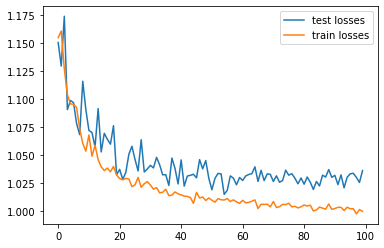

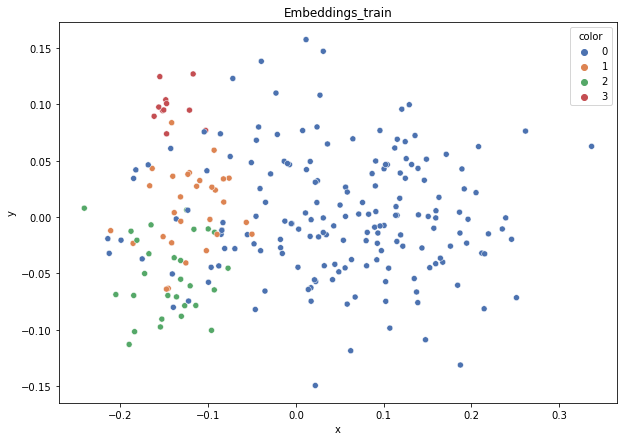

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


DT-f1-new-features: 0.455
DT-f1-old+new-features: 0.395
DT-f1-old-features: 0.238
DT-gmean-new-features: 0.121
DT-gmean-old+new-features: 0.101
DT-gmean-old-features: 0.018
KNN-f1-new-features: 0.34
KNN-f1-old+new-features: 0.283
KNN-f1-old-features: 0.283
KNN-gmean-new-features: 0.025
KNN-gmean-old+new-features: 0.022
KNN-gmean-old-features: 0.022
LDA-f1-new-features: 0.344
LDA-f1-old+new-features: 0.3
LDA-f1-old-features: 0.301
LDA-gmean-new-features: 0.079
LDA-gmean-old+new-features: 0.023
LDA-gmean-old-features: 0.023
QDA-f1-new-features: 0.273
QDA-f1-old+new-features: 0.212
QDA-f1-old-features: 0.413
QDA-gmean-new-features: 0.019
QDA-gmean-old+new-features: 0.006
QDA-gmean-old-features: 0.095
RF24-f1-new-features: 0.33
RF24-f1-old+new-features: 0.348
RF24-f1-old-features: 0.428
RF24-gmean-new-features: 0.078
RF24-gmean-old+new-features: 0.079
RF24-gmean-old-features: 0.104


/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


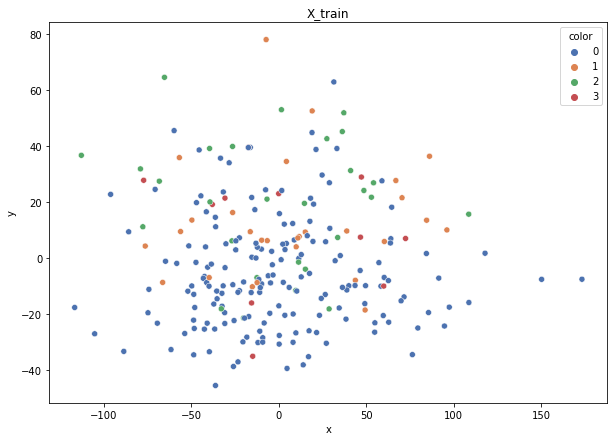

Class cardinalities: Counter({0: 176, 1: 28, 2: 28, 3: 11})
Weights: {0: 0.03381642512077295, 1: 0.21256038647342995, 2: 0.21256038647342995, 3: 0.5410628019323672}


100%|██████████| 60/60 [00:00<00:00, 3252.95it/s]


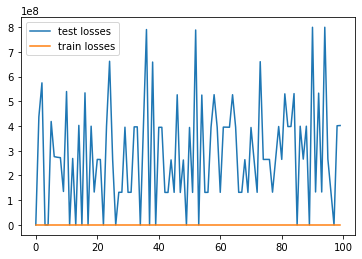

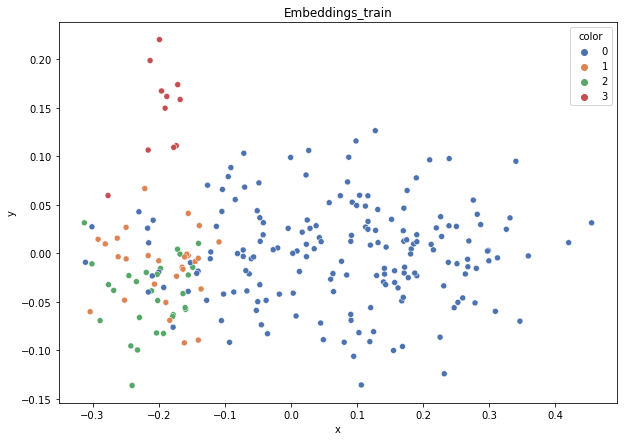

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


DT-f1-new-features: 0.254
DT-f1-old+new-features: 0.326
DT-f1-old-features: 0.335
DT-gmean-new-features: 0.021
DT-gmean-old+new-features: 0.081
DT-gmean-old-features: 0.092
KNN-f1-new-features: 0.34
KNN-f1-old+new-features: 0.37
KNN-f1-old-features: 0.37
KNN-gmean-new-features: 0.081
KNN-gmean-old+new-features: 0.096
KNN-gmean-old-features: 0.096
LDA-f1-new-features: 0.349
LDA-f1-old+new-features: 0.403
LDA-f1-old-features: 0.467
LDA-gmean-new-features: 0.101
LDA-gmean-old+new-features: 0.384
LDA-gmean-old-features: 0.463
QDA-f1-new-features: 0.241
QDA-f1-old+new-features: 0.209
QDA-f1-old-features: 0.301
QDA-gmean-new-features: 0.018
QDA-gmean-old+new-features: 0.006
QDA-gmean-old-features: 0.074
RF24-f1-new-features: 0.246
RF24-f1-old+new-features: 0.278
RF24-f1-old-features: 0.29
RF24-gmean-new-features: 0.018
RF24-gmean-old+new-features: 0.062
RF24-gmean-old-features: 0.022
glass


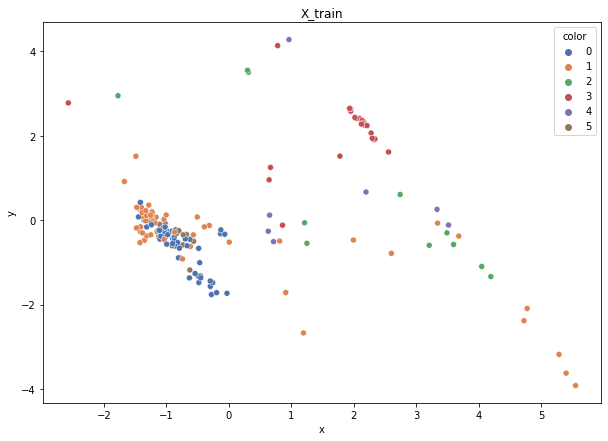

Class cardinalities: Counter({1: 61, 0: 56, 3: 23, 5: 13, 2: 11, 4: 7})
Weights: {0: 0.04597401674853029, 1: 0.042205654719962245, 3: 0.1119367364312042, 5: 0.1980419183013613, 2: 0.2340495398106997, 4: 0.36779213398824234}


100%|██████████| 43/43 [00:00<00:00, 3155.76it/s]


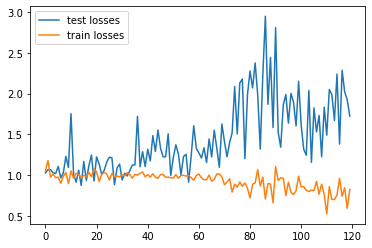

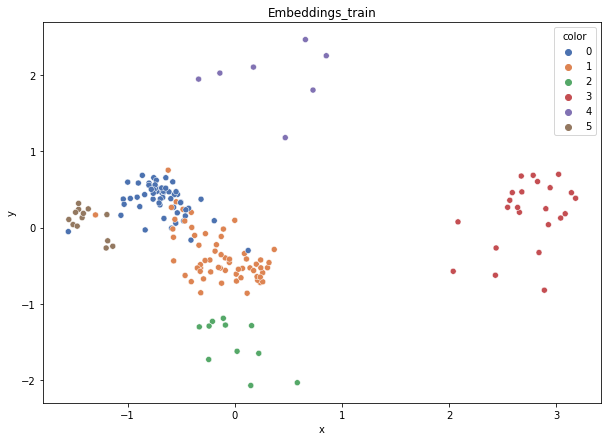

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


DT-f1-new-features: 0.633
DT-f1-old+new-features: 0.634
DT-f1-old-features: 0.711
DT-gmean-new-features: 0.242
DT-gmean-old+new-features: 0.237
DT-gmean-old-features: 0.742
KNN-f1-new-features: 0.562
KNN-f1-old+new-features: 0.685
KNN-f1-old-features: 0.747
KNN-gmean-new-features: 0.211
KNN-gmean-old+new-features: 0.656
KNN-gmean-old-features: 0.701
LDA-f1-new-features: 0.594
LDA-f1-old+new-features: 0.682
LDA-f1-old-features: 0.551
LDA-gmean-new-features: 0.222
LDA-gmean-old+new-features: 0.61
LDA-gmean-old-features: 0.088
QDA-f1-new-features: 0.388
QDA-f1-old+new-features: 0.315
QDA-f1-old-features: 0.388
QDA-gmean-new-features: 0.029
QDA-gmean-old+new-features: 0.025
QDA-gmean-old-features: 0.065
RF24-f1-new-features: 0.576
RF24-f1-old+new-features: 0.575
RF24-f1-old-features: 0.786
RF24-gmean-new-features: 0.219
RF24-gmean-old+new-features: 0.219
RF24-gmean-old-features: 0.742


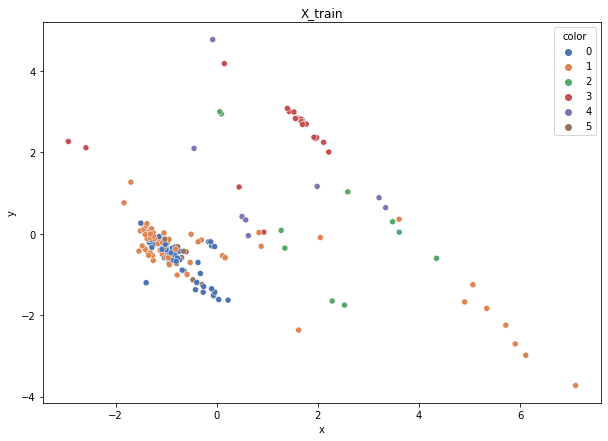

Class cardinalities: Counter({1: 60, 0: 56, 3: 24, 5: 13, 2: 10, 4: 8})
Weights: {5: 0.2034390893678857, 4: 0.33058852022281426, 1: 0.0440784693630419, 0: 0.047226931460402036, 3: 0.11019617340760475, 2: 0.2644708161782514}


100%|██████████| 43/43 [00:00<00:00, 3212.71it/s]


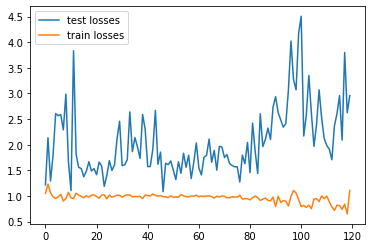

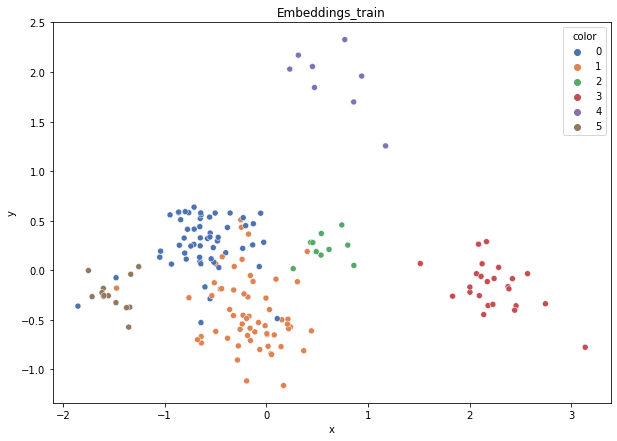

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


DT-f1-new-features: 0.414
DT-f1-old+new-features: 0.537
DT-f1-old-features: 0.53
DT-gmean-new-features: 0.084
DT-gmean-old+new-features: 0.224
DT-gmean-old-features: 0.232
KNN-f1-new-features: 0.704
KNN-f1-old+new-features: 0.663
KNN-f1-old-features: 0.568
KNN-gmean-new-features: 0.673
KNN-gmean-old+new-features: 0.654
KNN-gmean-old-features: 0.557
LDA-f1-new-features: 0.658
LDA-f1-old+new-features: 0.703
LDA-f1-old-features: 0.425
LDA-gmean-new-features: 0.654
LDA-gmean-old+new-features: 0.673
LDA-gmean-old-features: 0.072
QDA-f1-new-features: 0.379
QDA-f1-old+new-features: 0.237
QDA-f1-old-features: 0.369
QDA-gmean-new-features: 0.029
QDA-gmean-old+new-features: 0.021
QDA-gmean-old-features: 0.06
RF24-f1-new-features: 0.507
RF24-f1-old+new-features: 0.574
RF24-f1-old-features: 0.652
RF24-gmean-new-features: 0.218
RF24-gmean-old+new-features: 0.235
RF24-gmean-old-features: 0.279


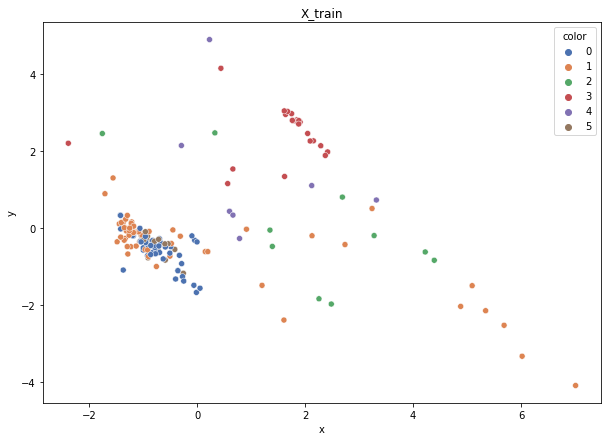

Class cardinalities: Counter({1: 61, 0: 56, 3: 23, 5: 14, 2: 10, 4: 7})
Weights: {0: 0.04555224384573926, 5: 0.18220897538295705, 4: 0.3644179507659141, 1: 0.04181845336658031, 3: 0.11090981110266952, 2: 0.2550925655361399}


100%|██████████| 43/43 [00:00<00:00, 3158.31it/s]


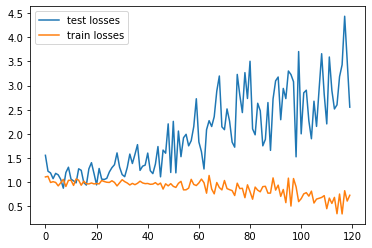

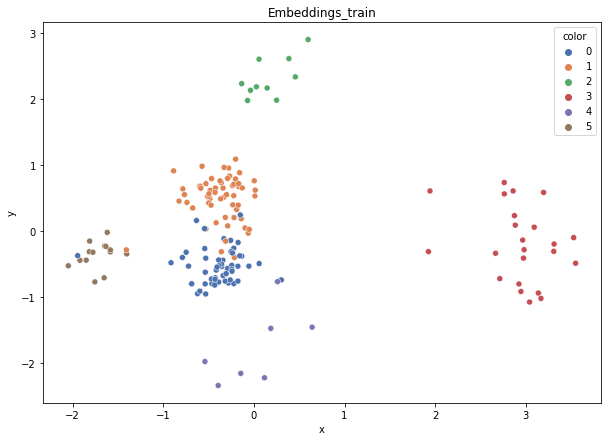

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


DT-f1-new-features: 0.681
DT-f1-old+new-features: 0.682
DT-f1-old-features: 0.607
DT-gmean-new-features: 0.621
DT-gmean-old+new-features: 0.623
DT-gmean-old-features: 0.25
KNN-f1-new-features: 0.664
KNN-f1-old+new-features: 0.707
KNN-f1-old-features: 0.661
KNN-gmean-new-features: 0.612
KNN-gmean-old+new-features: 0.632
KNN-gmean-old-features: 0.246
LDA-f1-new-features: 0.743
LDA-f1-old+new-features: 0.743
LDA-f1-old-features: 0.575
LDA-gmean-new-features: 0.697
LDA-gmean-old+new-features: 0.697
LDA-gmean-old-features: 0.233
QDA-f1-new-features: 0.334
QDA-f1-old+new-features: 0.333
QDA-f1-old-features: 0.587
QDA-gmean-new-features: 0.027
QDA-gmean-old+new-features: 0.026
QDA-gmean-old-features: 0.526
RF24-f1-new-features: 0.735
RF24-f1-old+new-features: 0.735
RF24-f1-old-features: 0.731
RF24-gmean-new-features: 0.697
RF24-gmean-old+new-features: 0.697
RF24-gmean-old-features: 0.281


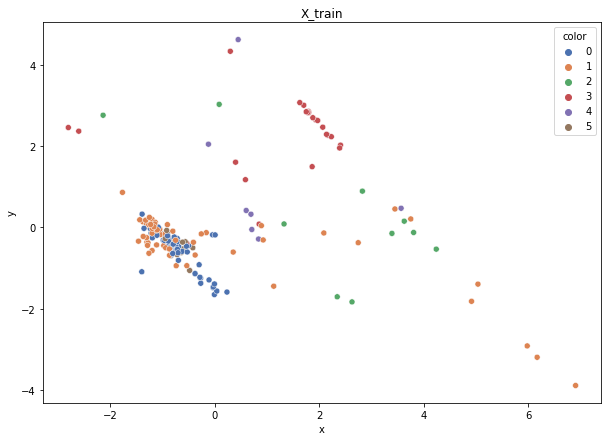

Class cardinalities: Counter({1: 61, 0: 56, 3: 23, 5: 14, 2: 10, 4: 7})
Weights: {0: 0.04555224384573926, 5: 0.18220897538295705, 4: 0.3644179507659141, 1: 0.04181845336658031, 3: 0.11090981110266952, 2: 0.2550925655361399}


100%|██████████| 43/43 [00:00<00:00, 3124.44it/s]


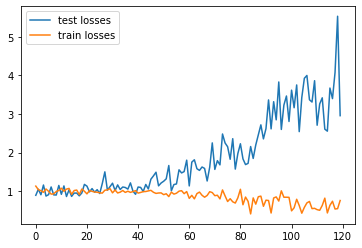

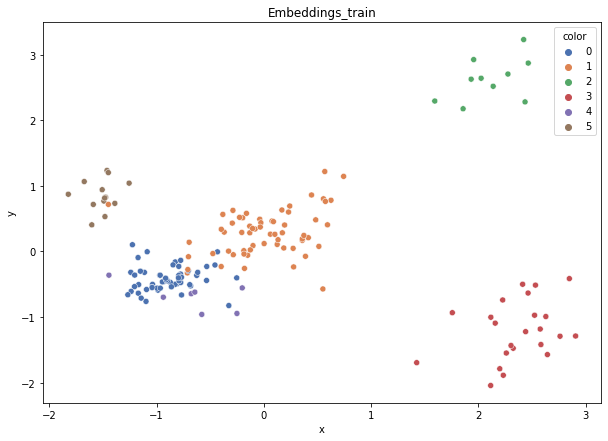

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


DT-f1-new-features: 0.473
DT-f1-old+new-features: 0.473
DT-f1-old-features: 0.646
DT-gmean-new-features: 0.187
DT-gmean-old+new-features: 0.187
DT-gmean-old-features: 0.681
KNN-f1-new-features: 0.644
KNN-f1-old+new-features: 0.69
KNN-f1-old-features: 0.641
KNN-gmean-new-features: 0.602
KNN-gmean-old+new-features: 0.642
KNN-gmean-old-features: 0.587
LDA-f1-new-features: 0.665
LDA-f1-old+new-features: 0.678
LDA-f1-old-features: 0.517
LDA-gmean-new-features: 0.632
LDA-gmean-old+new-features: 0.632
LDA-gmean-old-features: 0.196
QDA-f1-new-features: 0.453
QDA-f1-old+new-features: 0.329
QDA-f1-old-features: 0.571
QDA-gmean-new-features: 0.072
QDA-gmean-old+new-features: 0.026
QDA-gmean-old-features: 0.219
RF24-f1-new-features: 0.644
RF24-f1-old+new-features: 0.644
RF24-f1-old-features: 0.776
RF24-gmean-new-features: 0.59
RF24-gmean-old+new-features: 0.59
RF24-gmean-old-features: 0.748


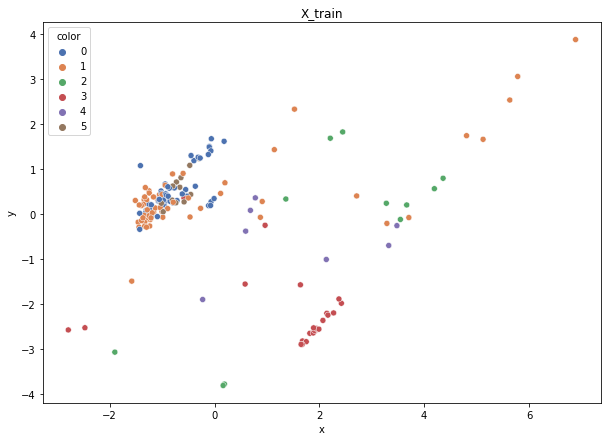

Class cardinalities: Counter({1: 61, 0: 56, 3: 23, 5: 14, 2: 11, 4: 7})
Weights: {0: 0.04663368999308034, 5: 0.18653475997232136, 4: 0.3730695199446427, 1: 0.04281125638709015, 3: 0.11354289737445648, 2: 0.237407876328409}


100%|██████████| 42/42 [00:00<00:00, 3162.56it/s]


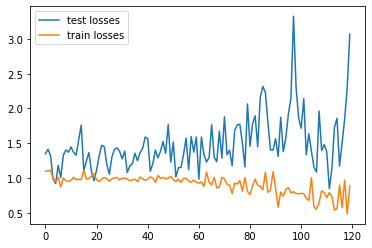

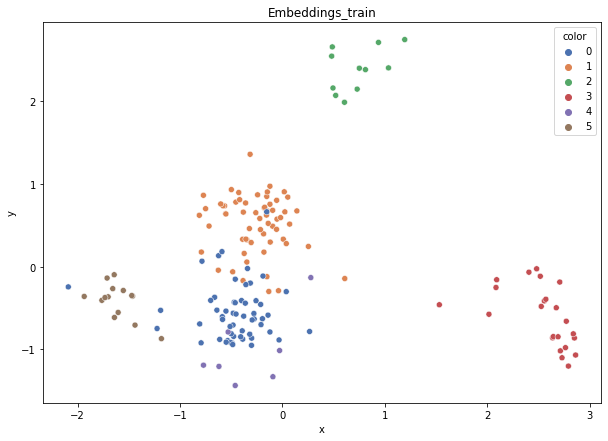

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


DT-f1-new-features: 0.727
DT-f1-old+new-features: 0.711
DT-f1-old-features: 0.73
DT-gmean-new-features: 0.713
DT-gmean-old+new-features: 0.693
DT-gmean-old-features: 0.737
KNN-f1-new-features: 0.78
KNN-f1-old+new-features: 0.749
KNN-f1-old-features: 0.678
KNN-gmean-new-features: 0.745
KNN-gmean-old+new-features: 0.72
KNN-gmean-old-features: 0.681
LDA-f1-new-features: 0.805
LDA-f1-old+new-features: 0.757
LDA-f1-old-features: 0.55
LDA-gmean-new-features: 0.8
LDA-gmean-old+new-features: 0.736
LDA-gmean-old-features: 0.222
QDA-f1-new-features: 0.374
QDA-f1-old+new-features: 0.35
QDA-f1-old-features: 0.553
QDA-gmean-new-features: 0.028
QDA-gmean-old+new-features: 0.027
QDA-gmean-old-features: 0.217
RF24-f1-new-features: 0.768
RF24-f1-old+new-features: 0.745
RF24-f1-old-features: 0.857
RF24-gmean-new-features: 0.731
RF24-gmean-old+new-features: 0.735
RF24-gmean-old-features: 0.865
new_ecoli


/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


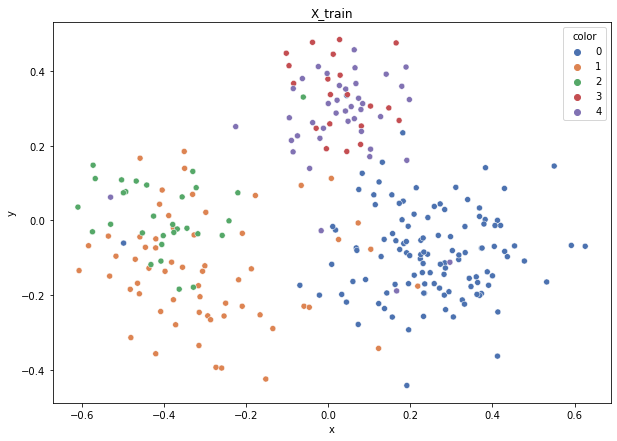

Class cardinalities: Counter({0: 116, 1: 61, 4: 41, 2: 30, 3: 20})
Weights: {0: 0.0649452946471851, 1: 0.1235025275257946, 2: 0.2511218059691157, 3: 0.37668270895367356, 4: 0.183747662904231}


100%|██████████| 68/68 [00:00<00:00, 3267.34it/s]


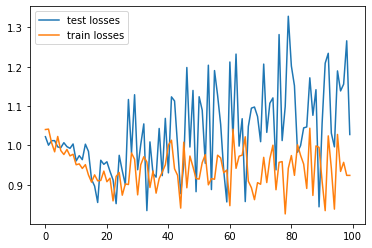

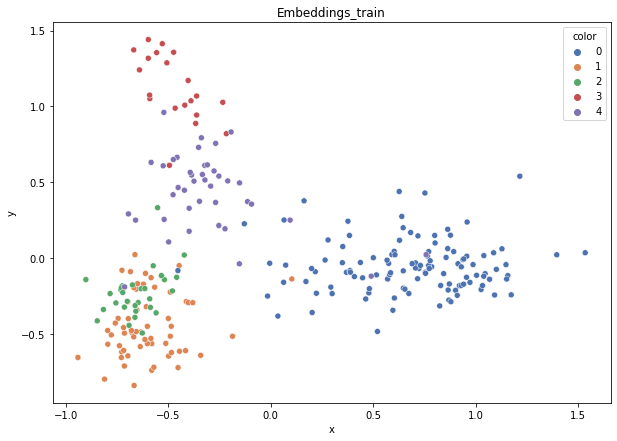

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


DT-f1-new-features: 0.797
DT-f1-old+new-features: 0.791
DT-f1-old-features: 0.634
DT-gmean-new-features: 0.812
DT-gmean-old+new-features: 0.819
DT-gmean-old-features: 0.537
KNN-f1-new-features: 0.788
KNN-f1-old+new-features: 0.788
KNN-f1-old-features: 0.749
KNN-gmean-new-features: 0.787
KNN-gmean-old+new-features: 0.757
KNN-gmean-old-features: 0.719
LDA-f1-new-features: 0.785
LDA-f1-old+new-features: 0.807
LDA-f1-old-features: 0.809
LDA-gmean-new-features: 0.747
LDA-gmean-old+new-features: 0.791
LDA-gmean-old-features: 0.791
QDA-f1-new-features: 0.83
QDA-f1-old+new-features: 0.467
QDA-f1-old-features: 0.287
QDA-gmean-new-features: 0.842
QDA-gmean-old+new-features: 0.166
QDA-gmean-old-features: 0.042
RF24-f1-new-features: 0.812
RF24-f1-old+new-features: 0.812
RF24-f1-old-features: 0.769
RF24-gmean-new-features: 0.802
RF24-gmean-old+new-features: 0.802
RF24-gmean-old-features: 0.771


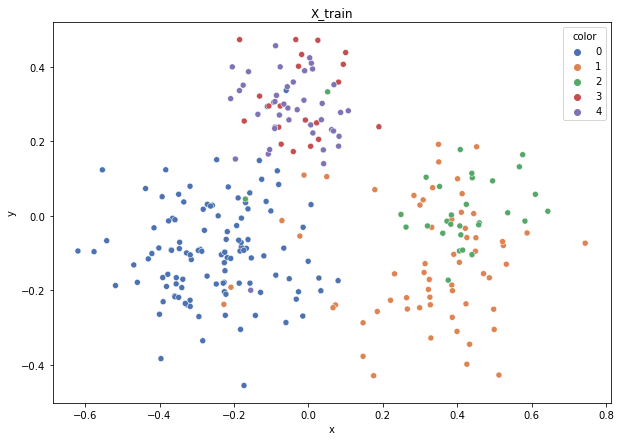

Class cardinalities: Counter({0: 116, 1: 61, 4: 42, 2: 30, 3: 20})
Weights: {0: 0.06523067522150933, 1: 0.12404521845401774, 2: 0.25222527752316937, 3: 0.3783379162847541, 4: 0.18016091251654956}


100%|██████████| 67/67 [00:00<00:00, 3130.25it/s]


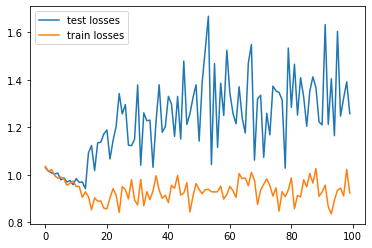

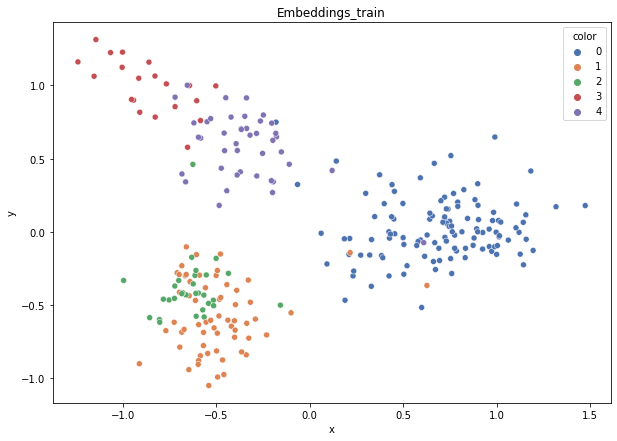

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


DT-f1-new-features: 0.726
DT-f1-old+new-features: 0.737
DT-f1-old-features: 0.707
DT-gmean-new-features: 0.694
DT-gmean-old+new-features: 0.7
DT-gmean-old-features: 0.688
KNN-f1-new-features: 0.739
KNN-f1-old+new-features: 0.733
KNN-f1-old-features: 0.728
KNN-gmean-new-features: 0.694
KNN-gmean-old+new-features: 0.706
KNN-gmean-old-features: 0.709
LDA-f1-new-features: 0.853
LDA-f1-old+new-features: 0.859
LDA-f1-old-features: 0.853
LDA-gmean-new-features: 0.84
LDA-gmean-old+new-features: 0.84
LDA-gmean-old-features: 0.84
QDA-f1-new-features: 0.841
QDA-f1-old+new-features: 0.715
QDA-f1-old-features: 0.494
QDA-gmean-new-features: 0.829
QDA-gmean-old+new-features: 0.679
QDA-gmean-old-features: 0.344
RF24-f1-new-features: 0.848
RF24-f1-old+new-features: 0.859
RF24-f1-old-features: 0.841
RF24-gmean-new-features: 0.821
RF24-gmean-old+new-features: 0.84
RF24-gmean-old-features: 0.829


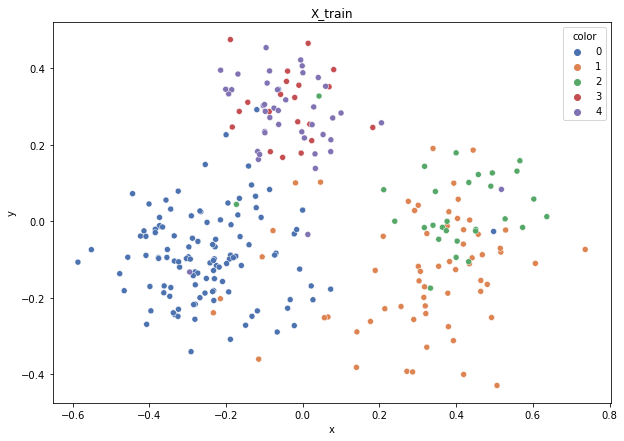

Class cardinalities: Counter({0: 116, 1: 62, 4: 42, 2: 29, 3: 20})
Weights: {0: 0.06479675120436358, 1: 0.12123263128558347, 2: 0.2591870048174543, 3: 0.37582115698530877, 4: 0.17896245570728986}


100%|██████████| 67/67 [00:00<00:00, 3279.59it/s]


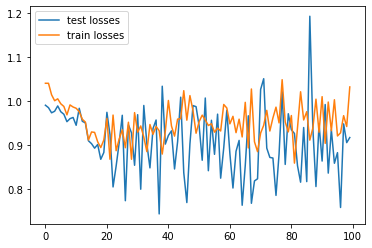

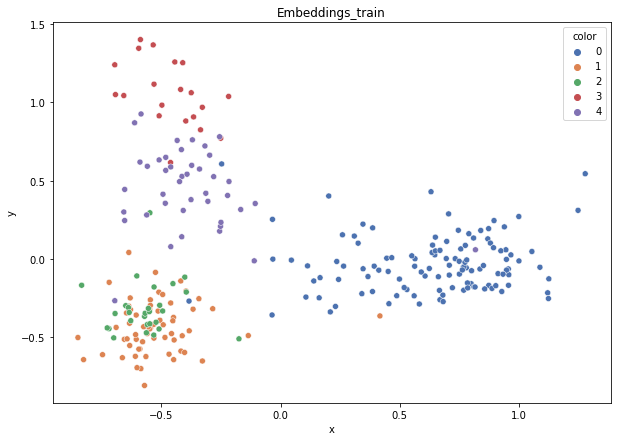

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


DT-f1-new-features: 0.835
DT-f1-old+new-features: 0.835
DT-f1-old-features: 0.722
DT-gmean-new-features: 0.831
DT-gmean-old+new-features: 0.831
DT-gmean-old-features: 0.69
KNN-f1-new-features: 0.886
KNN-f1-old+new-features: 0.862
KNN-f1-old-features: 0.862
KNN-gmean-new-features: 0.855
KNN-gmean-old+new-features: 0.815
KNN-gmean-old-features: 0.815
LDA-f1-new-features: 0.938
LDA-f1-old+new-features: 0.924
LDA-f1-old-features: 0.872
LDA-gmean-new-features: 0.936
LDA-gmean-old+new-features: 0.92
LDA-gmean-old-features: 0.852
QDA-f1-new-features: 0.88
QDA-f1-old+new-features: 0.579
QDA-f1-old-features: 0.176
QDA-gmean-new-features: 0.86
QDA-gmean-old+new-features: 0.451
QDA-gmean-old-features: 0.011
RF24-f1-new-features: 0.948
RF24-f1-old+new-features: 0.92
RF24-f1-old-features: 0.879
RF24-gmean-new-features: 0.937
RF24-gmean-old+new-features: 0.891
RF24-gmean-old-features: 0.846


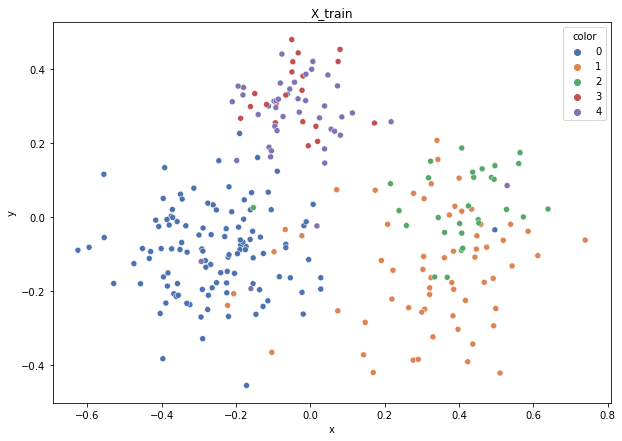

Class cardinalities: Counter({0: 116, 1: 62, 4: 42, 2: 29, 3: 20})
Weights: {0: 0.06479675120436358, 1: 0.12123263128558347, 2: 0.2591870048174543, 3: 0.37582115698530877, 4: 0.17896245570728986}


100%|██████████| 67/67 [00:00<00:00, 3135.28it/s]


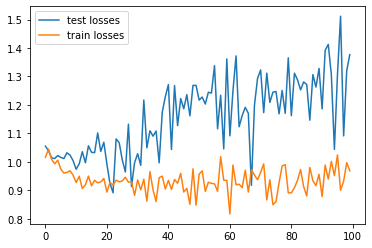

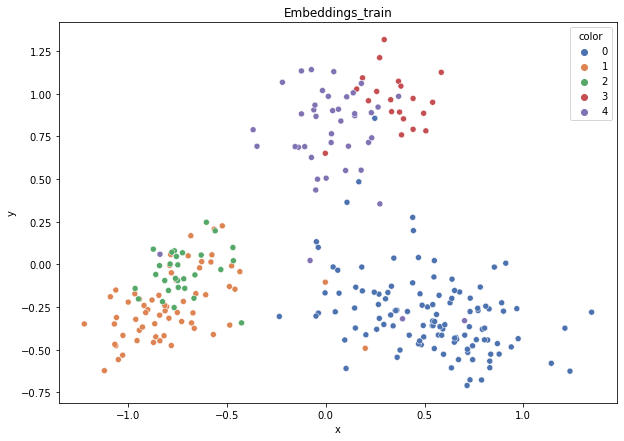

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


DT-f1-new-features: 0.701
DT-f1-old+new-features: 0.707
DT-f1-old-features: 0.649
DT-gmean-new-features: 0.709
DT-gmean-old+new-features: 0.724
DT-gmean-old-features: 0.606
KNN-f1-new-features: 0.805
KNN-f1-old+new-features: 0.805
KNN-f1-old-features: 0.817
KNN-gmean-new-features: 0.777
KNN-gmean-old+new-features: 0.777
KNN-gmean-old-features: 0.782
LDA-f1-new-features: 0.79
LDA-f1-old+new-features: 0.762
LDA-f1-old-features: 0.74
LDA-gmean-new-features: 0.739
LDA-gmean-old+new-features: 0.723
LDA-gmean-old-features: 0.718
QDA-f1-new-features: 0.73
QDA-f1-old+new-features: 0.407
QDA-f1-old-features: 0.328
QDA-gmean-new-features: 0.701
QDA-gmean-old+new-features: 0.137
QDA-gmean-old-features: 0.235
RF24-f1-new-features: 0.832
RF24-f1-old+new-features: 0.826
RF24-f1-old-features: 0.753
RF24-gmean-new-features: 0.812
RF24-gmean-old+new-features: 0.818
RF24-gmean-old-features: 0.719


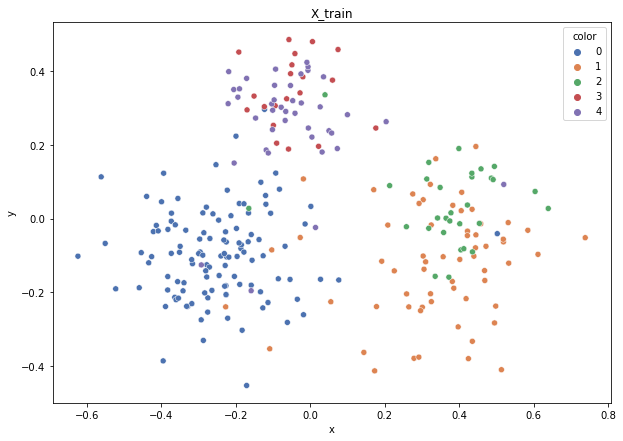

Class cardinalities: Counter({0: 116, 1: 62, 4: 41, 2: 30, 3: 20})
Weights: {0: 0.06507492234699798, 1: 0.12175308052018977, 2: 0.25162303307505884, 3: 0.3774345496125883, 4: 0.18411441444516502}


100%|██████████| 67/67 [00:00<00:00, 3330.98it/s]


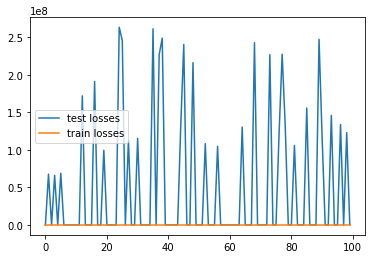

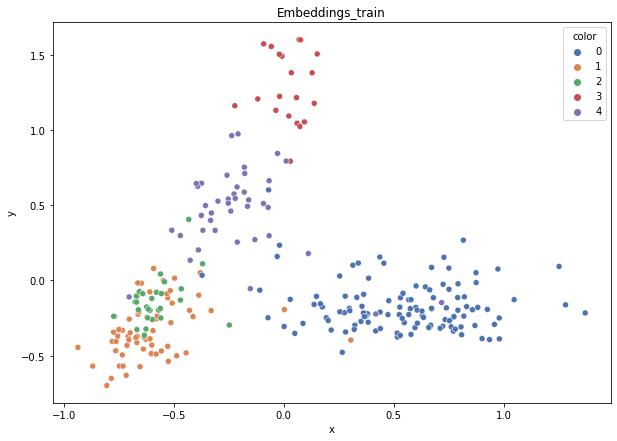

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


DT-f1-new-features: 0.796
DT-f1-old+new-features: 0.792
DT-f1-old-features: 0.793
DT-gmean-new-features: 0.83
DT-gmean-old+new-features: 0.807
DT-gmean-old-features: 0.822
KNN-f1-new-features: 0.748
KNN-f1-old+new-features: 0.802
KNN-f1-old-features: 0.808
KNN-gmean-new-features: 0.759
KNN-gmean-old+new-features: 0.821
KNN-gmean-old-features: 0.84
LDA-f1-new-features: 0.827
LDA-f1-old+new-features: 0.837
LDA-f1-old-features: 0.86
LDA-gmean-new-features: 0.85
LDA-gmean-old+new-features: 0.843
LDA-gmean-old-features: 0.873
QDA-f1-new-features: 0.856
QDA-f1-old+new-features: 0.617
QDA-f1-old-features: 0.333
QDA-gmean-new-features: 0.856
QDA-gmean-old+new-features: 0.615
QDA-gmean-old-features: 0.299
RF24-f1-new-features: 0.831
RF24-f1-old+new-features: 0.831
RF24-f1-old-features: 0.887
RF24-gmean-new-features: 0.84
RF24-gmean-old+new-features: 0.84
RF24-gmean-old-features: 0.876
new_led7digit


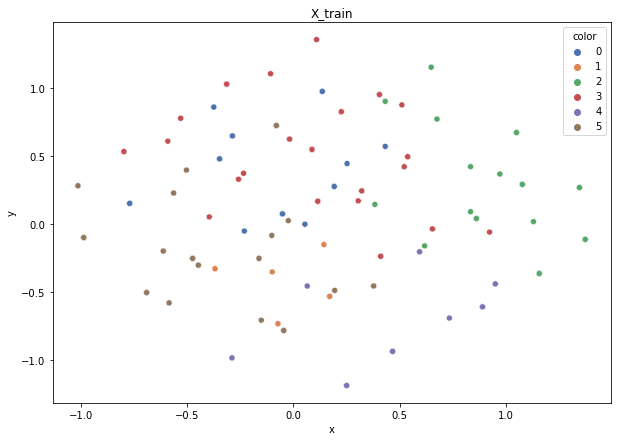

Class cardinalities: Counter({3: 87, 5: 79, 0: 78, 2: 75, 4: 41, 1: 40})
Weights: {0: 0.12859532399632337, 2: 0.1337391369561763, 3: 0.11529235944497956, 4: 0.24464476272471275, 5: 0.1269675350849775, 1: 0.25076088179283057}


100%|██████████| 100/100 [00:00<00:00, 3392.21it/s]


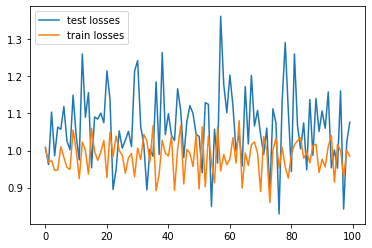

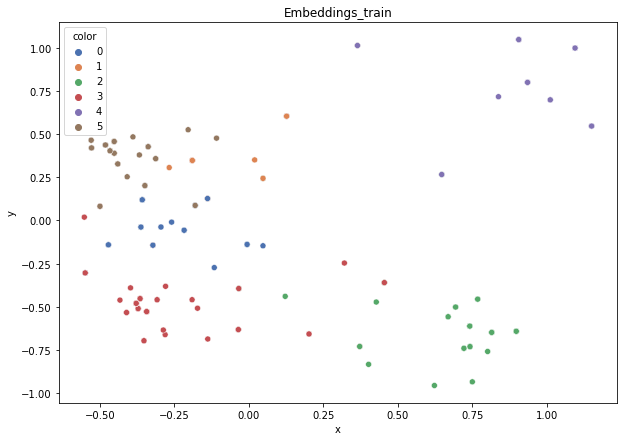

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


DT-f1-new-features: 0.797
DT-f1-old+new-features: 0.777
DT-f1-old-features: 0.789
DT-gmean-new-features: 0.794
DT-gmean-old+new-features: 0.776
DT-gmean-old-features: 0.797
KNN-f1-new-features: 0.75
KNN-f1-old+new-features: 0.746
KNN-f1-old-features: 0.741
KNN-gmean-new-features: 0.74
KNN-gmean-old+new-features: 0.719
KNN-gmean-old-features: 0.719
LDA-f1-new-features: 0.8
LDA-f1-old+new-features: 0.816
LDA-f1-old-features: 0.804
LDA-gmean-new-features: 0.805
LDA-gmean-old+new-features: 0.82
LDA-gmean-old-features: 0.806
QDA-f1-new-features: 0.791
QDA-f1-old+new-features: 0.725
QDA-f1-old-features: 0.709
QDA-gmean-new-features: 0.783
QDA-gmean-old+new-features: 0.713
QDA-gmean-old-features: 0.689
RF24-f1-new-features: 0.766
RF24-f1-old+new-features: 0.747
RF24-f1-old-features: 0.796
RF24-gmean-new-features: 0.74
RF24-gmean-old+new-features: 0.728
RF24-gmean-old-features: 0.797


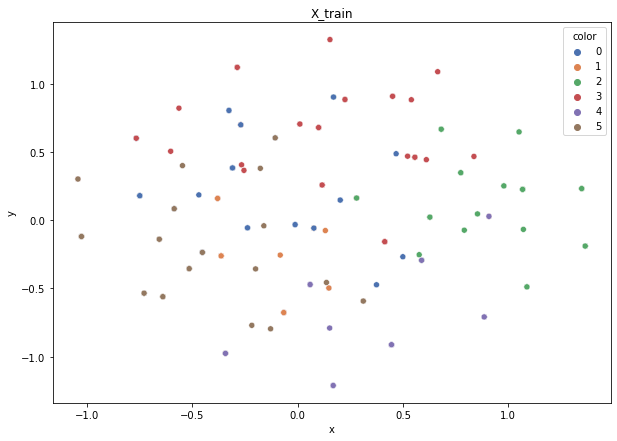

Class cardinalities: Counter({3: 87, 5: 80, 0: 78, 2: 75, 4: 41, 1: 39})
Weights: {0: 0.1279755802357915, 2: 0.13309460344522317, 3: 0.114736727107951, 4: 0.2434657380095546, 5: 0.12477619072989674, 1: 0.255951160471583}


100%|██████████| 100/100 [00:00<00:00, 3166.52it/s]


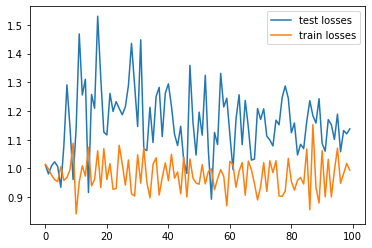

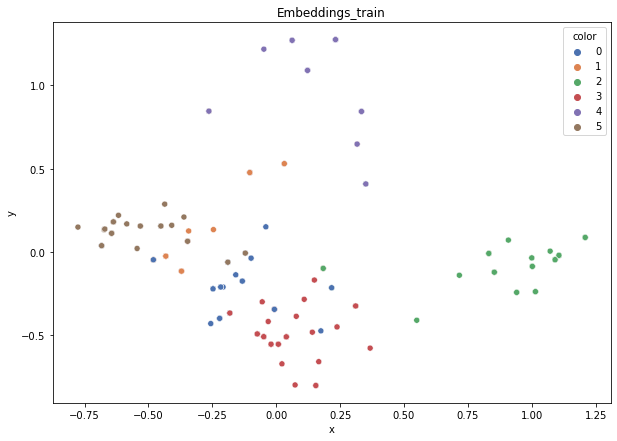

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


DT-f1-new-features: 0.779
DT-f1-old+new-features: 0.772
DT-f1-old-features: 0.779
DT-gmean-new-features: 0.752
DT-gmean-old+new-features: 0.745
DT-gmean-old-features: 0.755
KNN-f1-new-features: 0.681
KNN-f1-old+new-features: 0.669
KNN-f1-old-features: 0.692
KNN-gmean-new-features: 0.641
KNN-gmean-old+new-features: 0.276
KNN-gmean-old-features: 0.283
LDA-f1-new-features: 0.776
LDA-f1-old+new-features: 0.759
LDA-f1-old-features: 0.756
LDA-gmean-new-features: 0.747
LDA-gmean-old+new-features: 0.728
LDA-gmean-old-features: 0.729
QDA-f1-new-features: 0.739
QDA-f1-old+new-features: 0.519
QDA-f1-old-features: 0.745
QDA-gmean-new-features: 0.694
QDA-gmean-old+new-features: 0.489
QDA-gmean-old-features: 0.695
RF24-f1-new-features: 0.751
RF24-f1-old+new-features: 0.727
RF24-f1-old-features: 0.767
RF24-gmean-new-features: 0.712
RF24-gmean-old+new-features: 0.686
RF24-gmean-old-features: 0.735


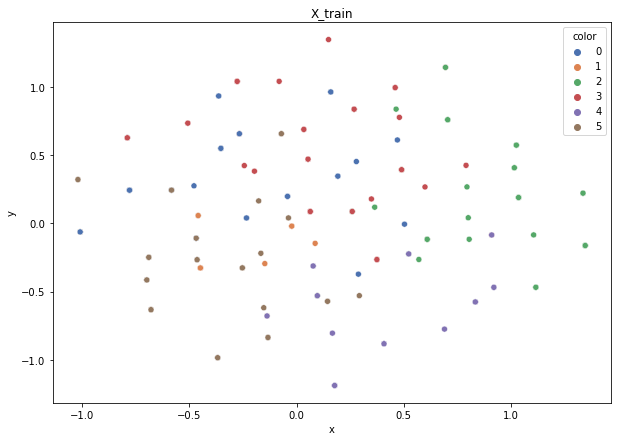

Class cardinalities: Counter({3: 86, 5: 79, 0: 78, 2: 76, 4: 42, 1: 39})
Weights: {0: 0.12857143873483481, 2: 0.1319548976489094, 3: 0.11661130489903622, 4: 0.23877552907897892, 5: 0.12694395216857107, 1: 0.25714287746966963}


100%|██████████| 100/100 [00:00<00:00, 3398.40it/s]


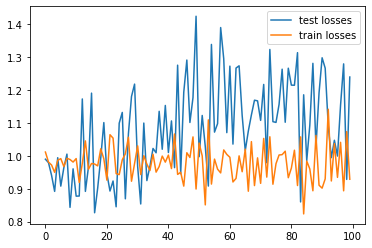

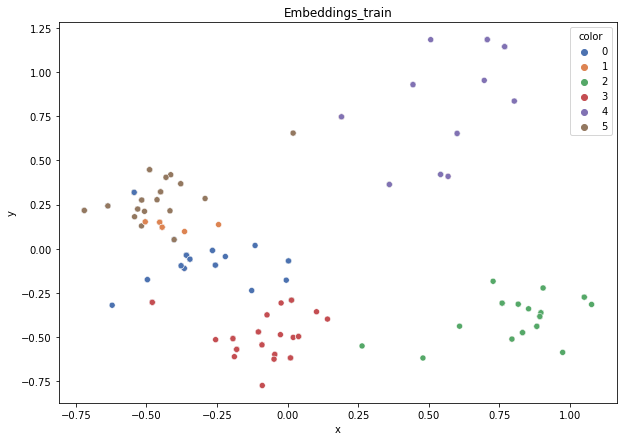

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


DT-f1-new-features: 0.784
DT-f1-old+new-features: 0.784
DT-f1-old-features: 0.782
DT-gmean-new-features: 0.785
DT-gmean-old+new-features: 0.785
DT-gmean-old-features: 0.783
KNN-f1-new-features: 0.796
KNN-f1-old+new-features: 0.731
KNN-f1-old-features: 0.739
KNN-gmean-new-features: 0.794
KNN-gmean-old+new-features: 0.731
KNN-gmean-old-features: 0.739
LDA-f1-new-features: 0.796
LDA-f1-old+new-features: 0.796
LDA-f1-old-features: 0.824
LDA-gmean-new-features: 0.793
LDA-gmean-old+new-features: 0.793
LDA-gmean-old-features: 0.824
QDA-f1-new-features: 0.789
QDA-f1-old+new-features: 0.589
QDA-f1-old-features: 0.769
QDA-gmean-new-features: 0.776
QDA-gmean-old+new-features: 0.466
QDA-gmean-old-features: 0.761
RF24-f1-new-features: 0.793
RF24-f1-old+new-features: 0.784
RF24-f1-old-features: 0.793
RF24-gmean-new-features: 0.793
RF24-gmean-old+new-features: 0.785
RF24-gmean-old-features: 0.793


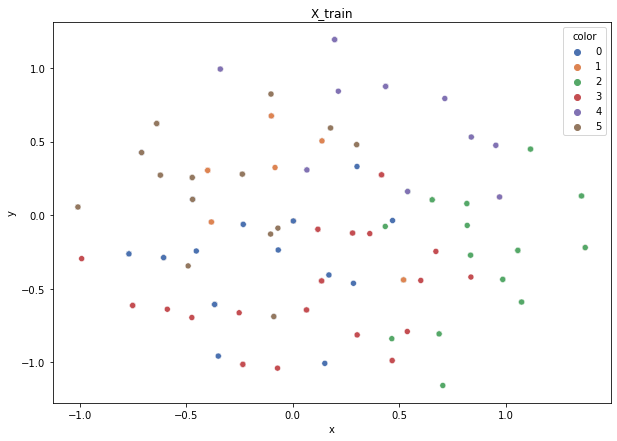

Class cardinalities: Counter({3: 86, 0: 79, 5: 79, 2: 75, 4: 42, 1: 39})
Weights: {0: 0.12692720893782067, 2: 0.13369666008117112, 3: 0.11659592448939342, 4: 0.23874403585923412, 5: 0.12692720893782067, 1: 0.2571089616945598}


100%|██████████| 100/100 [00:00<00:00, 3396.14it/s]


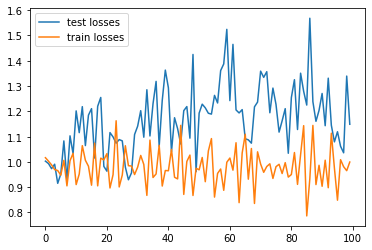

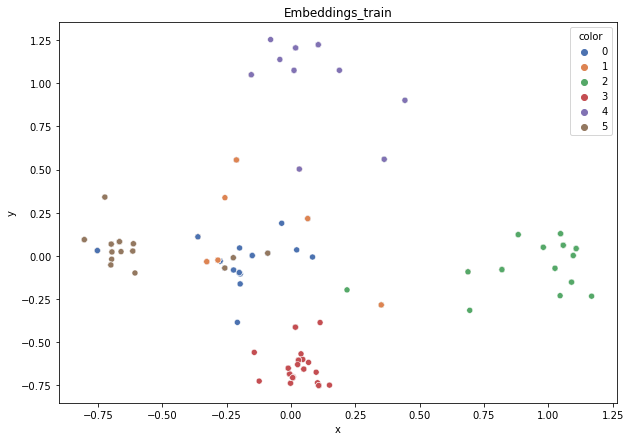

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


DT-f1-new-features: 0.735
DT-f1-old+new-features: 0.735
DT-f1-old-features: 0.716
DT-gmean-new-features: 0.717
DT-gmean-old+new-features: 0.717
DT-gmean-old-features: 0.698
KNN-f1-new-features: 0.666
KNN-f1-old+new-features: 0.696
KNN-f1-old-features: 0.714
KNN-gmean-new-features: 0.659
KNN-gmean-old+new-features: 0.684
KNN-gmean-old-features: 0.704
LDA-f1-new-features: 0.733
LDA-f1-old+new-features: 0.724
LDA-f1-old-features: 0.784
LDA-gmean-new-features: 0.727
LDA-gmean-old+new-features: 0.714
LDA-gmean-old-features: 0.777
QDA-f1-new-features: 0.707
QDA-f1-old+new-features: 0.575
QDA-f1-old-features: 0.722
QDA-gmean-new-features: 0.689
QDA-gmean-old+new-features: 0.542
QDA-gmean-old-features: 0.704
RF24-f1-new-features: 0.754
RF24-f1-old+new-features: 0.754
RF24-f1-old-features: 0.763
RF24-gmean-new-features: 0.743
RF24-gmean-old+new-features: 0.743
RF24-gmean-old-features: 0.751


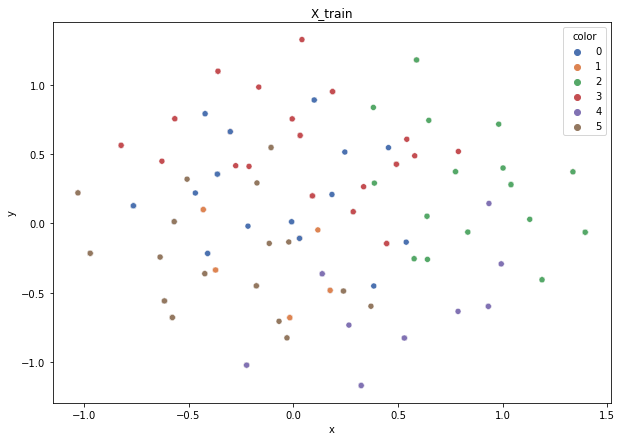

Class cardinalities: Counter({3: 86, 0: 79, 5: 79, 2: 75, 4: 42, 1: 39})
Weights: {0: 0.12692720893782067, 2: 0.13369666008117112, 3: 0.11659592448939342, 4: 0.23874403585923412, 5: 0.12692720893782067, 1: 0.2571089616945598}


100%|██████████| 100/100 [00:00<00:00, 2940.17it/s]


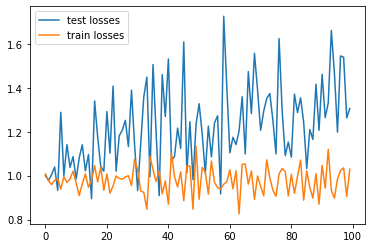

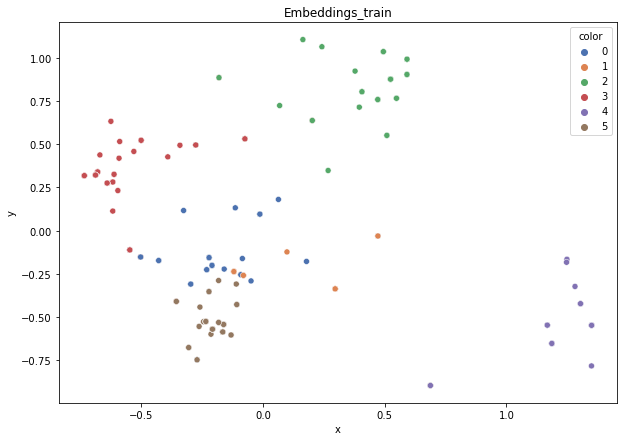

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


DT-f1-new-features: 0.778
DT-f1-old+new-features: 0.778
DT-f1-old-features: 0.802
DT-gmean-new-features: 0.781
DT-gmean-old+new-features: 0.781
DT-gmean-old-features: 0.806
KNN-f1-new-features: 0.713
KNN-f1-old+new-features: 0.785
KNN-f1-old-features: 0.785
KNN-gmean-new-features: 0.708
KNN-gmean-old+new-features: 0.796
KNN-gmean-old-features: 0.796
LDA-f1-new-features: 0.778
LDA-f1-old+new-features: 0.778
LDA-f1-old-features: 0.822
LDA-gmean-new-features: 0.781
LDA-gmean-old+new-features: 0.781
LDA-gmean-old-features: 0.822
QDA-f1-new-features: 0.794
QDA-f1-old+new-features: 0.711
QDA-f1-old-features: 0.8
QDA-gmean-new-features: 0.798
QDA-gmean-old+new-features: 0.703
QDA-gmean-old-features: 0.797
RF24-f1-new-features: 0.786
RF24-f1-old+new-features: 0.786
RF24-f1-old-features: 0.802
RF24-gmean-new-features: 0.788
RF24-gmean-old+new-features: 0.788
RF24-gmean-old-features: 0.806
new_winequality-red


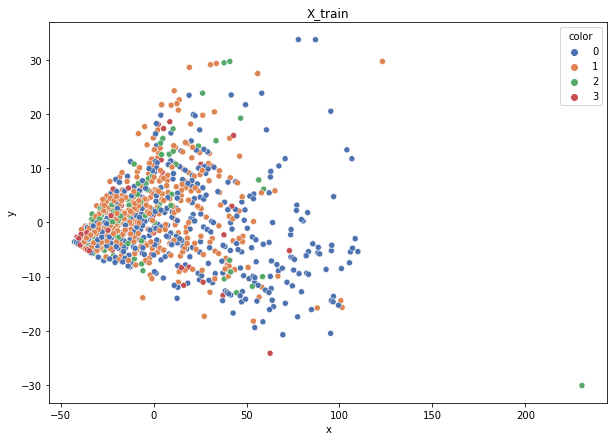

Class cardinalities: Counter({0: 544, 1: 511, 2: 159, 3: 65})
Weights: {0: 0.07217510080141348, 1: 0.07683611513888246, 2: 0.246938709660182, 3: 0.6040500743995221}


100%|██████████| 320/320 [00:00<00:00, 3558.85it/s]


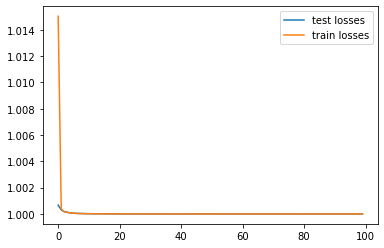

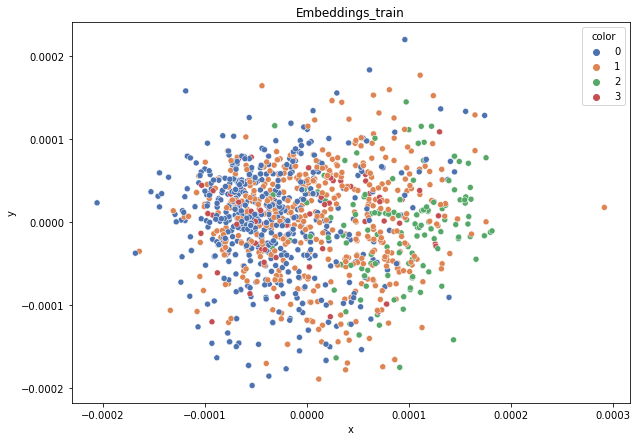

DT-f1-new-features: 0.465
DT-f1-old+new-features: 0.464
DT-f1-old-features: 0.503
DT-gmean-new-features: 0.343
DT-gmean-old+new-features: 0.352
DT-gmean-old-features: 0.368
KNN-f1-new-features: 0.553
KNN-f1-old+new-features: 0.555
KNN-f1-old-features: 0.555
KNN-gmean-new-features: 0.509
KNN-gmean-old+new-features: 0.487
KNN-gmean-old-features: 0.487
LDA-f1-new-features: 0.495
LDA-f1-old+new-features: 0.463
LDA-f1-old-features: 0.458
LDA-gmean-new-features: 0.405
LDA-gmean-old+new-features: 0.382
LDA-gmean-old-features: 0.328
QDA-f1-new-features: 0.423
QDA-f1-old+new-features: 0.434
QDA-f1-old-features: 0.403
QDA-gmean-new-features: 0.359
QDA-gmean-old+new-features: 0.325
QDA-gmean-old-features: 0.111
RF24-f1-new-features: 0.522
RF24-f1-old+new-features: 0.546
RF24-f1-old-features: 0.581
RF24-gmean-new-features: 0.135
RF24-gmean-old+new-features: 0.138
RF24-gmean-old-features: 0.402


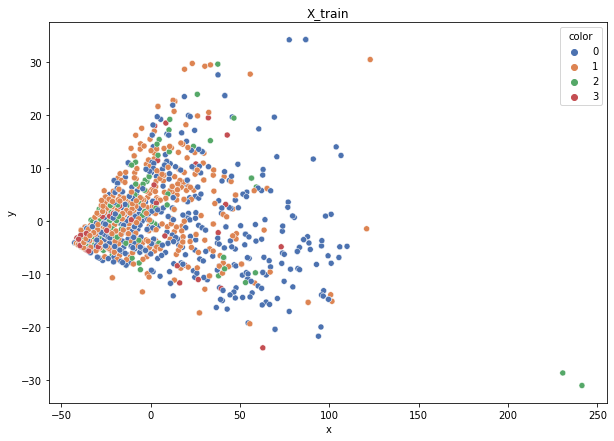

Class cardinalities: Counter({0: 545, 1: 510, 2: 159, 3: 65})
Weights: {0: 0.072041356277607, 1: 0.07698537092410943, 2: 0.24693420862450194, 3: 0.6040390641737817}


100%|██████████| 320/320 [00:00<00:00, 3354.98it/s]


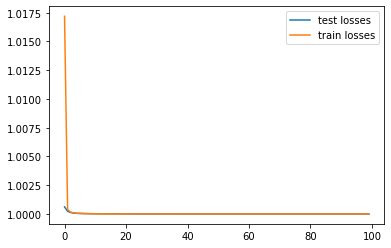

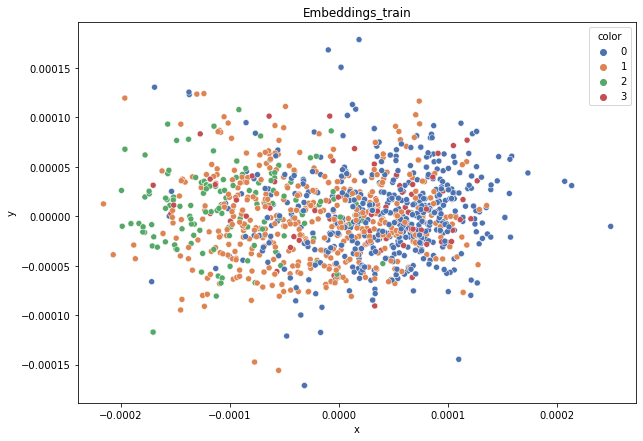

DT-f1-new-features: 0.511
DT-f1-old+new-features: 0.488
DT-f1-old-features: 0.505
DT-gmean-new-features: 0.486
DT-gmean-old+new-features: 0.48
DT-gmean-old-features: 0.48
KNN-f1-new-features: 0.493
KNN-f1-old+new-features: 0.555
KNN-f1-old-features: 0.555
KNN-gmean-new-features: 0.436
KNN-gmean-old+new-features: 0.512
KNN-gmean-old-features: 0.512
LDA-f1-new-features: 0.422
LDA-f1-old+new-features: 0.474
LDA-f1-old-features: 0.453
LDA-gmean-new-features: 0.114
LDA-gmean-old+new-features: 0.389
LDA-gmean-old-features: 0.348
QDA-f1-new-features: 0.416
QDA-f1-old+new-features: 0.435
QDA-f1-old-features: 0.478
QDA-gmean-new-features: 0.111
QDA-gmean-old+new-features: 0.12
QDA-gmean-old-features: 0.421
RF24-f1-new-features: 0.538
RF24-f1-old+new-features: 0.579
RF24-f1-old-features: 0.558
RF24-gmean-new-features: 0.372
RF24-gmean-old+new-features: 0.481
RF24-gmean-old-features: 0.439


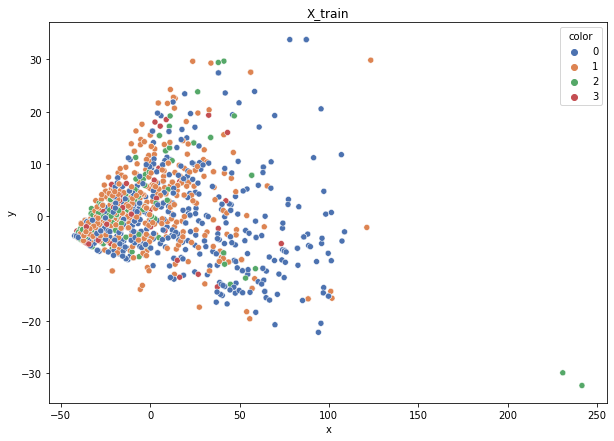

Class cardinalities: Counter({0: 545, 1: 510, 2: 159, 3: 65})
Weights: {0: 0.072041356277607, 1: 0.07698537092410943, 2: 0.24693420862450194, 3: 0.6040390641737817}


100%|██████████| 320/320 [00:00<00:00, 3530.00it/s]


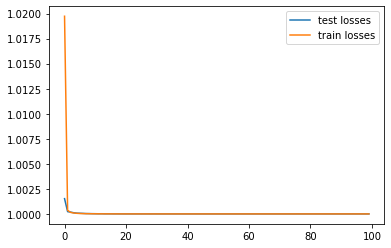

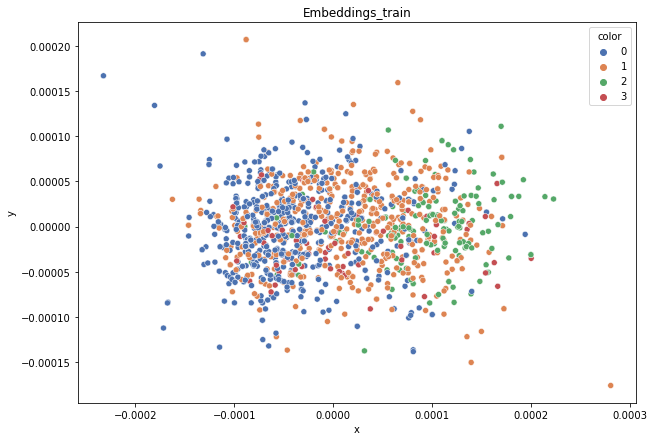

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


DT-f1-new-features: 0.491
DT-f1-old+new-features: 0.496
DT-f1-old-features: 0.514
DT-gmean-new-features: 0.429
DT-gmean-old+new-features: 0.469
DT-gmean-old-features: 0.468
KNN-f1-new-features: 0.514
KNN-f1-old+new-features: 0.544
KNN-f1-old-features: 0.544
KNN-gmean-new-features: 0.468
KNN-gmean-old+new-features: 0.516
KNN-gmean-old-features: 0.516
LDA-f1-new-features: 0.471
LDA-f1-old+new-features: 0.44
LDA-f1-old-features: 0.445
LDA-gmean-new-features: 0.398
LDA-gmean-old+new-features: 0.326
LDA-gmean-old-features: 0.321
QDA-f1-new-features: 0.464
QDA-f1-old+new-features: 0.437
QDA-f1-old-features: 0.42
QDA-gmean-new-features: 0.391
QDA-gmean-old+new-features: 0.337
QDA-gmean-old-features: 0.306
RF24-f1-new-features: 0.481
RF24-f1-old+new-features: 0.555
RF24-f1-old-features: 0.515
RF24-gmean-new-features: 0.13
RF24-gmean-old+new-features: 0.391
RF24-gmean-old-features: 0.138


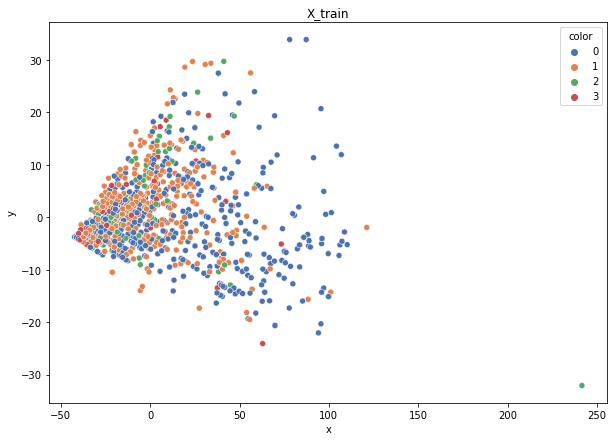

Class cardinalities: Counter({0: 545, 1: 510, 2: 160, 3: 64})
Weights: {0: 0.07147706120661339, 2: 0.24346873973502686, 3: 0.6086718493375671, 1: 0.07638234972079273}


100%|██████████| 320/320 [00:00<00:00, 3431.16it/s]


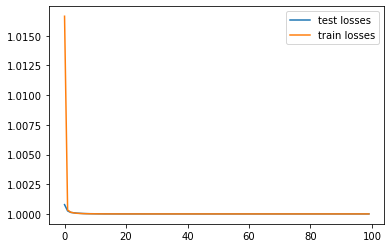

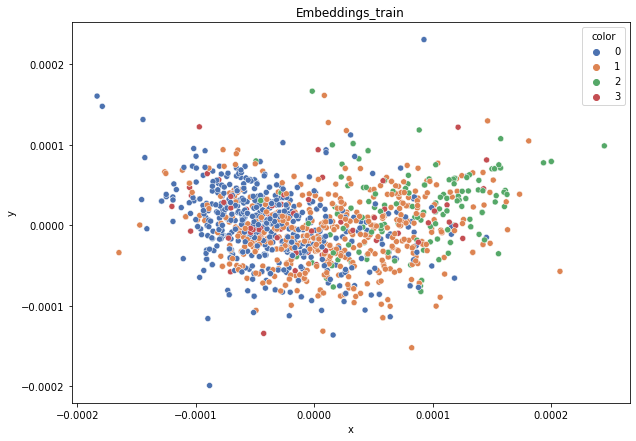

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


DT-f1-new-features: 0.416
DT-f1-old+new-features: 0.438
DT-f1-old-features: 0.427
DT-gmean-new-features: 0.385
DT-gmean-old+new-features: 0.389
DT-gmean-old-features: 0.378
KNN-f1-new-features: 0.509
KNN-f1-old+new-features: 0.486
KNN-f1-old-features: 0.486
KNN-gmean-new-features: 0.47
KNN-gmean-old+new-features: 0.421
KNN-gmean-old-features: 0.421
LDA-f1-new-features: 0.489
LDA-f1-old+new-features: 0.504
LDA-f1-old-features: 0.411
LDA-gmean-new-features: 0.425
LDA-gmean-old+new-features: 0.443
LDA-gmean-old-features: 0.11
QDA-f1-new-features: 0.415
QDA-f1-old+new-features: 0.381
QDA-f1-old-features: 0.418
QDA-gmean-new-features: 0.305
QDA-gmean-old+new-features: 0.11
QDA-gmean-old-features: 0.361
RF24-f1-new-features: 0.515
RF24-f1-old+new-features: 0.535
RF24-f1-old-features: 0.513
RF24-gmean-new-features: 0.402
RF24-gmean-old+new-features: 0.409
RF24-gmean-old-features: 0.401


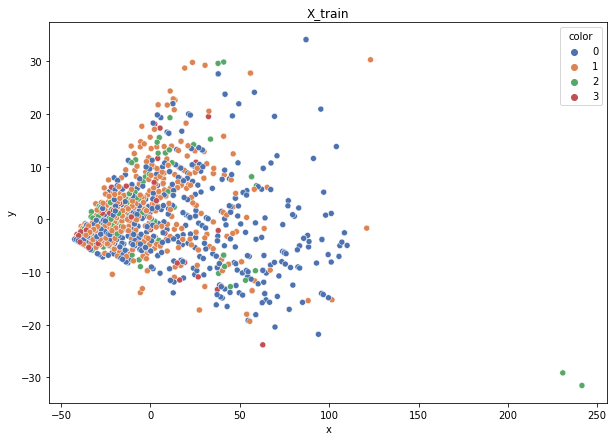

Class cardinalities: Counter({0: 545, 1: 511, 2: 159, 3: 65})
Weights: {0: 0.07205221139741194, 1: 0.07684629199919668, 2: 0.24697141642509127, 3: 0.6041300801783002}


100%|██████████| 319/319 [00:00<00:00, 3556.39it/s]


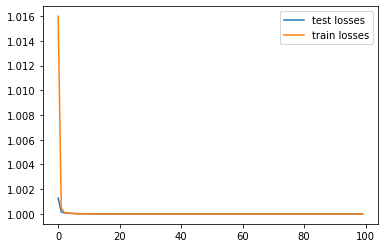

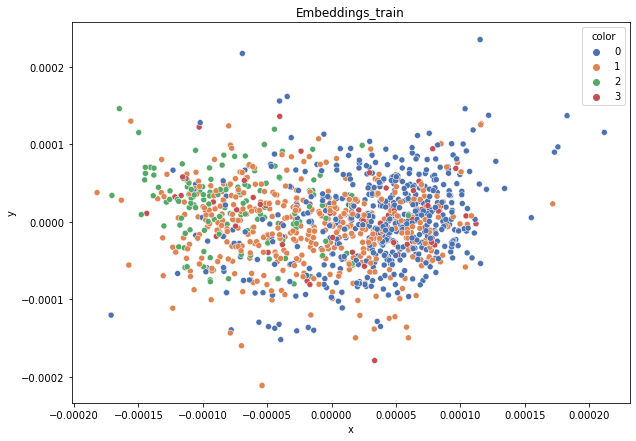

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


DT-f1-new-features: 0.492
DT-f1-old+new-features: 0.462
DT-f1-old-features: 0.463
DT-gmean-new-features: 0.445
DT-gmean-old+new-features: 0.432
DT-gmean-old-features: 0.399
KNN-f1-new-features: 0.531
KNN-f1-old+new-features: 0.537
KNN-f1-old-features: 0.537
KNN-gmean-new-features: 0.434
KNN-gmean-old+new-features: 0.437
KNN-gmean-old-features: 0.437
LDA-f1-new-features: 0.548
LDA-f1-old+new-features: 0.585
LDA-f1-old-features: 0.512
LDA-gmean-new-features: 0.487
LDA-gmean-old+new-features: 0.544
LDA-gmean-old-features: 0.431
QDA-f1-new-features: 0.522
QDA-f1-old+new-features: 0.526
QDA-f1-old-features: 0.512
QDA-gmean-new-features: 0.459
QDA-gmean-old+new-features: 0.497
QDA-gmean-old-features: 0.449
RF24-f1-new-features: 0.556
RF24-f1-old+new-features: 0.599
RF24-f1-old-features: 0.608
RF24-gmean-new-features: 0.383
RF24-gmean-old+new-features: 0.461
RF24-gmean-old-features: 0.472
thyroid-newthyroid


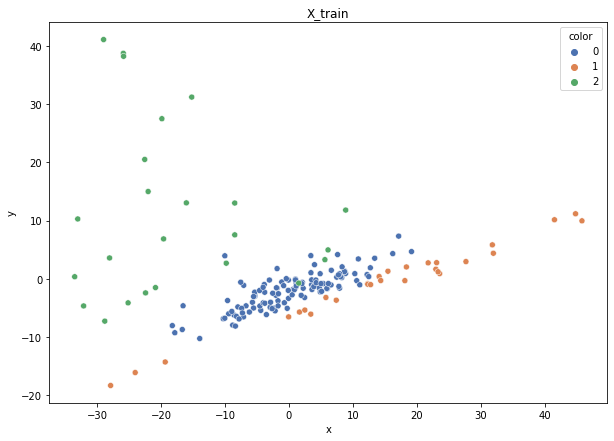

Class cardinalities: Counter({0: 120, 1: 28, 2: 24})
Weights: {0: 0.09722222222222222, 1: 0.41666666666666663, 2: 0.4861111111111111}


100%|██████████| 43/43 [00:00<00:00, 3233.85it/s]


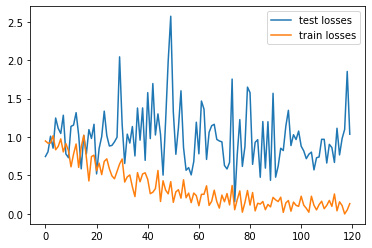

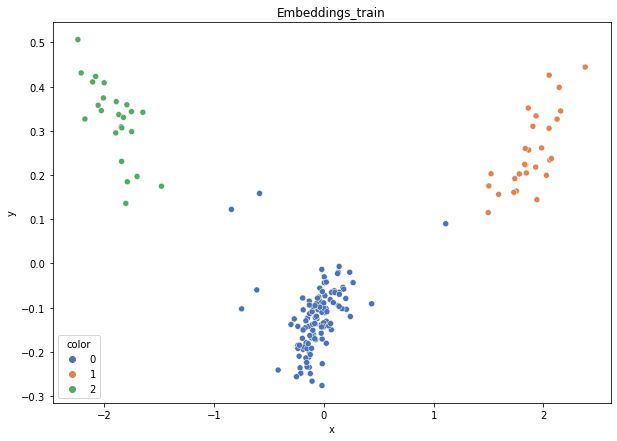

DT-f1-new-features: 0.923
DT-f1-old+new-features: 0.964
DT-f1-old-features: 0.902
DT-gmean-new-features: 0.874
DT-gmean-old+new-features: 0.941
DT-gmean-old-features: 0.884
KNN-f1-new-features: 0.964
KNN-f1-old+new-features: 0.964
KNN-f1-old-features: 0.964
KNN-gmean-new-features: 0.941
KNN-gmean-old+new-features: 0.941
KNN-gmean-old-features: 0.941
LDA-f1-new-features: 0.964
LDA-f1-old+new-features: 0.964
LDA-f1-old-features: 0.898
LDA-gmean-new-features: 0.941
LDA-gmean-old+new-features: 0.941
LDA-gmean-old-features: 0.841
QDA-f1-new-features: 0.964
QDA-f1-old+new-features: 0.964
QDA-f1-old-features: 0.964
QDA-gmean-new-features: 0.941
QDA-gmean-old+new-features: 0.941
QDA-gmean-old-features: 0.941
RF24-f1-new-features: 0.923
RF24-f1-old+new-features: 0.923
RF24-f1-old-features: 0.933
RF24-gmean-new-features: 0.874
RF24-gmean-old+new-features: 0.874
RF24-gmean-old-features: 0.894


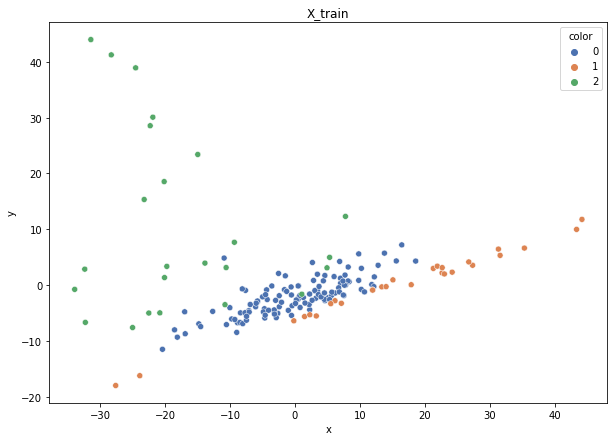

Class cardinalities: Counter({0: 120, 1: 28, 2: 24})
Weights: {0: 0.09722222222222222, 1: 0.41666666666666663, 2: 0.4861111111111111}


100%|██████████| 43/43 [00:00<00:00, 3100.00it/s]


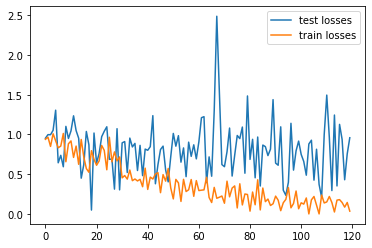

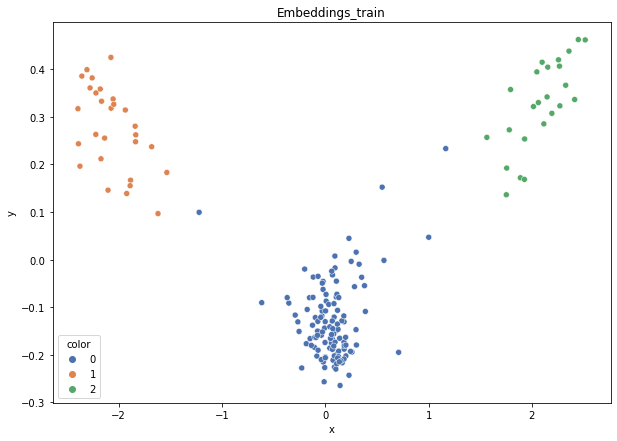

DT-f1-new-features: 0.933
DT-f1-old+new-features: 0.933
DT-f1-old-features: 0.947
DT-gmean-new-features: 0.894
DT-gmean-old+new-features: 0.894
DT-gmean-old-features: 0.977
KNN-f1-new-features: 0.933
KNN-f1-old+new-features: 0.969
KNN-f1-old-features: 0.972
KNN-gmean-new-features: 0.894
KNN-gmean-old+new-features: 0.95
KNN-gmean-old-features: 0.989
LDA-f1-new-features: 0.969
LDA-f1-old+new-features: 0.969
LDA-f1-old-features: 0.933
LDA-gmean-new-features: 0.95
LDA-gmean-old+new-features: 0.95
LDA-gmean-old-features: 0.894
QDA-f1-new-features: 0.969
QDA-f1-old+new-features: 0.969
QDA-f1-old-features: 0.969
QDA-gmean-new-features: 0.95
QDA-gmean-old+new-features: 0.95
QDA-gmean-old-features: 0.989
RF24-f1-new-features: 0.933
RF24-f1-old+new-features: 0.933
RF24-f1-old-features: 0.969
RF24-gmean-new-features: 0.894
RF24-gmean-old+new-features: 0.894
RF24-gmean-old-features: 0.95


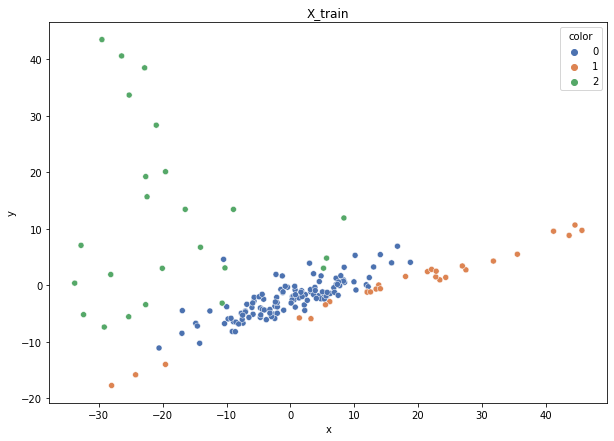

Class cardinalities: Counter({0: 120, 1: 28, 2: 24})
Weights: {0: 0.09722222222222222, 1: 0.41666666666666663, 2: 0.4861111111111111}


100%|██████████| 43/43 [00:00<00:00, 3260.21it/s]


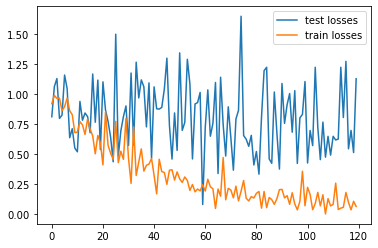

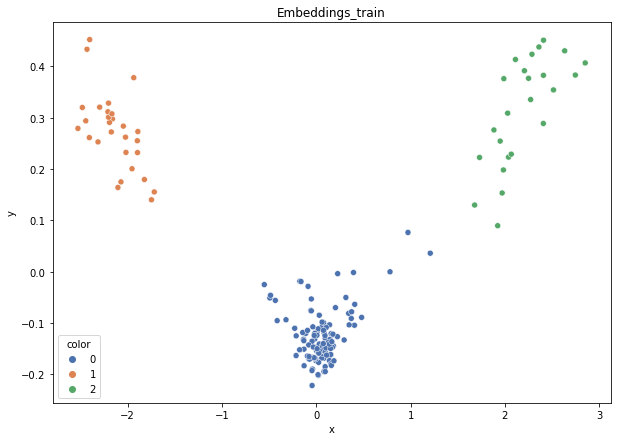

DT-f1-new-features: 0.972
DT-f1-old+new-features: 0.936
DT-f1-old-features: 0.905
DT-gmean-new-features: 0.989
DT-gmean-old+new-features: 0.93
DT-gmean-old-features: 0.92
KNN-f1-new-features: 0.936
KNN-f1-old+new-features: 0.936
KNN-f1-old-features: 0.902
KNN-gmean-new-features: 0.93
KNN-gmean-old+new-features: 0.93
KNN-gmean-old-features: 0.884
LDA-f1-new-features: 0.972
LDA-f1-old+new-features: 0.941
LDA-f1-old-features: 0.817
LDA-gmean-new-features: 0.989
LDA-gmean-old+new-features: 0.977
LDA-gmean-old-features: 0.725
QDA-f1-new-features: 0.972
QDA-f1-old+new-features: 0.905
QDA-f1-old-features: 0.936
QDA-gmean-new-features: 0.989
QDA-gmean-old+new-features: 0.92
QDA-gmean-old-features: 0.93
RF24-f1-new-features: 0.936
RF24-f1-old+new-features: 0.936
RF24-f1-old-features: 0.933
RF24-gmean-new-features: 0.93
RF24-gmean-old+new-features: 0.93
RF24-gmean-old-features: 0.894


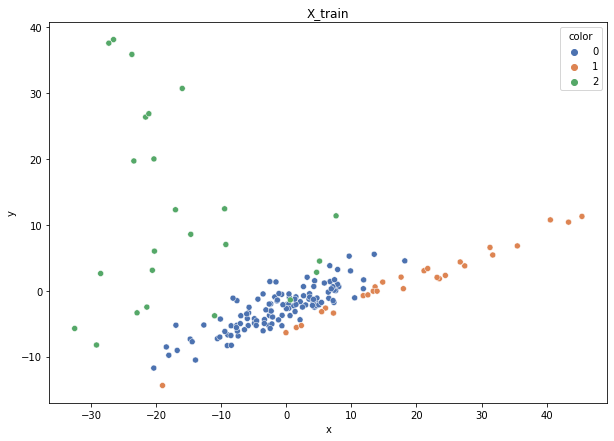

Class cardinalities: Counter({0: 120, 1: 28, 2: 24})
Weights: {0: 0.09722222222222222, 1: 0.41666666666666663, 2: 0.4861111111111111}


100%|██████████| 43/43 [00:00<00:00, 3192.24it/s]


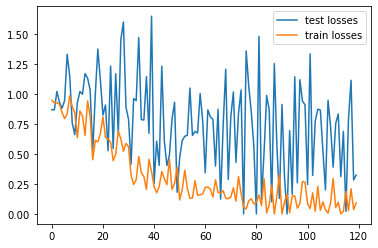

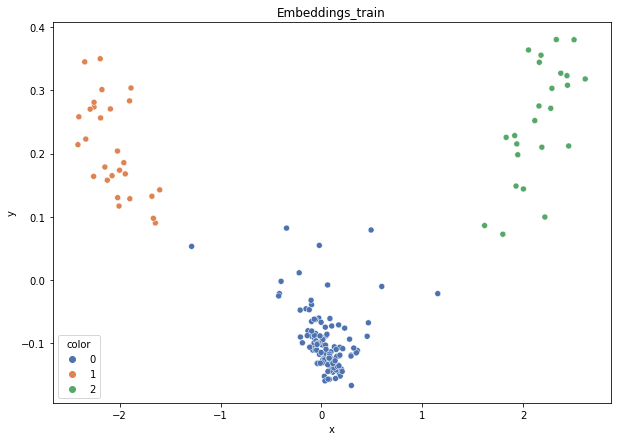

DT-f1-new-features: 1.0
DT-f1-old+new-features: 1.0
DT-f1-old-features: 0.902
DT-gmean-new-features: 1.0
DT-gmean-old+new-features: 1.0
DT-gmean-old-features: 0.884
KNN-f1-new-features: 1.0
KNN-f1-old+new-features: 0.913
KNN-f1-old-features: 0.941
KNN-gmean-new-features: 1.0
KNN-gmean-old+new-features: 0.965
KNN-gmean-old-features: 0.977
LDA-f1-new-features: 0.972
LDA-f1-old+new-features: 0.972
LDA-f1-old-features: 0.898
LDA-gmean-new-features: 0.989
LDA-gmean-old+new-features: 0.989
LDA-gmean-old-features: 0.841
QDA-f1-new-features: 0.913
QDA-f1-old+new-features: 0.913
QDA-f1-old-features: 0.969
QDA-gmean-new-features: 0.965
QDA-gmean-old+new-features: 0.965
QDA-gmean-old-features: 0.989
RF24-f1-new-features: 1.0
RF24-f1-old+new-features: 1.0
RF24-f1-old-features: 0.902
RF24-gmean-new-features: 1.0
RF24-gmean-old+new-features: 1.0
RF24-gmean-old-features: 0.884


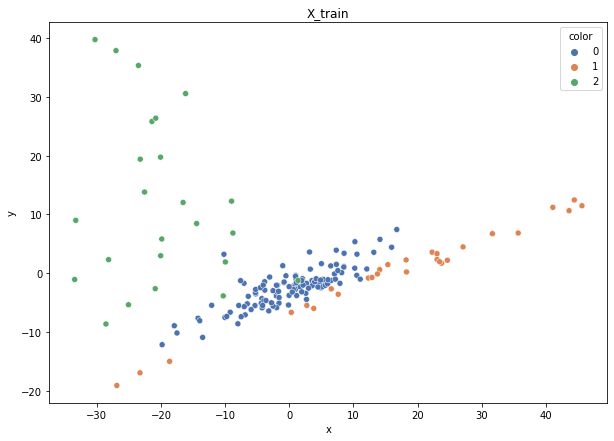

Class cardinalities: Counter({0: 120, 1: 28, 2: 24})
Weights: {0: 0.09722222222222222, 1: 0.41666666666666663, 2: 0.4861111111111111}


100%|██████████| 43/43 [00:00<00:00, 3118.17it/s]


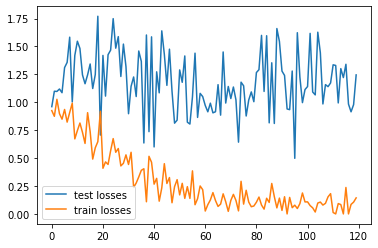

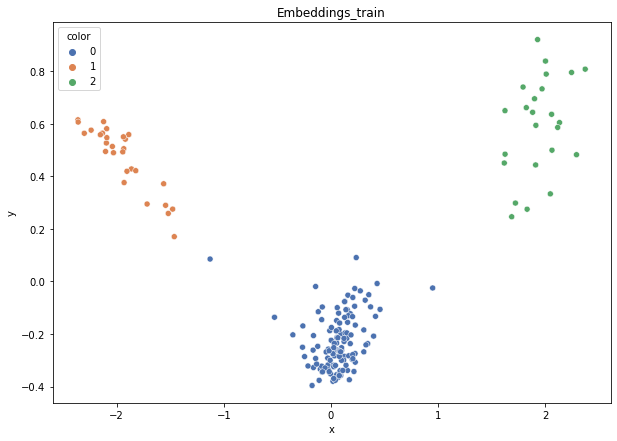

DT-f1-new-features: 0.873
DT-f1-old+new-features: 0.923
DT-f1-old-features: 0.893
DT-gmean-new-features: 0.794
DT-gmean-old+new-features: 0.874
DT-gmean-old-features: 0.864
KNN-f1-new-features: 0.873
KNN-f1-old+new-features: 0.873
KNN-f1-old-features: 0.873
KNN-gmean-new-features: 0.794
KNN-gmean-old+new-features: 0.794
KNN-gmean-old-features: 0.794
LDA-f1-new-features: 0.923
LDA-f1-old+new-features: 0.923
LDA-f1-old-features: 0.721
LDA-gmean-new-features: 0.874
LDA-gmean-old+new-features: 0.874
LDA-gmean-old-features: 0.598
QDA-f1-new-features: 0.923
QDA-f1-old+new-features: 0.893
QDA-f1-old-features: 0.895
QDA-gmean-new-features: 0.874
QDA-gmean-old+new-features: 0.864
QDA-gmean-old-features: 0.864
RF24-f1-new-features: 0.923
RF24-f1-old+new-features: 0.873
RF24-f1-old-features: 0.923
RF24-gmean-new-features: 0.874
RF24-gmean-old+new-features: 0.794
RF24-gmean-old-features: 0.874


In [41]:
result_dict = defaultdict(list)

safety_dict = defaultdict(list)

if test_all_ds:
    ds_names = dt_name_to_cols_to_encode.keys()
else:
    ds_names = [ds_name]
for dataset_name in ds_names:
# for dataset_name in list(datasets.keys()):
    print(dataset_name)
    result_dict["dataset"].append(dataset_name)
    fold_result_dict = defaultdict(list)
    
    safety_dict["dataset"].append(dataset_name)
    fold_safety_dict = defaultdict(list)

    X, y = datasets[dataset_name]['data'], datasets[dataset_name]['target']
    X_encoded, y = datasets[f"{dataset_name}_encoded"]['data'], datasets[f"{dataset_name}_encoded"]['target']
    
    skf = StratifiedKFold(n_splits=5, random_state=0, shuffle=True)
    n_splits = skf.get_n_splits(X, y)
    
    folds = []
    if test_on_all_folds:
        folds = skf.split(X, y)
    else:
        folds = list(skf.split(X, y))[1:2]
        
    for train_index, test_index in folds:
        X_train, X_test = X[train_index], X[test_index]
        X_train_norm, X_test_norm = standardize(X_train, X_test)
        y_train, y_test = y[train_index], y[test_index]
        
        
        X_train_enc, X_test_enc = X_encoded[train_index], X_encoded[test_index]
        X_train_enc, X_test_enc = standardize(X_train_enc, X_test_enc)
        
        
        # PCA X_train
        pca = PCA(n_components=2)
        plot_embeddings(pca.fit_transform(X_train), y_train)
        plt.title("X_train")
        plt.show()
        
        weights = ex.weights_calculation_strategy1(X_train, y_train)
        cfg =  config[dataset_name]
        # pretrain ANN triplets
        embeddings_train, embeddings_test = ex.train_triplets(X_train_enc, y_train, X_test_enc, y_test, weights,cfg)
        
        s_dict = calc_safety5(embeddings_test, y_test)
        for k, v in s_dict.items():
            fold_safety_dict[f"emb-{k}"].append(v)
            
        s_dict = calc_safety5(X_test_enc, y_test)
        for k,v in s_dict.items():
            fold_safety_dict[f"raw-{k}"].append(v)
        
        # PCA embeddings_train
        pca = PCA(n_components=2)
        plot_embeddings(pca.fit_transform(embeddings_train), y_train)
        plt.title("Embeddings_train")
        plt.show()
        
        X_train_new = np.hstack([X_train_norm, embeddings_train])
        X_test_new = np.hstack([X_test_norm, embeddings_test])
        
        classifiers = instantiate_classifiers()
        for clf_name, clf in classifiers.items():
            clf.fit(X_train_norm, y_train)
            preds = clf.predict(X_test_norm)

            gmean = gmean_score(y_test, preds)
            f1 = f1_score(y_test, preds, average='macro')
            fold_result_dict[f"{clf_name}-f1-old-features"].append(f1)
            fold_result_dict[f"{clf_name}-gmean-old-features"].append(gmean)
            
        classifiers = instantiate_classifiers()
        for clf_name, clf in classifiers.items():
            clf.fit(X_train_new, y_train)
            preds = clf.predict(X_test_new)

            gmean = gmean_score(y_test, preds)
            f1 = f1_score(y_test, preds, average='macro')
            fold_result_dict[f"{clf_name}-f1-old+new-features"].append(f1)
            fold_result_dict[f"{clf_name}-gmean-old+new-features"].append(gmean)
            
        classifiers = instantiate_classifiers()
        for clf_name, clf in classifiers.items():
            clf.fit(embeddings_train, y_train)
            preds = clf.predict(embeddings_test)

            gmean = gmean_score(y_test, preds)
            f1 = f1_score(y_test, preds, average='macro')
            fold_result_dict[f"{clf_name}-f1-new-features"].append(f1)
            fold_result_dict[f"{clf_name}-gmean-new-features"].append(gmean)
        for key in sorted(list(fold_result_dict.keys())):
            print(f"{key}: {np.round(fold_result_dict[key][-1],3)}")
            
    for k in fold_result_dict:
        result_dict[k].append(np.mean(fold_result_dict[k]))
        
    for k in fold_safety_dict:
        safety_dict[k].append(np.sum(fold_safety_dict[k]) / X.shape[0])

In [42]:
results_df = pd.DataFrame.from_dict(result_dict)

In [43]:
# safety_dict['emb-outlier'].append("None")

In [44]:
safety_df = pd.DataFrame.from_dict(safety_dict)

In [45]:
results_df

,dataset,RF24-f1-old-features,RF24-gmean-old-features,DT-f1-old-features,DT-gmean-old-features,KNN-f1-old-features,KNN-gmean-old-features,QDA-f1-old-features,QDA-gmean-old-features,LDA-f1-old-features,...,RF24-f1-new-features,RF24-gmean-new-features,DT-f1-new-features,DT-gmean-new-features,KNN-f1-new-features,KNN-gmean-new-features,QDA-f1-new-features,QDA-gmean-new-features,LDA-f1-new-features,LDA-gmean-new-features
0,cmc,0.514118,0.512655,0.467266,0.470278,0.422592,0.412867,0.508046,0.519498,0.488274,...,0.397622,0.370423,0.376691,0.374479,0.390020,0.379114,0.426431,0.407414,0.359353,0.330105
1,dermatology,0.964200,0.962295,0.949703,0.951222,0.937131,0.932309,0.777500,0.747057,0.958265,...,0.954238,0.953136,0.932944,0.925054,0.954390,0.952145,0.777833,0.302383,0.965373,0.960623
2,hayes-roth,0.852497,0.841131,0.851208,0.838449,0.672362,0.636136,0.637542,0.633175,0.559310,...,0.869888,0.863527,0.868327,0.859231,0.869750,0.863370,0.864652,0.863828,0.884402,0.876953
3,new_vehicle,0.957161,0.962521,0.896672,0.898498,0.912321,0.912341,0.969460,0.973731,0.939198,...,0.985143,0.984663,0.973992,0.970062,0.988006,0.988024,0.986785,0.986613,0.984823,0.985762
4,new_yeast,0.562953,0.338100,0.442388,0.282887,0.486925,0.408416,0.151335,0.045770,0.531617,...,0.483783,0.304529,0.392477,0.305156,0.476617,0.353068,0.452273,0.200352,0.507174,0.316103
5,1czysty-cut,0.934189,0.938694,0.935490,0.936512,0.945528,0.943824,0.814045,0.716022,0.264241,...,0.967249,0.958407,0.966341,0.957095,0.966241,0.956011,0.961618,0.972412,0.971560,0.973935
6,2delikatne-cut,0.761136,0.756883,0.724198,0.737376,0.699865,0.678350,0.658847,0.514531,0.273738,...,0.771129,0.768544,0.717867,0.717363,0.720676,0.702312,0.740933,0.813172,0.750311,0.767476
7,3mocniej-cut,0.560931,0.519703,0.504810,0.502048,0.508642,0.457700,0.274510,0.010000,0.274510,...,0.574135,0.518599,0.526568,0.517689,0.521835,0.460668,0.538841,0.612934,0.571888,0.466279
8,4delikatne-bezover-cut,0.820201,0.835313,0.796105,0.813035,0.767612,0.760887,0.793653,0.717321,0.268589,...,0.834839,0.842368,0.843605,0.852460,0.821318,0.815464,0.826105,0.894810,0.838015,0.885625
9,balance-scale,0.593905,0.092184,0.605016,0.416495,0.560676,0.089082,0.857046,0.916265,0.607652,...,0.609603,0.250463,0.624802,0.538335,0.613156,0.428853,0.652823,0.522655,0.610347,0.248829


In [46]:
safety_df[sorted(safety_df.filter(regex=("dataset|emb")).columns)].style.highlight_max(color = 'lightgreen', axis = 1)

,dataset,emb-borderline,emb-outlier,emb-rare,emb-safe
0,cmc,0.526816,0.114053,0.281738,0.077393
1,dermatology,0.087432,0.019126,0.005464,0.887978
2,hayes-roth,0.156250,0.037500,0.056250,0.750000
3,new_vehicle,0.020095,0.003546,0.001182,0.975177
4,new_yeast,0.438679,0.169811,0.194070,0.197439
5,1czysty-cut,0.024167,0.001667,0.006667,0.967500
6,2delikatne-cut,0.208333,0.021667,0.050833,0.719167
7,3mocniej-cut,0.279167,0.070000,0.074167,0.576667
8,4delikatne-bezover-cut,0.134167,0.013333,0.040833,0.811667
9,balance-scale,0.203200,0.059200,0.076800,0.660800


In [47]:
safety_df[sorted(safety_df.filter(regex=("dataset|raw")).columns)].style.highlight_max(color = 'lightgreen', axis = 1)

,dataset,raw-borderline,raw-outlier,raw-rare,raw-safe
0,cmc,0.505092,0.117447,0.260692,0.116768
1,dermatology,0.464481,0.060109,0.144809,0.330601
2,hayes-roth,0.687500,0.031250,0.131250,0.150000
3,new_vehicle,0.255319,0.020095,0.053191,0.671395
4,new_yeast,0.415768,0.164420,0.174528,0.245283
5,1czysty-cut,0.131667,0.003333,0.015000,0.850000
6,2delikatne-cut,0.209167,0.010000,0.060833,0.720000
7,3mocniej-cut,0.232500,0.062500,0.079167,0.625833
8,4delikatne-bezover-cut,0.185833,0.010833,0.040833,0.762500
9,balance-scale,0.505600,0.064000,0.120000,0.310400


In [48]:
safety_df[sorted(safety_df.filter(regex=("dataset|.*safe")).columns)].style.highlight_max(color = 'lightgreen', axis = 1)

,dataset,emb-safe,raw-safe
0,cmc,0.077393,0.116768
1,dermatology,0.887978,0.330601
2,hayes-roth,0.750000,0.150000
3,new_vehicle,0.975177,0.671395
4,new_yeast,0.197439,0.245283
5,1czysty-cut,0.967500,0.850000
6,2delikatne-cut,0.719167,0.720000
7,3mocniej-cut,0.576667,0.625833
8,4delikatne-bezover-cut,0.811667,0.762500
9,balance-scale,0.660800,0.310400


In [49]:
results_df.filter(regex=("dataset|RF24-f1*")).style.highlight_max(color = 'lightgreen', axis = 1)

,dataset,RF24-f1-old-features,RF24-f1-old+new-features,RF24-f1-new-features
0,cmc,0.514118,0.459191,0.397622
1,dermatology,0.964200,0.965460,0.954238
2,hayes-roth,0.852497,0.880243,0.869888
3,new_vehicle,0.957161,0.981480,0.985143
4,new_yeast,0.562953,0.533135,0.483783
5,1czysty-cut,0.934189,0.966341,0.967249
6,2delikatne-cut,0.761136,0.763058,0.771129
7,3mocniej-cut,0.560931,0.568421,0.574135
8,4delikatne-bezover-cut,0.820201,0.833400,0.834839
9,balance-scale,0.593905,0.624578,0.609603


In [50]:
results_df.filter(regex=("dataset|RF24-gmean*")).style.highlight_max(color = 'lightgreen', axis = 1)

,dataset,RF24-gmean-old-features,RF24-gmean-old+new-features,RF24-gmean-new-features
0,cmc,0.512655,0.438766,0.370423
1,dermatology,0.962295,0.964361,0.953136
2,hayes-roth,0.841131,0.874898,0.863527
3,new_vehicle,0.962521,0.979705,0.984663
4,new_yeast,0.338100,0.331817,0.304529
5,1czysty-cut,0.938694,0.957095,0.958407
6,2delikatne-cut,0.756883,0.753771,0.768544
7,3mocniej-cut,0.519703,0.515379,0.518599
8,4delikatne-bezover-cut,0.835313,0.838654,0.842368
9,balance-scale,0.092184,0.281013,0.250463


In [51]:
results_df.filter(regex=("dataset|DT-f1*")).style.highlight_max(color = 'lightgreen', axis = 1)

,dataset,DT-f1-old-features,DT-f1-old+new-features,DT-f1-new-features
0,cmc,0.467266,0.437730,0.376691
1,dermatology,0.949703,0.932798,0.932944
2,hayes-roth,0.851208,0.861266,0.868327
3,new_vehicle,0.896672,0.962979,0.973992
4,new_yeast,0.442388,0.426160,0.392477
5,1czysty-cut,0.935490,0.964549,0.966341
6,2delikatne-cut,0.724198,0.714460,0.717867
7,3mocniej-cut,0.504810,0.535874,0.526568
8,4delikatne-bezover-cut,0.796105,0.836267,0.843605
9,balance-scale,0.605016,0.616190,0.624802


In [52]:
results_df.filter(regex=("dataset|DT-gmean*")).style.highlight_max(color = 'lightgreen', axis = 1)

,dataset,DT-gmean-old-features,DT-gmean-old+new-features,DT-gmean-new-features
0,cmc,0.470278,0.435450,0.374479
1,dermatology,0.951222,0.929226,0.925054
2,hayes-roth,0.838449,0.851213,0.859231
3,new_vehicle,0.898498,0.959229,0.970062
4,new_yeast,0.282887,0.331714,0.305156
5,1czysty-cut,0.936512,0.951794,0.957095
6,2delikatne-cut,0.737376,0.716149,0.717363
7,3mocniej-cut,0.502048,0.534691,0.517689
8,4delikatne-bezover-cut,0.813035,0.842143,0.852460
9,balance-scale,0.416495,0.510650,0.538335


In [53]:
results_df.filter(regex=("dataset|KNN-f1*")).style.highlight_max(color = 'lightgreen', axis = 1)

,dataset,KNN-f1-old-features,KNN-f1-old+new-features,KNN-f1-new-features
0,cmc,0.422592,0.420800,0.390020
1,dermatology,0.937131,0.956537,0.954390
2,hayes-roth,0.672362,0.870043,0.869750
3,new_vehicle,0.912321,0.985590,0.988006
4,new_yeast,0.486925,0.488327,0.476617
5,1czysty-cut,0.945528,0.962156,0.966241
6,2delikatne-cut,0.699865,0.699865,0.720676
7,3mocniej-cut,0.508642,0.508642,0.521835
8,4delikatne-bezover-cut,0.767612,0.798656,0.821318
9,balance-scale,0.560676,0.571158,0.613156


In [54]:
results_df.filter(regex=("dataset|KNN-gmean*")).style.highlight_max(color = 'lightgreen', axis = 1)

,dataset,KNN-gmean-old-features,KNN-gmean-old+new-features,KNN-gmean-new-features
0,cmc,0.412867,0.412528,0.379114
1,dermatology,0.932309,0.955533,0.952145
2,hayes-roth,0.636136,0.864228,0.863370
3,new_vehicle,0.912341,0.986452,0.988024
4,new_yeast,0.408416,0.408260,0.353068
5,1czysty-cut,0.943824,0.954404,0.956011
6,2delikatne-cut,0.678350,0.678350,0.702312
7,3mocniej-cut,0.457700,0.457700,0.460668
8,4delikatne-bezover-cut,0.760887,0.787938,0.815464
9,balance-scale,0.089082,0.090212,0.428853


In [55]:
results_df.filter(regex=("dataset|QDA-f1*")).style.highlight_max(color = 'lightgreen', axis = 1)

,dataset,QDA-f1-old-features,QDA-f1-old+new-features,QDA-f1-new-features
0,cmc,0.508046,0.471713,0.426431
1,dermatology,0.777500,0.884312,0.777833
2,hayes-roth,0.637542,0.862330,0.864652
3,new_vehicle,0.969460,0.990351,0.986785
4,new_yeast,0.151335,0.286696,0.452273
5,1czysty-cut,0.814045,0.964415,0.961618
6,2delikatne-cut,0.658847,0.728846,0.740933
7,3mocniej-cut,0.274510,0.553268,0.538841
8,4delikatne-bezover-cut,0.793653,0.830979,0.826105
9,balance-scale,0.857046,0.748226,0.652823


In [56]:
results_df.filter(regex=("dataset|QDA-gmean*")).style.highlight_max(color = 'lightgreen', axis = 1)

,dataset,QDA-gmean-old-features,QDA-gmean-old+new-features,QDA-gmean-new-features
0,cmc,0.519498,0.467255,0.407414
1,dermatology,0.747057,0.872115,0.302383
2,hayes-roth,0.633175,0.854234,0.863828
3,new_vehicle,0.973731,0.990517,0.986613
4,new_yeast,0.045770,0.115746,0.200352
5,1czysty-cut,0.716022,0.972054,0.972412
6,2delikatne-cut,0.514531,0.804537,0.813172
7,3mocniej-cut,0.010000,0.624917,0.612934
8,4delikatne-bezover-cut,0.717321,0.895141,0.894810
9,balance-scale,0.916265,0.676187,0.522655


In [57]:
results_df.filter(regex=("dataset|LDA-f1*")).style.highlight_max(color = 'lightgreen', axis = 1)

,dataset,LDA-f1-old-features,LDA-f1-old+new-features,LDA-f1-new-features
0,cmc,0.488274,0.453906,0.359353
1,dermatology,0.958265,0.956949,0.965373
2,hayes-roth,0.559310,0.879137,0.884402
3,new_vehicle,0.939198,0.987534,0.984823
4,new_yeast,0.531617,0.541703,0.507174
5,1czysty-cut,0.264241,0.970699,0.971560
6,2delikatne-cut,0.273738,0.783744,0.750311
7,3mocniej-cut,0.274510,0.589986,0.571888
8,4delikatne-bezover-cut,0.268589,0.837737,0.838015
9,balance-scale,0.607652,0.638332,0.610347


In [58]:
results_df.filter(regex=("dataset|LDA-gmean*")).style.highlight_max(color = 'lightgreen', axis = 1)

,dataset,LDA-gmean-old-features,LDA-gmean-old+new-features,LDA-gmean-new-features
0,cmc,0.468850,0.445546,0.330105
1,dermatology,0.957095,0.954454,0.960623
2,hayes-roth,0.526678,0.871002,0.876953
3,new_vehicle,0.944372,0.987263,0.985762
4,new_yeast,0.283300,0.335121,0.316103
5,1czysty-cut,0.014473,0.973540,0.973935
6,2delikatne-cut,0.009984,0.816943,0.767476
7,3mocniej-cut,0.010000,0.497827,0.466279
8,4delikatne-bezover-cut,0.023236,0.883290,0.885625
9,balance-scale,0.096584,0.321989,0.248829
